## Анализ 

### labels

In [1]:
import json
import os

path_labels = 'C:/vs_code_ml/cv/vk_data/labels_json'
with open(os.path.join(path_labels, 'train_labels.json'), 'r') as file:
    train_labels = json.load(file)
with open(os.path.join(path_labels, 'test_labels.json'), 'r') as file:
    test_labels = json.load(file)

### данные train, test в переменных data_train, data_test, соответственно
При просмотре данных, оказалось, что многие размечены неправильно, поэтому сам вручную сделал разметку и сохранил в my_labels.json. \
т.к далее рассматривал только train данные, test оставил как есть.

In [2]:
with open('my_labels.json', 'r') as f:
    labels = json.load(f)

path_train = 'C:/vs_code_ml/cv/vk_data/data_train_short'
with open(os.path.join(path_train, 'labels.json'), 'r') as file:
    data_train = {
        'data': [_ for _ in os.listdir(path_train) if not _.endswith('.json')],
        'labels': labels
    }

path_test = 'C:/vs_code_ml/cv/vk_data/data_test_short'
with open(os.path.join(path_test, 'labels.json'), 'r') as file:
    data_test = {
        'data': [_ for _ in os.listdir(path_test) if not _.endswith('.json')],
        'labels': json.load(file)
    }
len(data_train['data']), len(data_test['data'])

(80, 45)

#### Вид labels тот же, но без лишней информации

In [67]:
data_train['labels']

{'-220020068_456239859': {'start': 15, 'end': 32},
 '-220020068_456241671': {'start': 35, 'end': 43},
 '-220020068_456241672': {'start': 35, 'end': 43},
 '-220020068_456241673': {'start': 35, 'end': 42},
 '-220020068_456241682': {'start': 35, 'end': 42},
 '-220020068_456241755': {'start': 12, 'end': 16},
 '-220020068_456241756': {'start': 11, 'end': 18},
 '-220020068_456241758': {'start': 10, 'end': 16},
 '-220020068_456241844': {'start': 11, 'end': 16},
 '-220020068_456241845': {'start': 10, 'end': 15},
 '-220020068_456241846': {'start': 10, 'end': 15},
 '-220020068_456241847': {'start': 10, 'end': 15},
 '-220020068_456241849': {'start': 10, 'end': 15},
 '-220020068_456241850': {'start': 10, 'end': 19},
 '-220020068_456241851': {'start': 10, 'end': 15},
 '-220020068_456248657': {'start': 90, 'end': 150},
 '-220020068_456249667': {'start': 6, 'end': 10},
 '-220020068_456249692': {'start': 6, 'end': 10},
 '-220020068_456249693': {'start': 6, 'end': 10},
 '-220020068_456249716': {'start'

### С помощью данной функции можно просмотреть каждое видео
 
UPD: \
при этом при просмотре его можно перематывать назад и вперед и при нажатии кнопки f для каждого видео делать пометки начала и конца интро - 
таким образом я заново разметил все данные. \
l - перемотка вперёд \
j - перемотка назад \
f - добавить в словарь по ключу (имя данного видео) временные отметки \
q - закрыть текущее видео

In [ ]:
import cv2

times = dict()
def convert_time(s):
    f, s, t = s.split(':')
    # return int(t) + 60 * int(s) + 3600 * int(f)
    return int(int(t) > 45) + int(s) + int(f) * 60

max_end_time = -1
def show_intro(ind_video, is_train = True):
    global max_end_time, times
    filename = ''
    if is_train:
        name = data_train['data'][ind_video]
        filename = os.path.join(path_train, name, name + '.mp4')
        
    else:
        name = data_test['data'][ind_video]
        filename = os.path.join(path_test, name, name + '.mp4')
    
    video_info = data_train['labels'][name] # информация о видео_ind_video
    
    start = video_info['start'] 
    end = video_info['end']

    cap = cv2.VideoCapture(filename)
    fps = cap.get(cv2.CAP_PROP_FPS)


    # здесь я отображаю лишь фрагмент с интро, но если раскомментить 
    # последующие две строчки, можно посмотреть видео целиком (800 секунд максимум)
    start_frame = int(start * fps)
    end_frame = int(end * fps)
    # start_frame = 0
    # end_frame = 800 * fps

    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame) # установил cap на начальный кадр
        
    current_frame = start_frame
    first_time = True
    while current_frame <= end_frame:
        ret, frame = cap.read()
        if not ret:
            print('Не удалось прочитать кадр')
            break

        ### добавляю текст
        text = f'Number of video: {ind_video}'
        cv2.putText(frame, text, 
                   (30, 50),  # Позиция (x,y) - левый верхний угол
                   cv2.FONT_HERSHEY_SIMPLEX, 
                   0.5,  # Размер шрифта
                   (100, 100, 100),  # Цвет (BGR) - зеленый
                   1)  # Толщина линии
        text = f"{filename}"
        cv2.putText(frame, text, 
                   (30, 100),  # Позиция (x,y) - левый верхний угол
                   cv2.FONT_HERSHEY_SIMPLEX, 
                   0.5,  # Размер шрифта
                   (0, 255, 0),  # Цвет (BGR) - зеленый
                   1)  # Толщина линии
        time = f"{int(current_frame / fps)}"
        cv2.putText(frame, time,
                    (frame.shape[1] - 100, 50),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1.0,
                    (0, 255, 0),
                    1
                    )
        ###

        
        cv2.imshow('Video Segment', frame)
        current_frame += 1
        
        scroll = 5 * fps
        key = cv2.waitKey(20) & 0xFF
        if key == ord('q'):
            break
        elif key == ord('l'):
            current_frame += scroll
            current_frame = min(current_frame, end_frame)
            cap.set(cv2.CAP_PROP_POS_FRAMES, current_frame)
            
        elif key == ord('j'):
            current_frame -= scroll
            current_frame = max(current_frame, start_frame)
            cap.set(cv2.CAP_PROP_POS_FRAMES, current_frame)
        elif key == ord('f'):
            if first_time == True:
                times[name] = [time]
                first_time = False
            else:
                times[name].append(time)

    cap.release()
    cv2.destroyAllWindows()



In [22]:
n = len(data_train['data'])
for i in range(n):
    show_intro(i)

KeyboardInterrupt: 

#### Loss для сравнения стилей двух фото - очень медленно. `не использовал`

In [ ]:
# import torchvision.models as models
# import torch.nn as nn
# from torchvision.transforms import ToTensor

# class VggStyleExtractor(nn.Module):
#     def __init__(self):
#         super().__init__()
#         vgg = models.vgg16(weights=models.VGG16_Weights.DEFAULT).features
#         self.slice = vgg[:20]  # Берем слои до conv4_2
#         for p in self.parameters():
#             p.requires_grad = False  

#     def forward(self, x):
#         style_layers = {1: "conv1_1", 6: "conv2_1", 11: "conv3_1", 18: "conv4_1"}  # Только слои для стиля
#         outs = {}
#         for i, layer in enumerate(self.slice):
#             x = layer(x)
#             if i in style_layers:
#                 outs[style_layers[i]] = x
#         return outs
# def gram_matrix(x, should_normalize=True):
#     (b, ch, h, w) = x.size()
#     features = x.view(b, ch, w * h)  # Преобразуем (b, ch, h, w) -> (b, ch, h*w)
#     features_t = features.transpose(1, 2)  # Транспонируем (b, ch, h*w) -> (b, h*w, ch)
#     gram = features.bmm(features_t)  # Матричное умножение (b, ch, h*w) x (b, h*w, ch) -> (b, ch, ch)
#     if should_normalize:
#         gram /= ch * h * w  # Нормализация по количеству элементов
#     return gram

# class StyleDiffLoss(nn.Module):
#     def __init__(self):
#         super().__init__()
#         self.mse = nn.MSELoss()

#     def forward(self, feats_a, feats_b):
#         total_loss = 0.0
#         for layer in ["conv1_1", "conv2_1", "conv3_1", "conv4_1"]:
#             G_a = gram_matrix(feats_a[layer])
#             G_b = gram_matrix(feats_b[layer])
#             total_loss += self.mse(G_a, G_b)
#         return total_loss / 4 

# def frame_to_tensor(frame):
#     # Конвертируем BGR (OpenCV) -> RGB (PIL) -> Tensor
#     frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
#     pil_img = Image.fromarray(frame_rgb)
#     transform = ToTensor()
#     tensor_img = transform(pil_img).unsqueeze(0)  # (1, 3, H, W)
#     return tensor_img

# vgg_style = VggStyleExtractor().eval()




# # vgg_style = VggStyleExtractor().eval()
# # criterion = StyleDiffLoss()
# # feats_prev = vgg_style(prev_frame)
# # feats_current = vgg_style(current_tensor)
# # style_diff = criterion(feats_prev, feats_current).item()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to C:\Users\Vesnuchka/.cache\torch\hub\checkpoints\vgg16-397923af.pth


100%|██████████| 528M/528M [04:04<00:00, 2.26MB/s] 


### MSE_in_changing_scene_histogram - функция, возвращающая следующее:
res, (start, end), bias, fps
* res - график, где на i месте стоит разница i и i + 1 кадра, где разница считается определённым образом
    * Loss 1: для i и i + 1 кадров строятся гистограммы и считается MSE разница между ними
    * Loss 2: прогоняем i и i + 1 кадр через vgg16 - получаем feature map's и считаем для них грам матрицы -\
     она фиксирует взаимные зависимости между каналами, то есть как текстуры/паттерны распределены в изображении, \
     это и можно назвать стилем изображения.
    * с помощью MSE считаем разницу между стилями
    * Loss 3: для i и i + 1 кадров сначала размываю границы, далее считаю матрицу Собеля - то есть \
    для каждого изображения выделяю границы и далее с помощью MSE считаю разницу
    `Больше всего под эти данные подошёл подход для Loss 3, поэтому далее я использую его`
* start, end - начало и конец интро для данного видео (измеряется в кадрах) \
* bias - т.к нет смысла строить график для всего видео и достаточно рассмотреть только область \
с интро (чуть больше, я ещё слева и справа взял лишние кадры для случая, если не совсем точно разметил данные). \
т.к я считаю график для окна, то для корректного получения номеров кадров для которых считается разница, нужно прибавить смещение - \
т.е насколько сдвинуто начало видео.
* fps - понятно


In [4]:
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image
max_end_time = 800

# Histogram
def make_hist_frame(frame, bins=512):
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    hist = cv2.calcHist([gray_frame], [0], None, [bins], [0, 256])
    hist = hist.flatten()
    return hist

def MSE(x, y):
    return np.mean(np.square(x - y))

# возвращает
# * res - [x1, x2, ...], xi - численная разница между i и i-1 кадром
# * (start, end) - начало и конец интро в кадрах
# * график строится для смещеённого окна -> значит, для вычисления правильного индекса
# нужно прибавить к нему смещение, то есть начало интро (start_frame)
# * fps
def MSE_in_changing_scene_histogram(ind_video, is_train = True):
    start, end = -1, -1
    if is_train:
        name = data_train['data'][ind_video]
        filename = os.path.join(path_train, name ,name + '.mp4')
        info_time = data_train['labels'][name]
        start, end = info_time['start'], info_time['end']
    else:
        name = data_test['data'][ind_video]
        filename = os.path.join(path_test, name ,name + '.mp4')
        info_time = data_test['labels'][name]
        start, end = info_time['start'], info_time['end']
    prev = None
    
    cap = cv2.VideoCapture(filename)
    fps = cap.get(cv2.CAP_PROP_FPS)
    start, end = int(start * fps), int(end * fps)

    window_checking = int(5 * fps) # 5 секунд
    end_frame = min(int(max_end_time * fps), end + window_checking)
    start_frame = max(0, start - window_checking)
    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
    
    prev = None
    res = []
    bias = start_frame
    
    
    for i in tqdm(range(start_frame, end_frame)):
        ret, frame = cap.read()
        if not ret:
            print('Не удалось прочитать кадр')
            break

        # 3 Loss
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        img_blur = cv2.GaussianBlur(gray_frame, (5, 5), 0)
        sobelx = cv2.Sobel(img_blur, cv2.CV_64F, 1, 0, ksize=5)
        sobely = cv2.Sobel(img_blur, cv2.CV_64F, 0, 1, ksize=5)
        sobel_magnitude = np.sqrt(sobelx**2 + sobely**2) 
        sobel_normalized = np.uint8(sobel_magnitude / sobel_magnitude.max() * 255)

        if prev is not None:
            # 1 Loss
            # diff_prev_frame = MSE(make_hist_frame(prev), make_hist_frame(frame))

            # 2 Loss

            # vgg_style = VggStyleExtractor().eval()
            # criterion = StyleDiffLoss()
            # feats_prev = vgg_style(frame_to_tensor(prev))
            # feats_current = vgg_style(frame_to_tensor(frame))
            # diff_prev_frame = criterion(feats_prev, feats_current).item()

            # 3 Loss 

            diff_prev_frame = MSE(prev, sobel_normalized)
            res.append(diff_prev_frame)
        prev = sobel_normalized

        # if cv2.waitKey(25) & 0xFF == ord('q'):
        #     break
    cap.release()
    cv2.destroyAllWindows()

    
    return res, (start, end), bias, fps

def plot_changings(g):
    plt.figure(figsize=(12, 10))
    plt.plot(g)
    plt.title("MSE для смены кадров в видео {ind_video}")
    plt.xlabel("номер кадра")
    plt.ylabel("MSE")
    plt.show()

### функция peaks выводит наибольшие h процентов пиков (места, где кадры сменялись очень резко и поэтому имеющие очень большие значения MSE) - idx. 
is_start = True, если среди выделенных пиков в окрестности 1 секунды есть начало интро. is_end - аналогично для конца интро

100%|██████████| 334/334 [00:05<00:00, 64.55it/s]


287 383 is_start = True, is_end = True


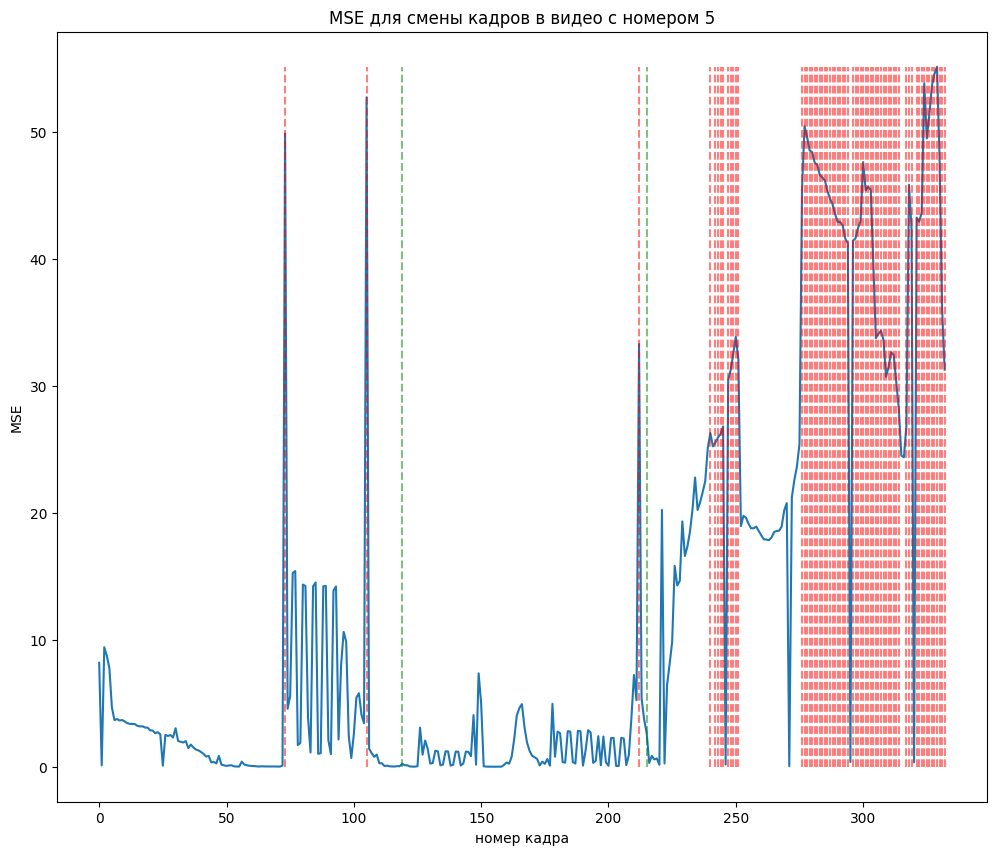

(array([410, 411, 412, 408, 413, 485, 482, 481, 415, 477, 500, 499, 498,
        497, 496, 495, 494, 493, 492, 491, 490, 489, 487, 486, 452, 451,
        450, 449, 448, 447, 446, 445, 444, 468, 467, 466, 465, 464, 462,
        461, 460, 459, 458, 457, 456, 455, 454, 453, 419, 418, 417, 416,
        380, 273, 480, 479, 478, 476, 475, 474, 473, 472, 471, 470, 469,
        241]),
 True,
 True)

In [ ]:
# max_end_time = 50

# возвращает массив h% пиков для ind_video
def peaks(ind_video, h, show_flag=True):
    # start, end - измеряется в кадрах
    # g по оси x имеет смену кадра с i - 1 на i
    g, (start_frame, end_frame), bias, fps = MSE_in_changing_scene_histogram(ind_video)
    if start_frame > end_frame:
        return None
    
    min_peaks = 3
    h_peaks = max(min_peaks, int(len(g) * (float(h) / 100)))
    idx = np.argpartition(g, -h_peaks, axis=0)[-h_peaks:] + bias

    possible_window = int(1 * fps)
    is_start = any(abs(x - start_frame) <= possible_window for x in idx)
    is_end = any(abs(x - end_frame) <= possible_window for x in idx)
    if show_flag:
        print(start_frame, end_frame, f"is_start = {is_start}, is_end = {is_end}")

        plt.figure(figsize=(12, 10))
        plt.plot(g)
        plt.vlines(x=idx - bias, ymin=min(g), ymax=max(g), colors='r', linestyle='--', alpha=0.5)
        plt.vlines(x=[start_frame - bias, end_frame-bias], ymin=min(g), ymax=max(g), colors='g', linestyle='--', alpha=0.5)
        plt.title(f"MSE для смены кадров в видео с номером {ind_video}")
        plt.xlabel("номер кадра")
        plt.ylabel("MSE")
        plt.show()
    
    return idx, is_start, is_end

peaks(5, 20)

100%|██████████| 648/648 [00:58<00:00, 11.02it/s]0 [00:00<?, ?it/s]


360 768 is_start = True, is_end = False


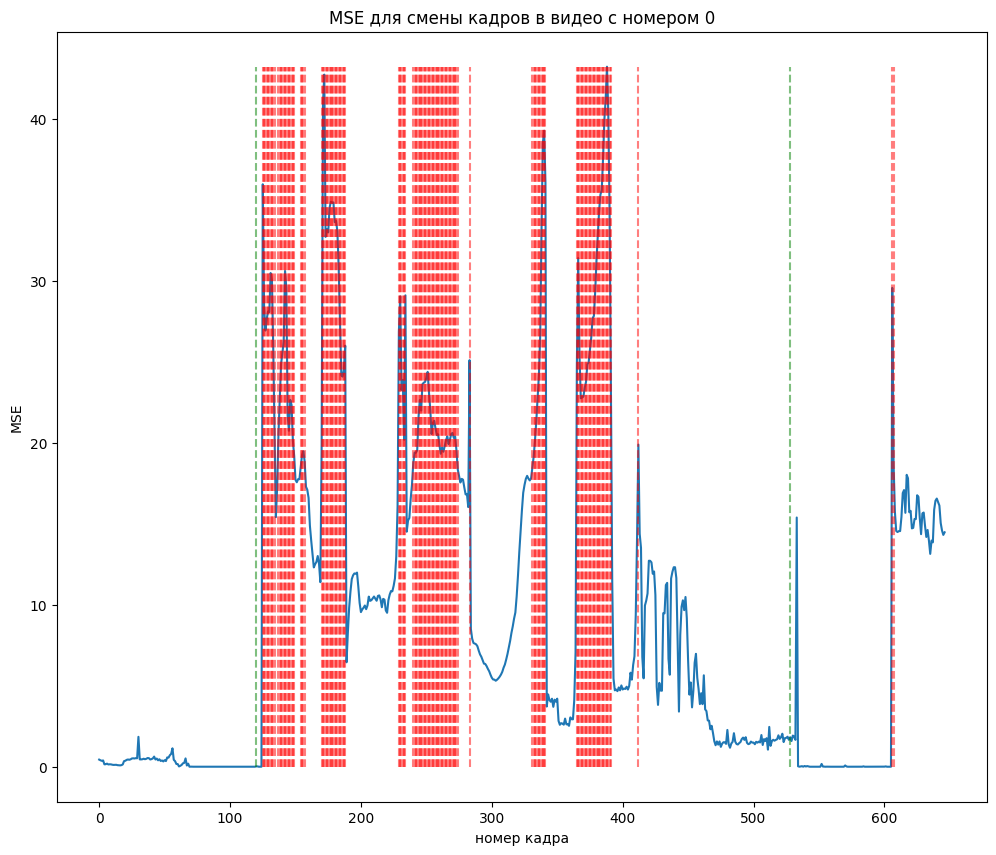

100%|██████████| 429/429 [00:06<00:00, 70.84it/s]0 [00:59<1:17:42, 59.02s/it]


839 1030 is_start = True, is_end = True


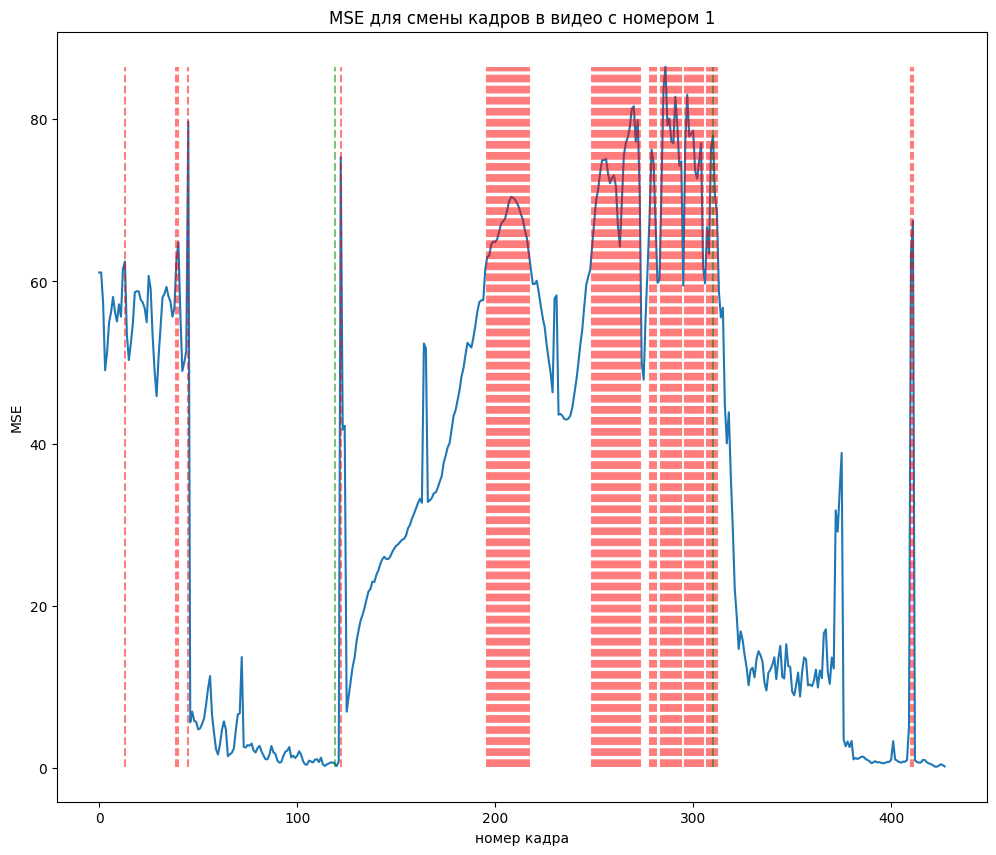

100%|██████████| 429/429 [00:06<00:00, 65.87it/s]0 [01:05<36:22, 27.98s/it]  


839 1030 is_start = True, is_end = True


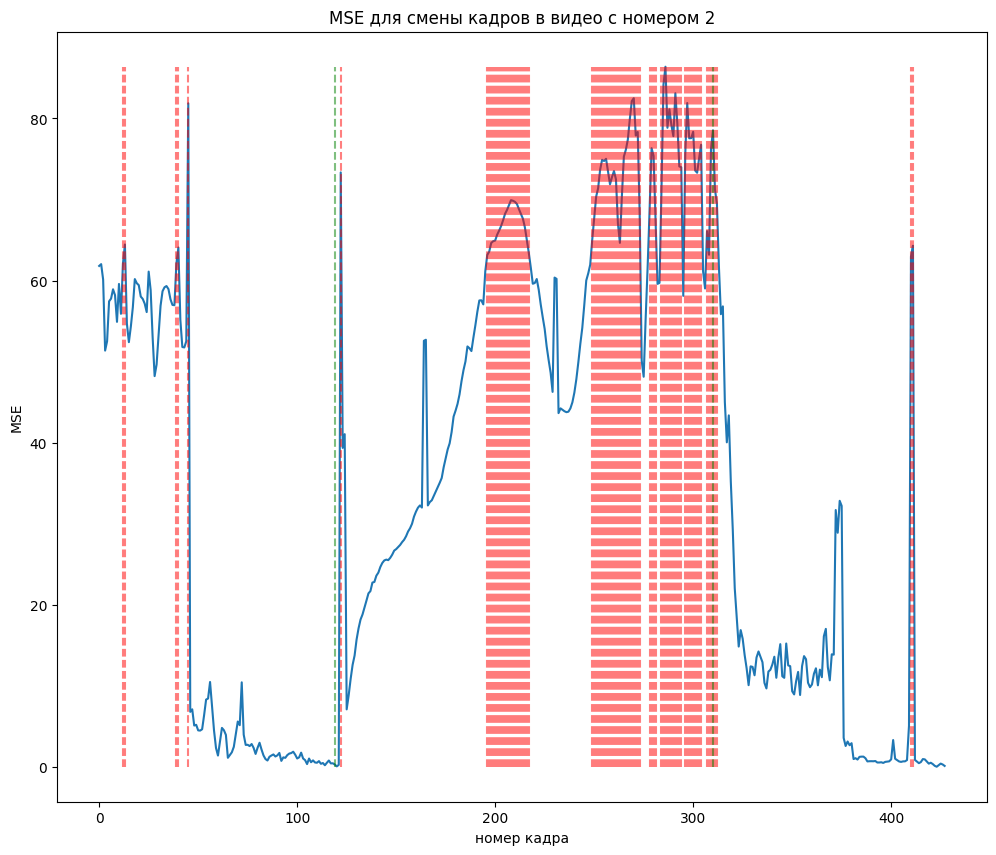

100%|██████████| 405/405 [00:06<00:00, 66.85it/s]0 [01:11<23:26, 18.27s/it]


839 1006 is_start = True, is_end = True


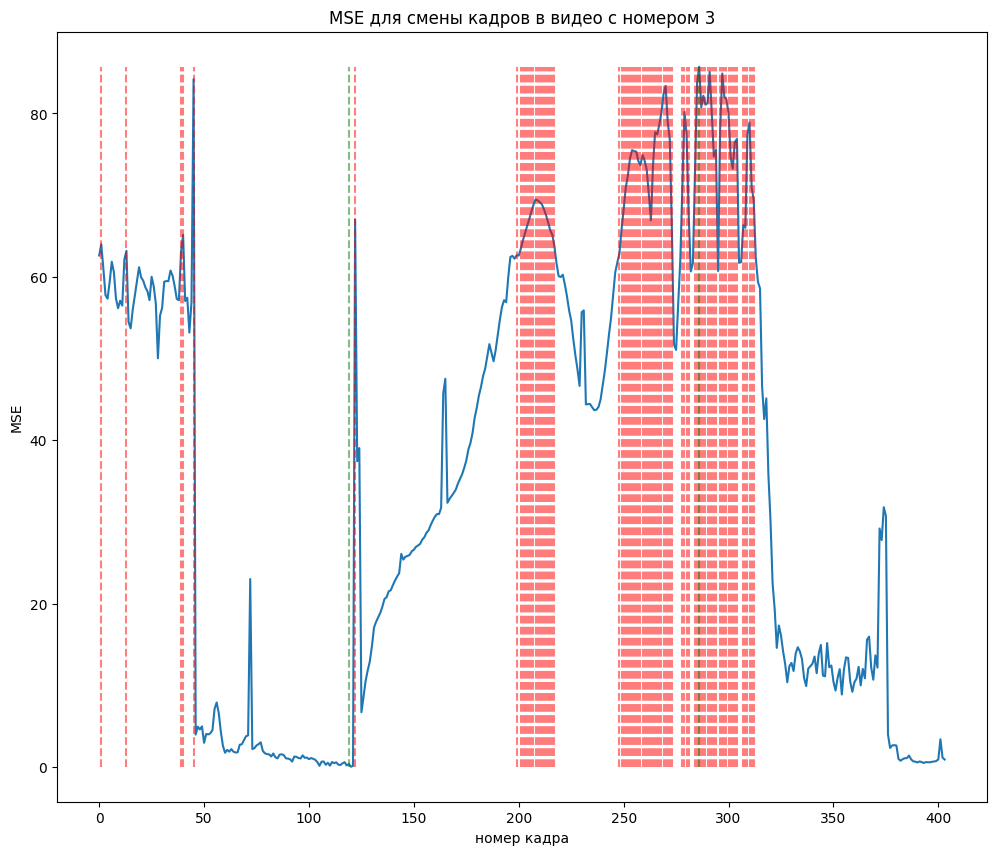

100%|██████████| 405/405 [00:06<00:00, 66.94it/s]0 [01:18<17:07, 13.52s/it]


839 1006 is_start = True, is_end = True


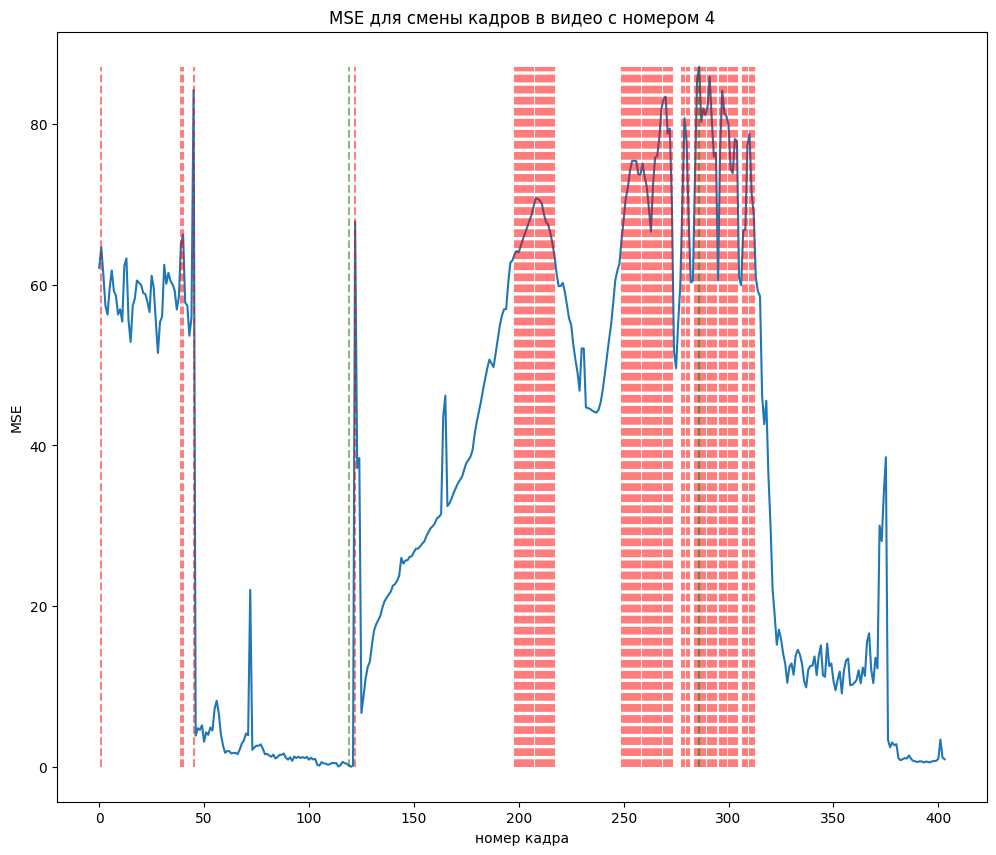

100%|██████████| 334/334 [00:04<00:00, 67.05it/s]0 [01:24<13:36, 10.89s/it]


287 383 is_start = True, is_end = True


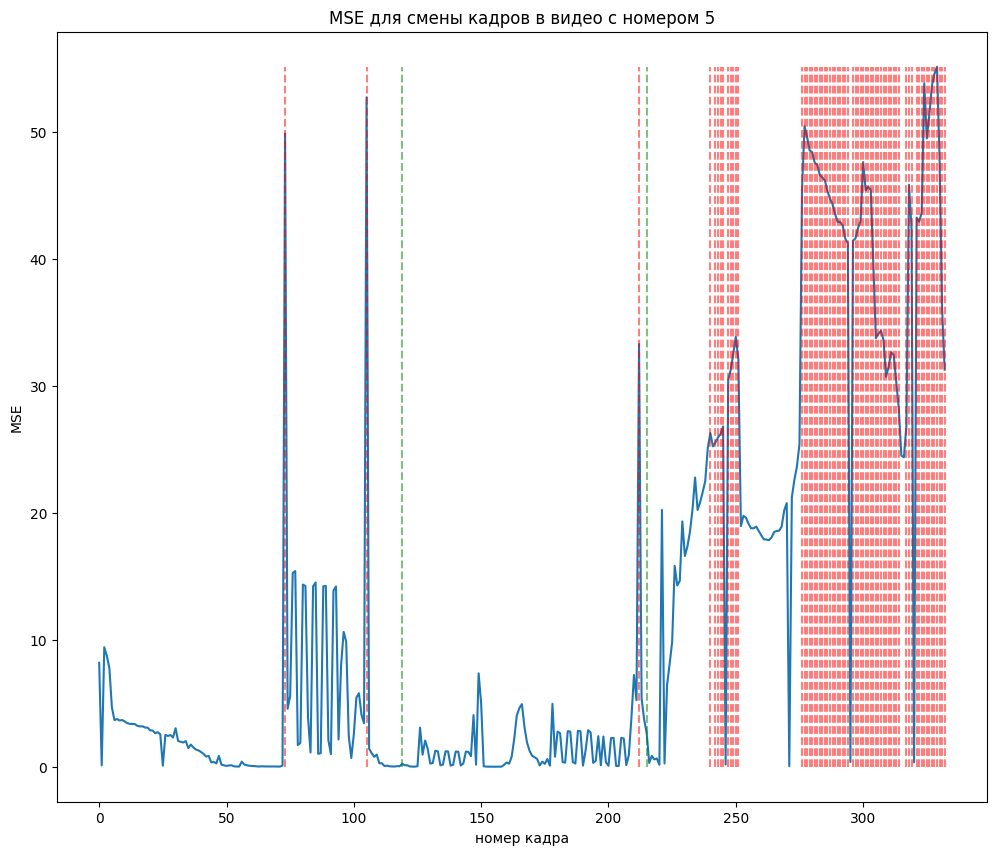

100%|██████████| 406/406 [00:06<00:00, 64.40it/s]0 [01:29<11:01,  8.93s/it]


263 431 is_start = True, is_end = True


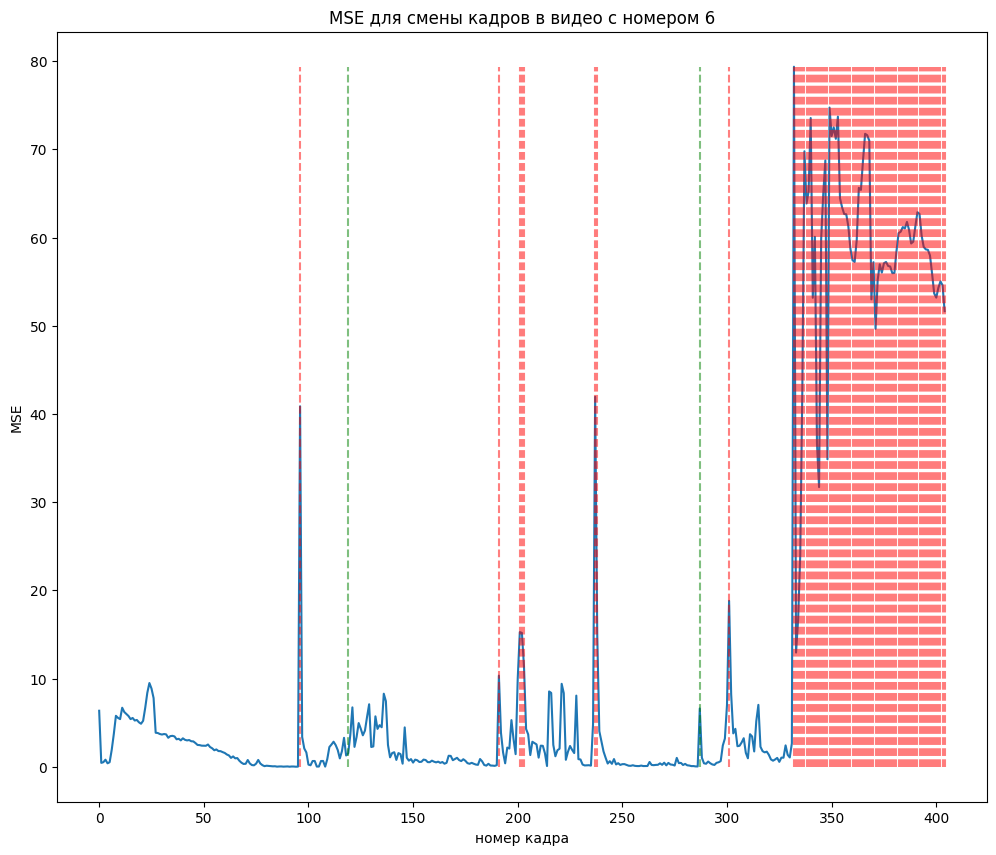

прогон по (почти)всем видео:   9%|▉         | 7/80 [01:36<09:53,  8.14s/it]C:\Users\Vesnuchka\AppData\Local\Temp\ipykernel_8880\384335079.py:63: RuntimeWarning: invalid value encountered in divide
  sobel_normalized = np.uint8(sobel_magnitude / sobel_magnitude.max() * 255)
C:\Users\Vesnuchka\AppData\Local\Temp\ipykernel_8880\384335079.py:63: RuntimeWarning: invalid value encountered in cast
  sobel_normalized = np.uint8(sobel_magnitude / sobel_magnitude.max() * 255)
100%|██████████| 382/382 [00:05<00:00, 67.75it/s]


239 383 is_start = True, is_end = True


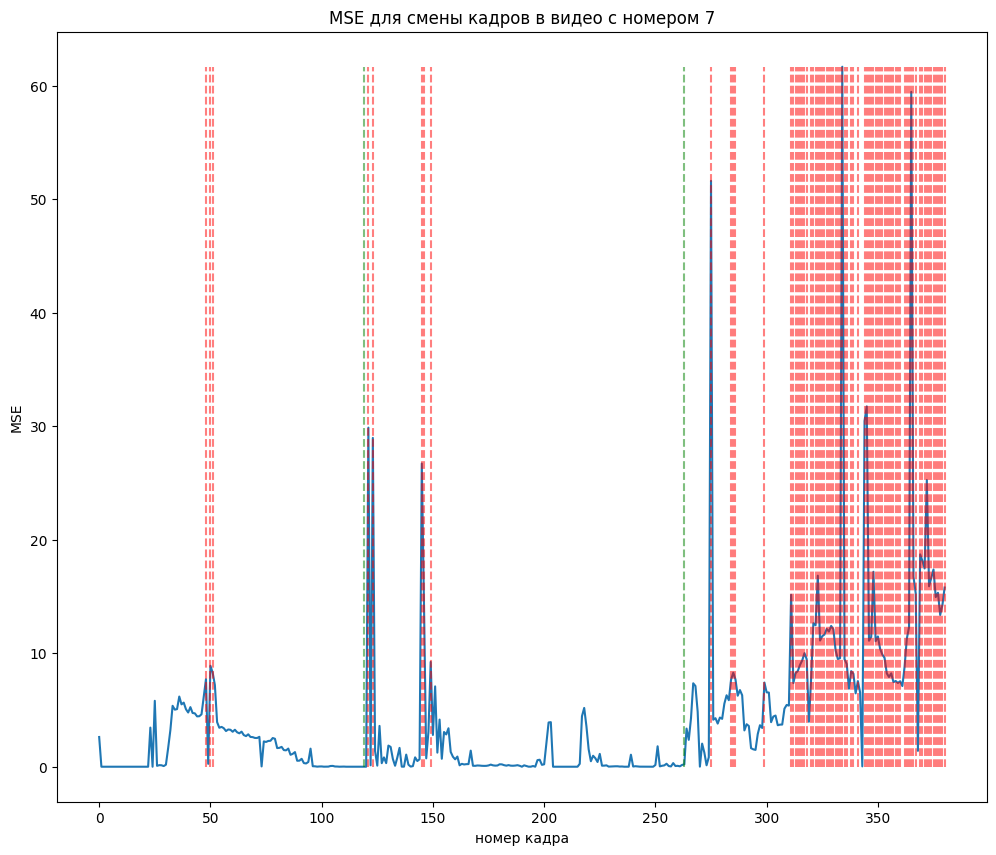

100%|██████████| 358/358 [00:05<00:00, 67.26it/s]0 [01:41<08:52,  7.39s/it]


263 383 is_start = True, is_end = True


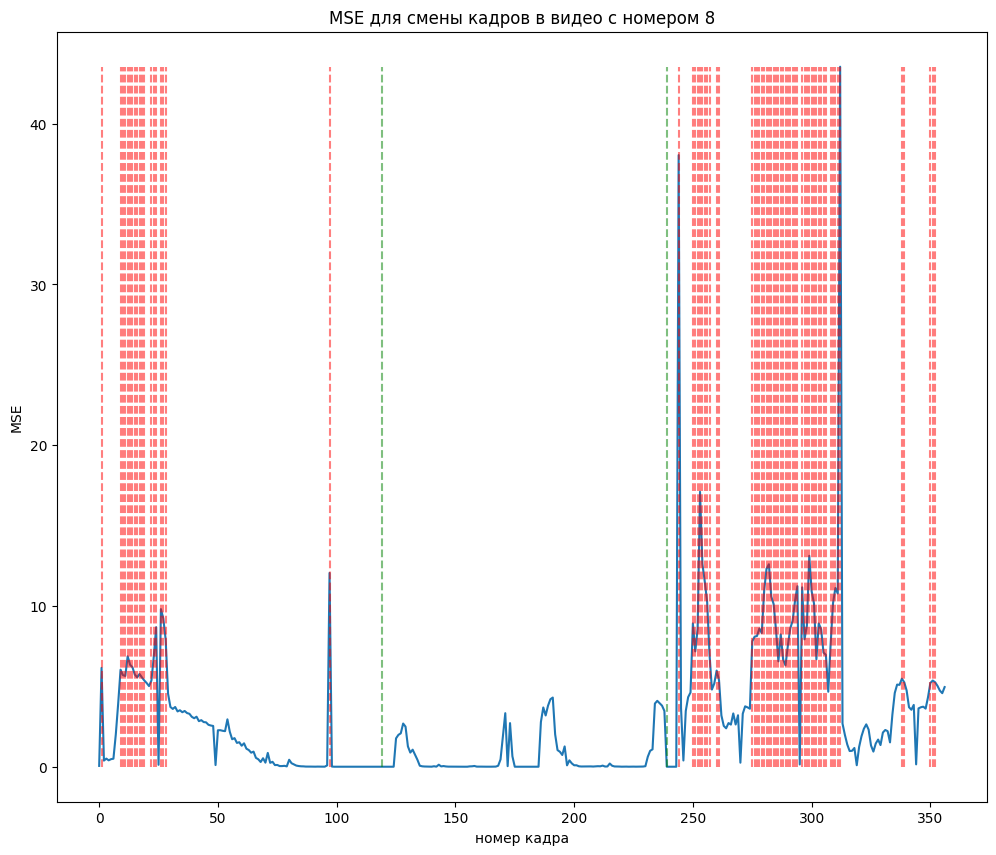

100%|██████████| 358/358 [00:05<00:00, 67.44it/s]0 [01:47<08:02,  6.79s/it]


239 359 is_start = True, is_end = True


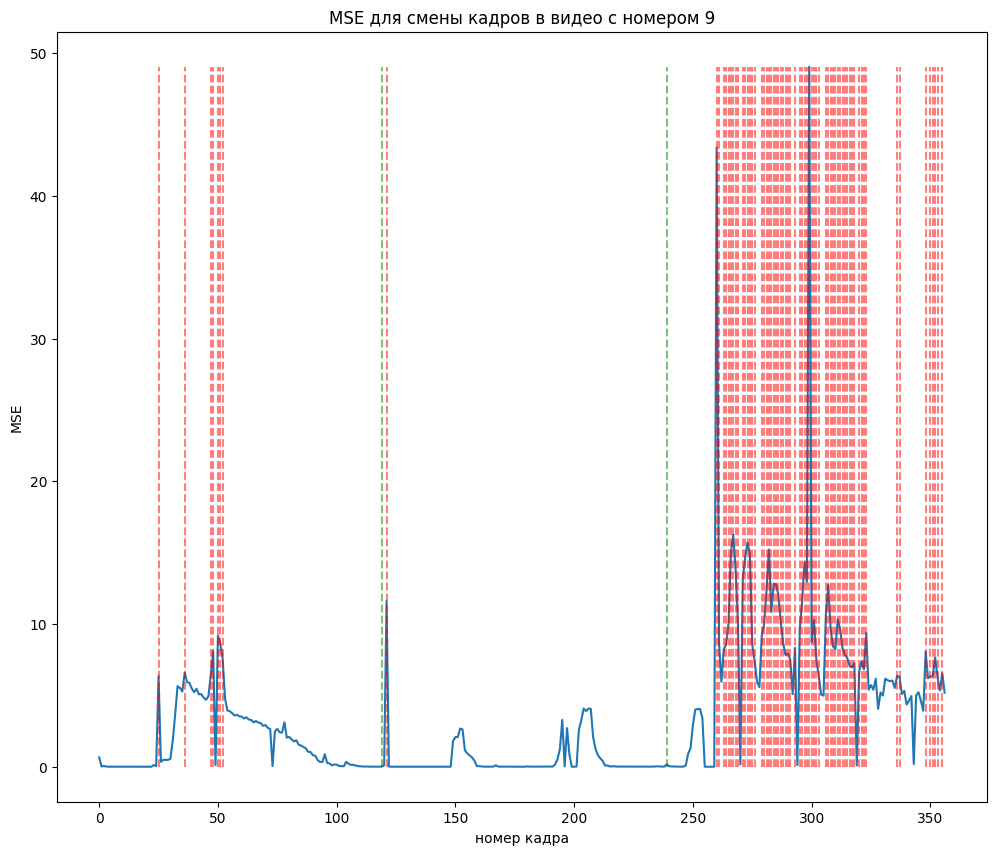

100%|██████████| 358/358 [00:05<00:00, 66.38it/s]80 [01:52<07:28,  6.40s/it]


239 359 is_start = False, is_end = False


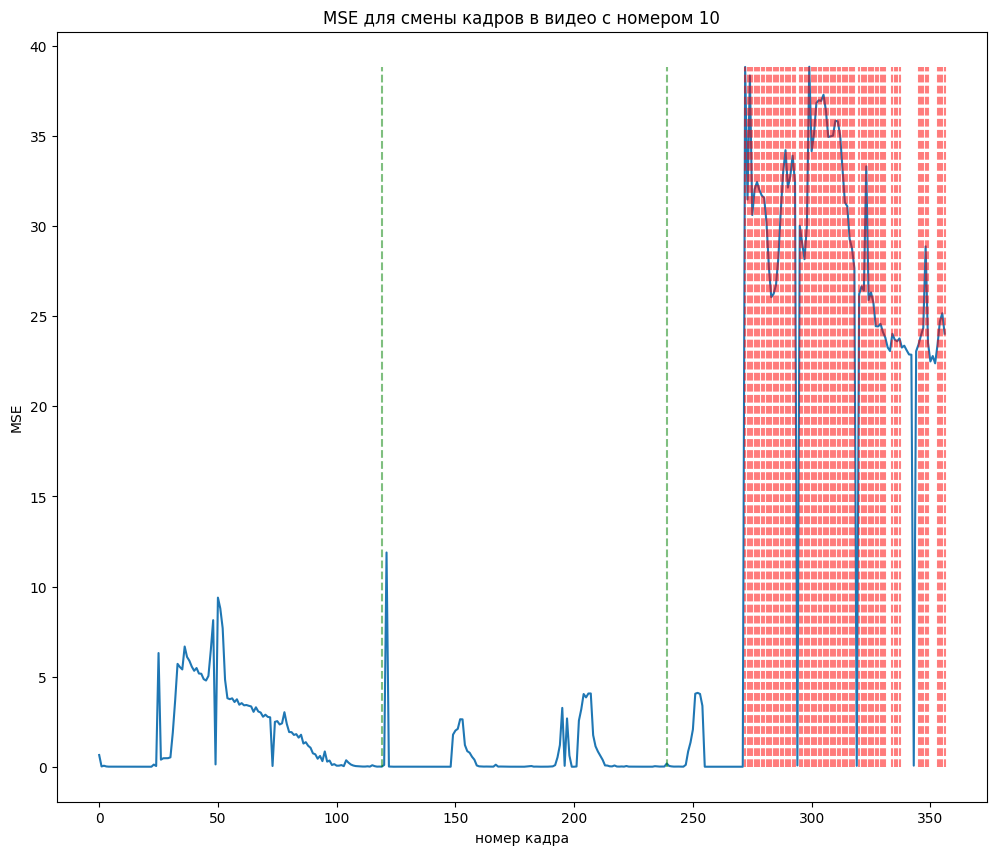

100%|██████████| 358/358 [00:05<00:00, 66.47it/s]80 [01:58<07:03,  6.14s/it]


239 359 is_start = True, is_end = False


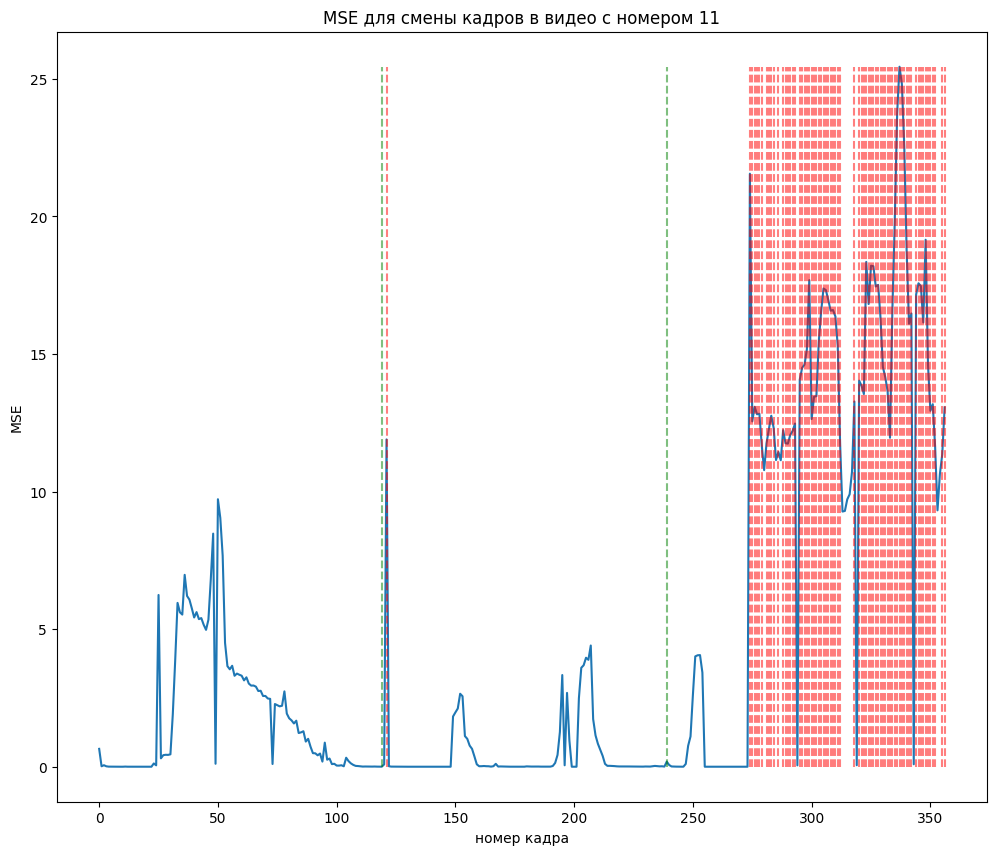

100%|██████████| 358/358 [00:05<00:00, 68.94it/s]80 [02:03<06:45,  5.96s/it]


239 359 is_start = True, is_end = False


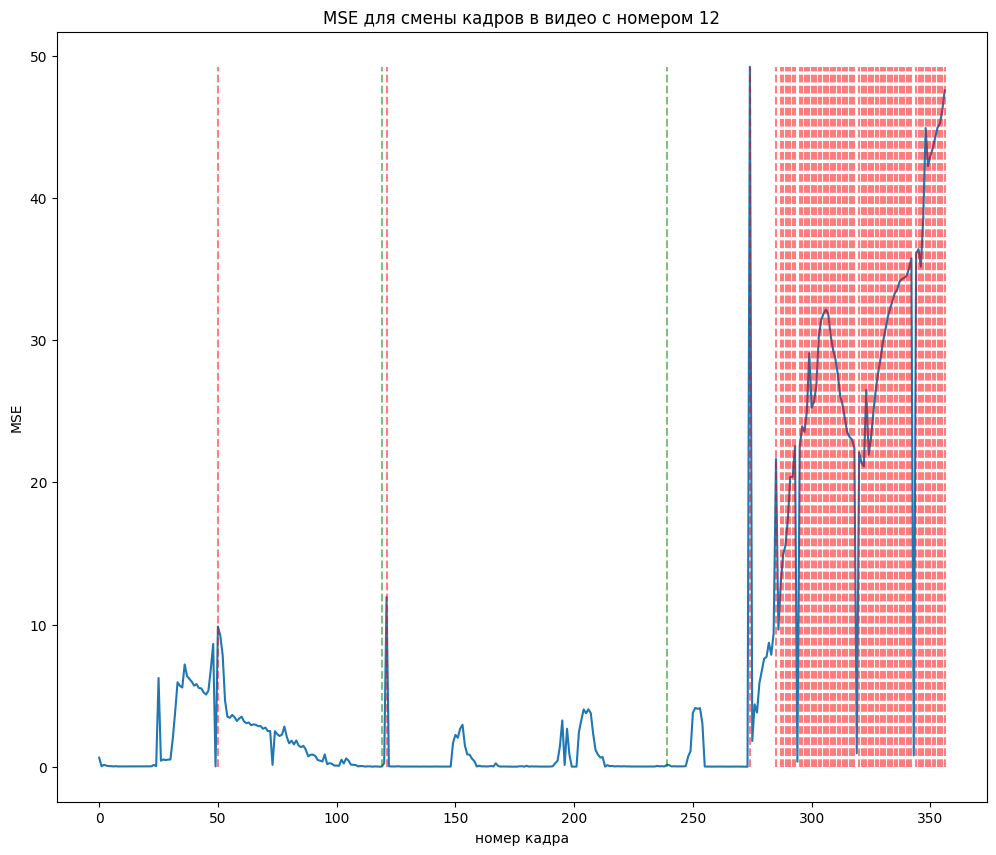

100%|██████████| 454/454 [00:06<00:00, 67.12it/s]80 [02:09<06:26,  5.77s/it]


239 455 is_start = True, is_end = True


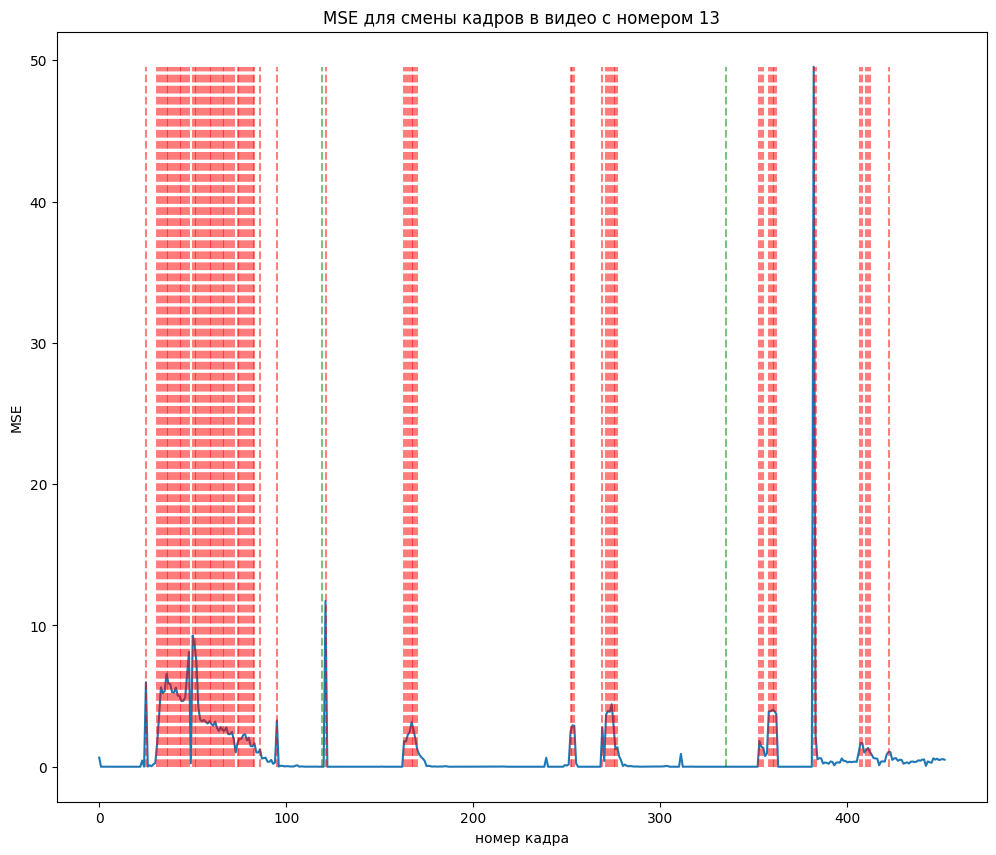

100%|██████████| 358/358 [00:05<00:00, 59.81it/s]80 [02:16<06:43,  6.12s/it]


239 359 is_start = False, is_end = True


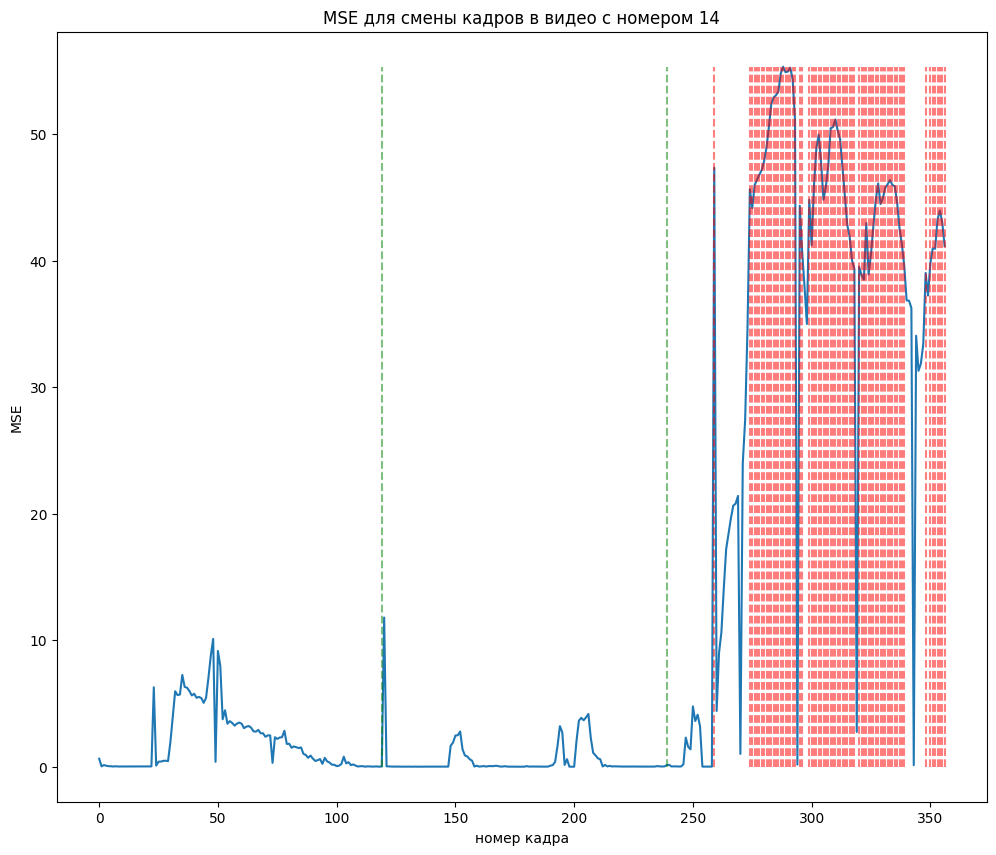

100%|██████████| 1677/1677 [00:09<00:00, 173.41it/s][02:22<06:38,  6.12s/it]


2157 3596 is_start = True, is_end = True


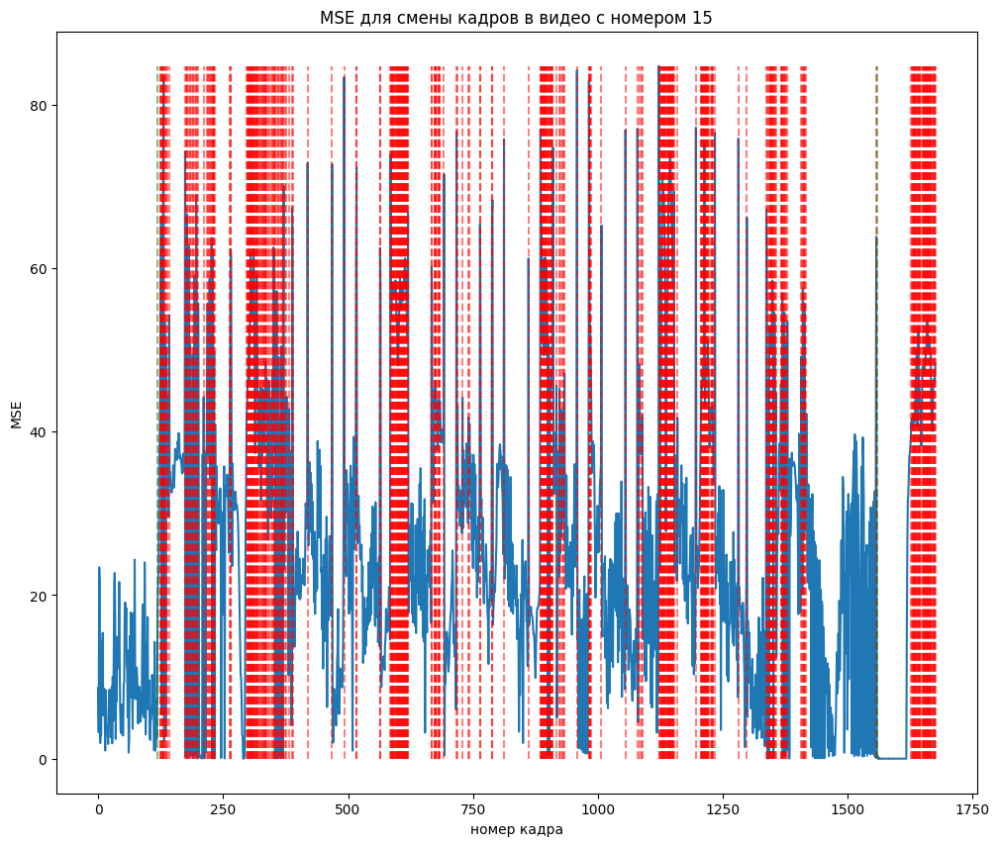

100%|██████████| 334/334 [00:04<00:00, 67.71it/s]80 [02:32<07:44,  7.25s/it]


143 239 is_start = True, is_end = True


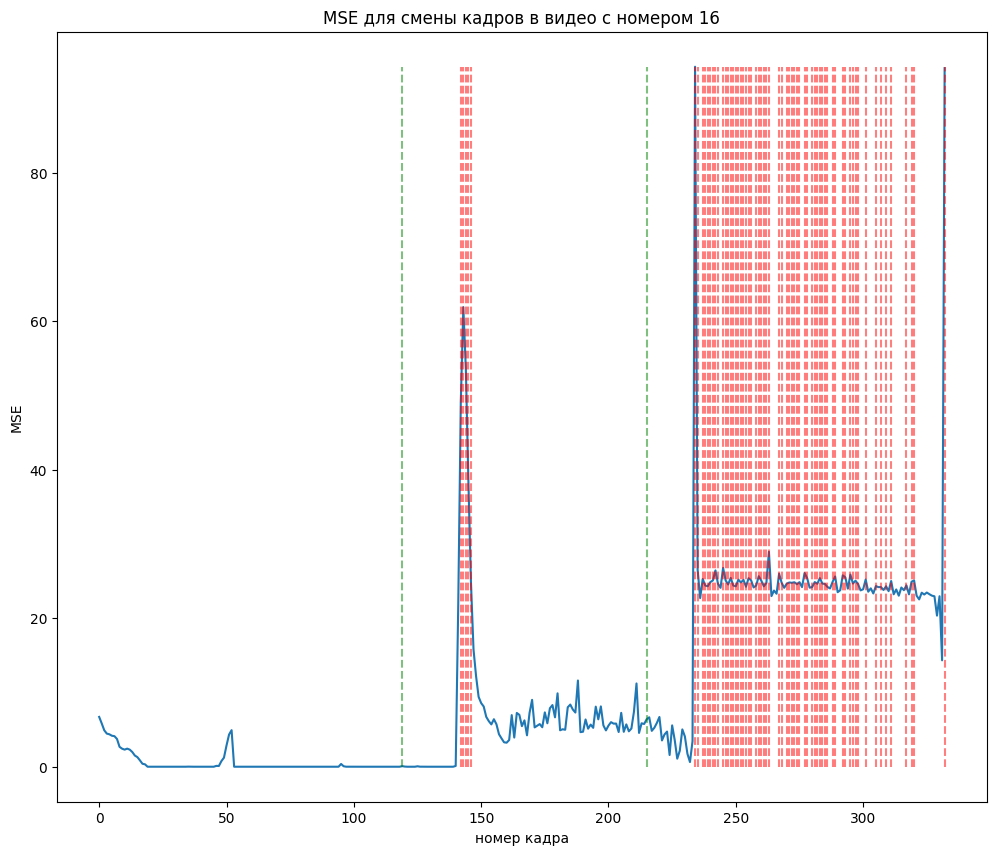

100%|██████████| 334/334 [00:04<00:00, 69.02it/s]80 [02:37<06:55,  6.60s/it]


143 239 is_start = True, is_end = True


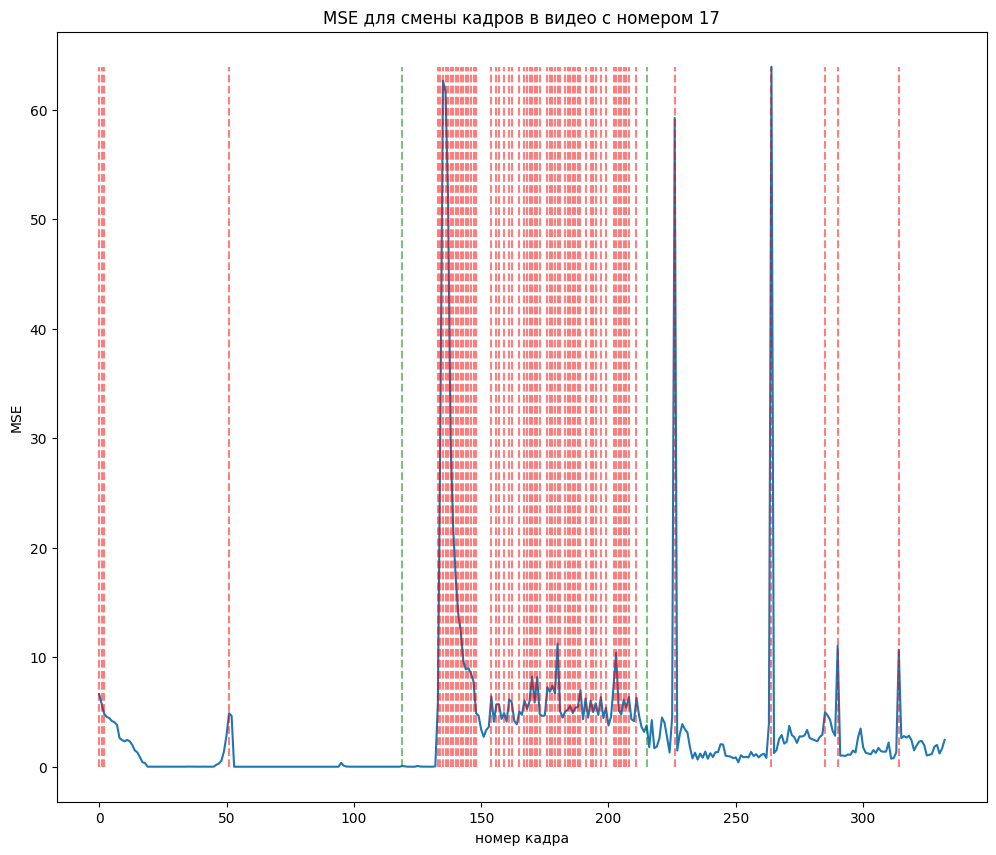

100%|██████████| 334/334 [00:04<00:00, 69.26it/s]80 [02:42<06:21,  6.15s/it]


143 239 is_start = False, is_end = True


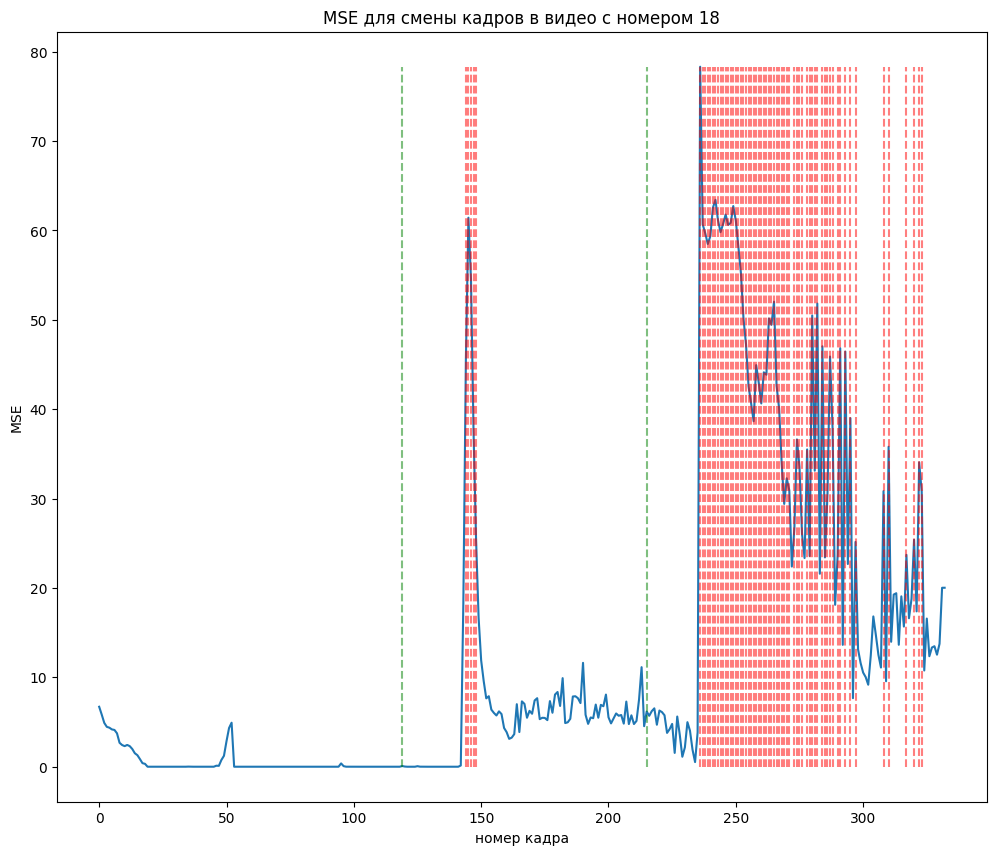

100%|██████████| 350/350 [00:05<00:00, 68.80it/s]80 [02:47<05:53,  5.80s/it]


150 250 is_start = True, is_end = True


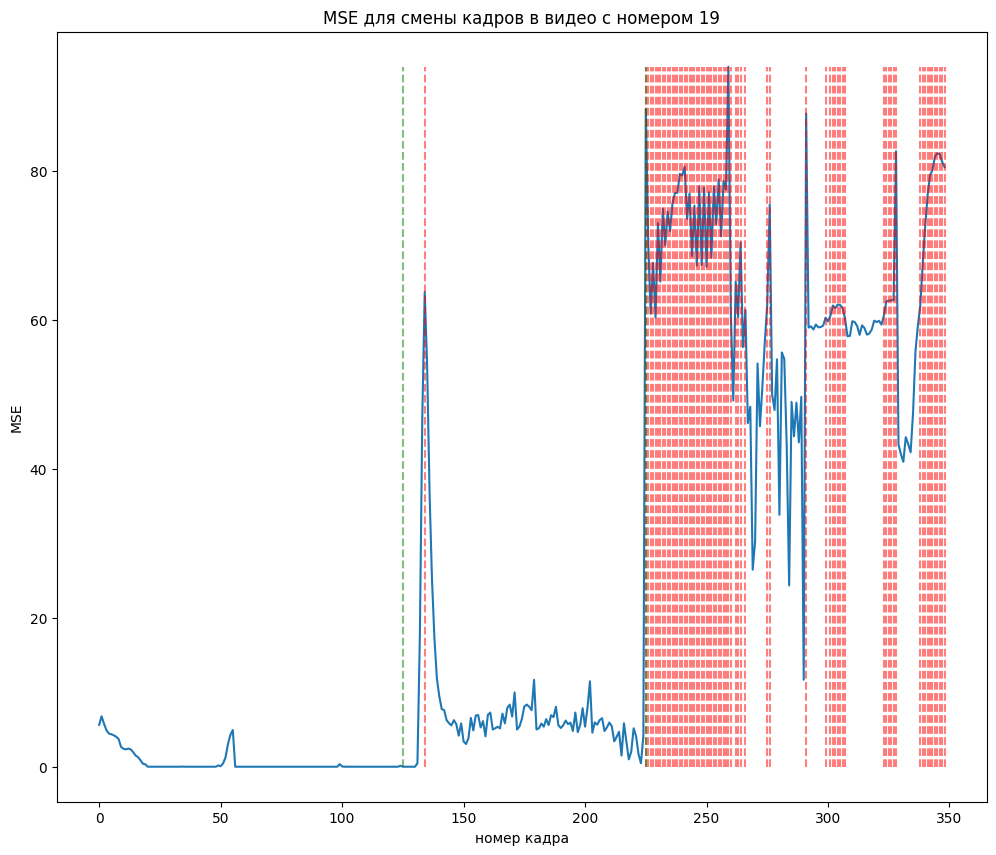

100%|██████████| 350/350 [00:05<00:00, 67.93it/s]80 [02:52<05:37,  5.63s/it]


150 250 is_start = True, is_end = True


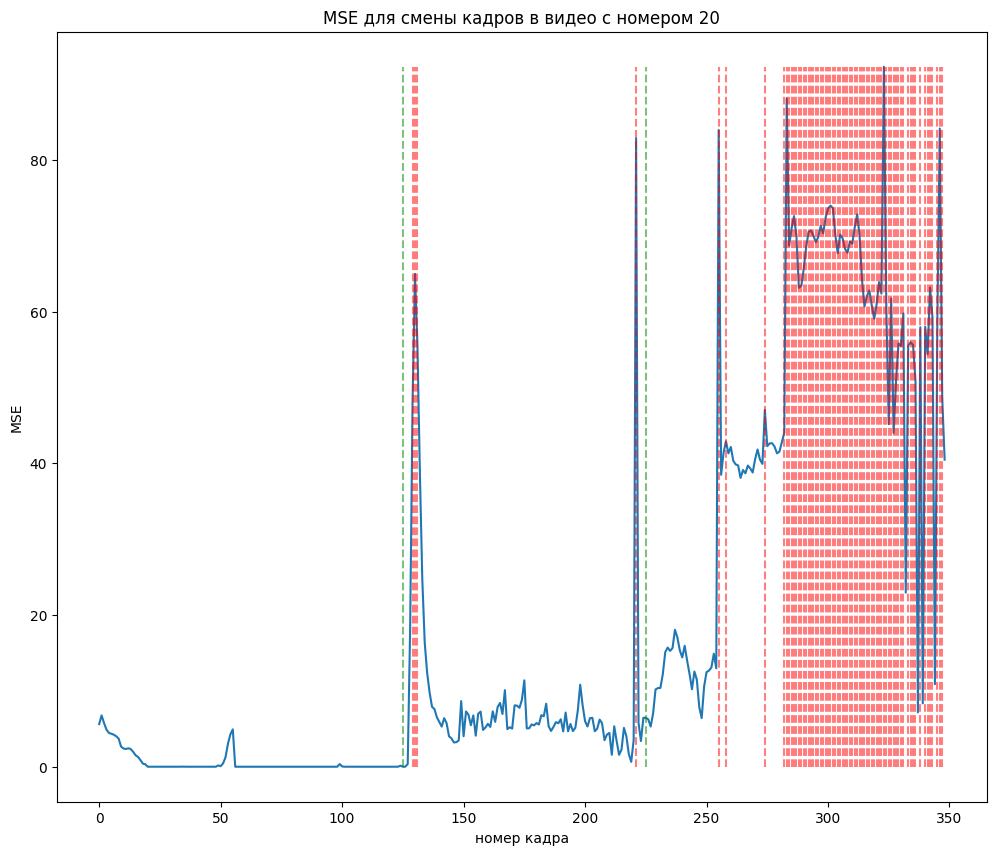

100%|██████████| 350/350 [00:05<00:00, 68.16it/s]80 [02:57<05:26,  5.53s/it]


150 250 is_start = True, is_end = True


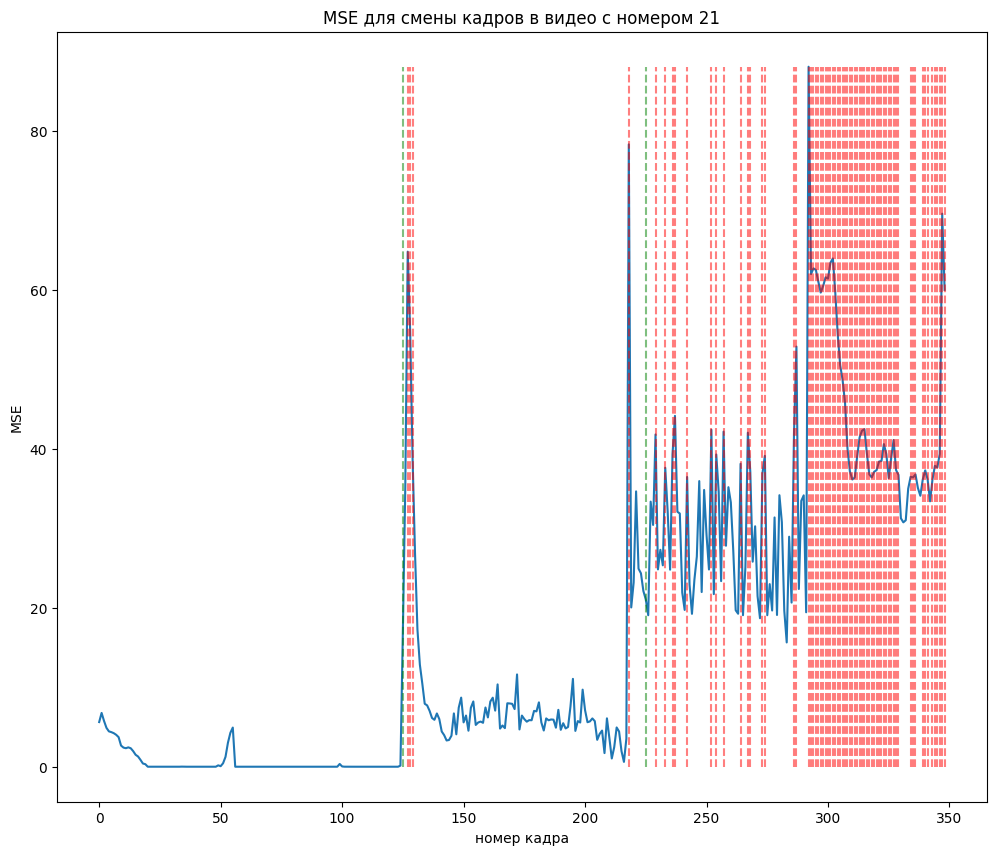

100%|██████████| 350/350 [00:05<00:00, 68.80it/s]80 [03:03<05:16,  5.46s/it]


150 250 is_start = True, is_end = True


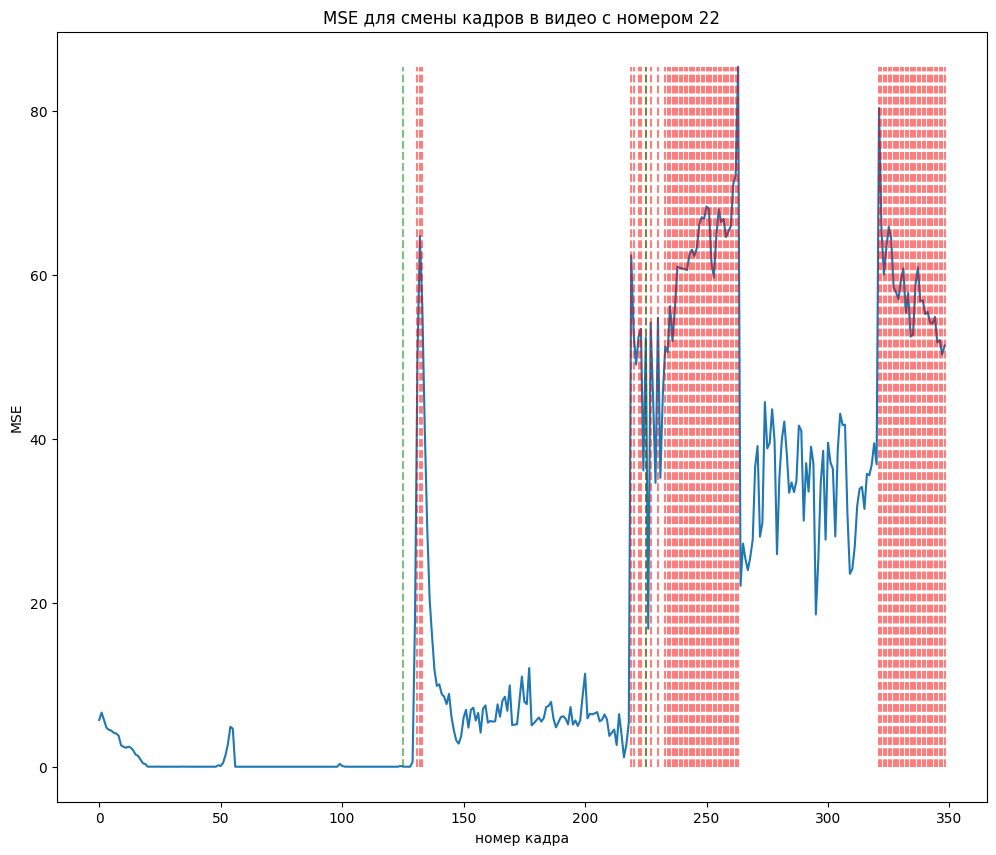

100%|██████████| 350/350 [00:05<00:00, 67.93it/s]80 [03:08<05:07,  5.39s/it]


150 250 is_start = True, is_end = True


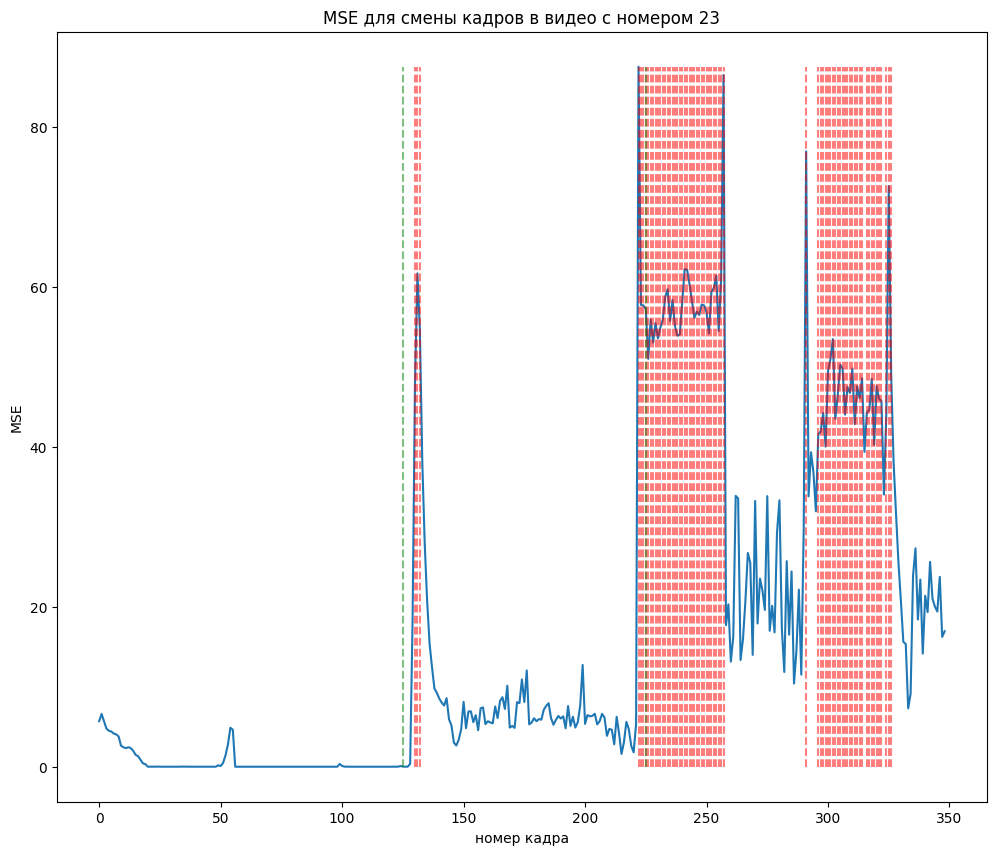

100%|██████████| 348/348 [00:05<00:00, 69.39it/s]80 [03:13<05:00,  5.36s/it]


149 249 is_start = True, is_end = True


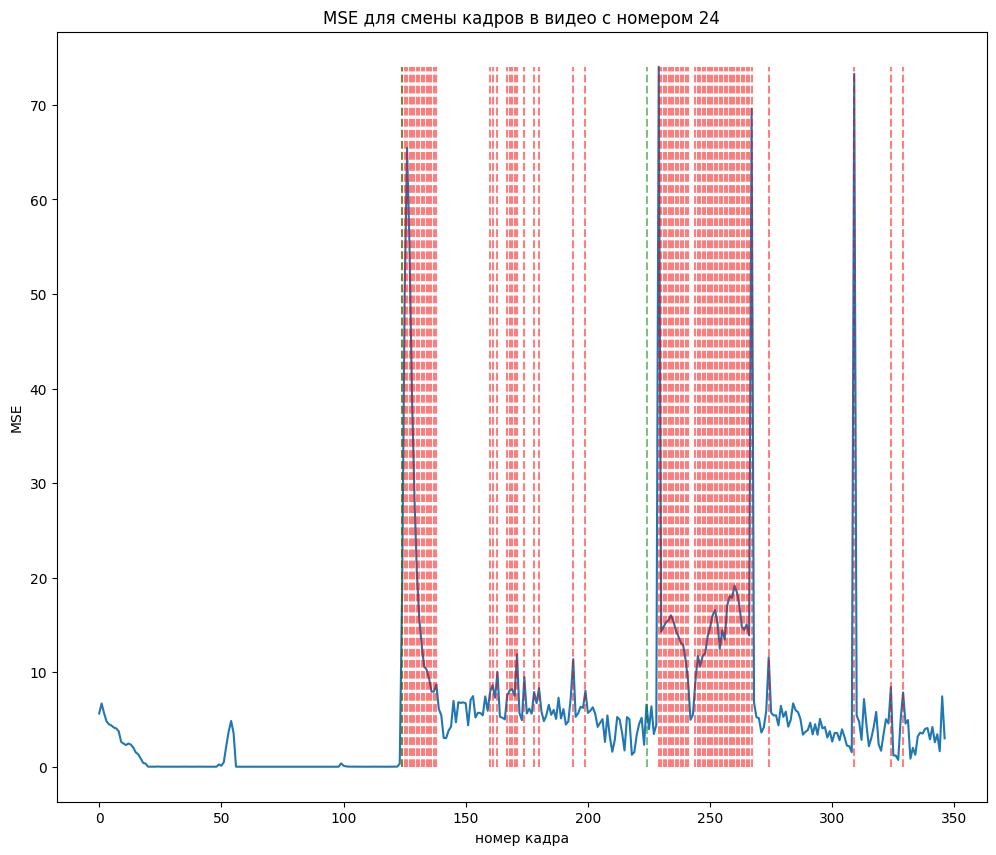

100%|██████████| 400/400 [00:04<00:00, 94.87it/s]80 [03:18<04:51,  5.31s/it]


150 300 is_start = True, is_end = True


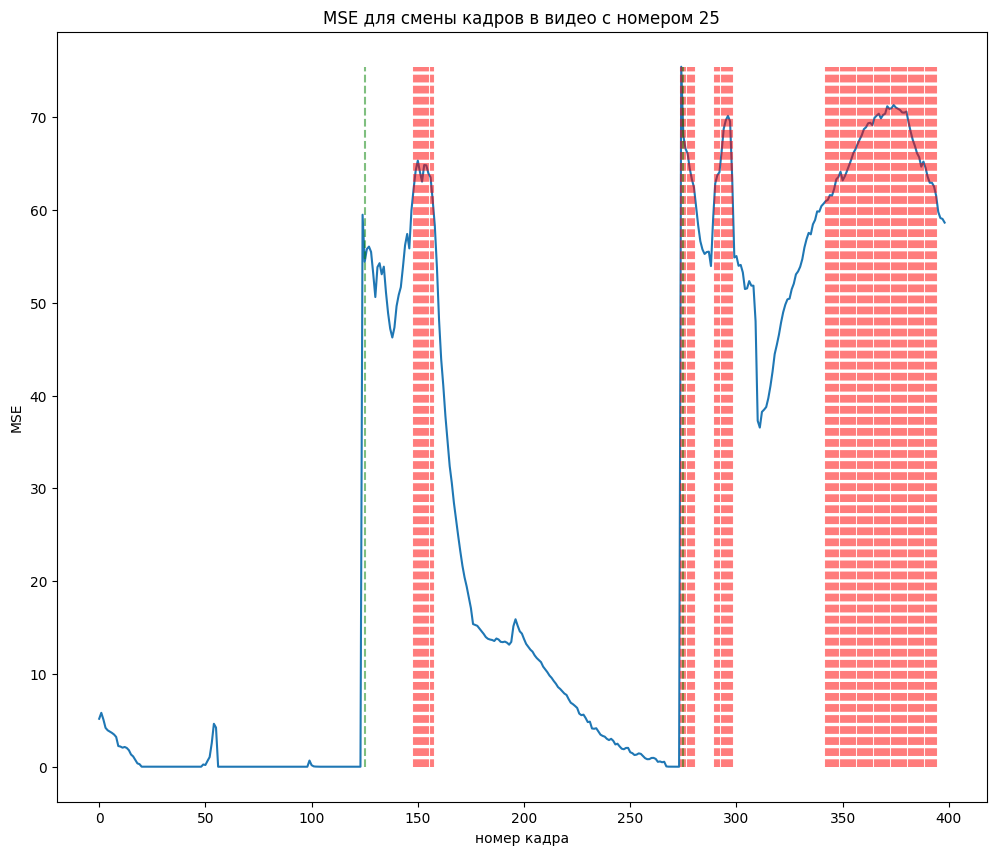

100%|██████████| 1222/1222 [00:17<00:00, 69.26it/s] [03:23<04:31,  5.03s/it]


10823 11807 is_start = True, is_end = True


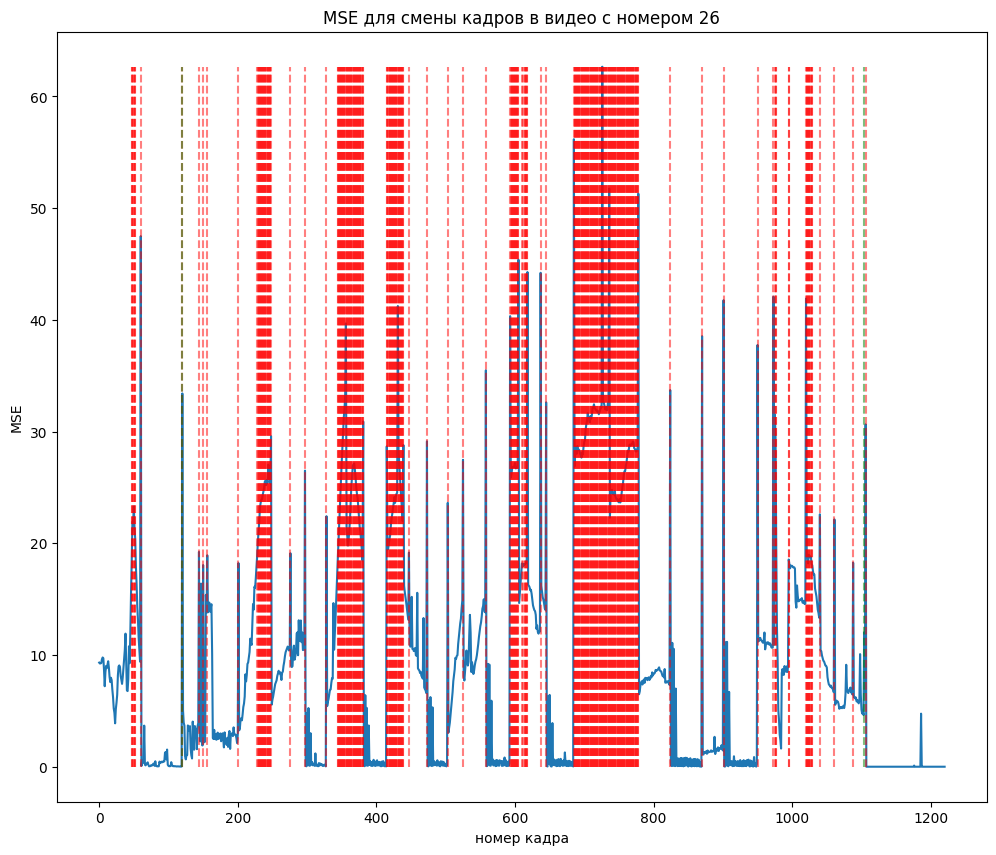

100%|██████████| 1246/1246 [00:18<00:00, 69.17it/s] [03:41<07:50,  8.87s/it]


16991 17999 is_start = True, is_end = False


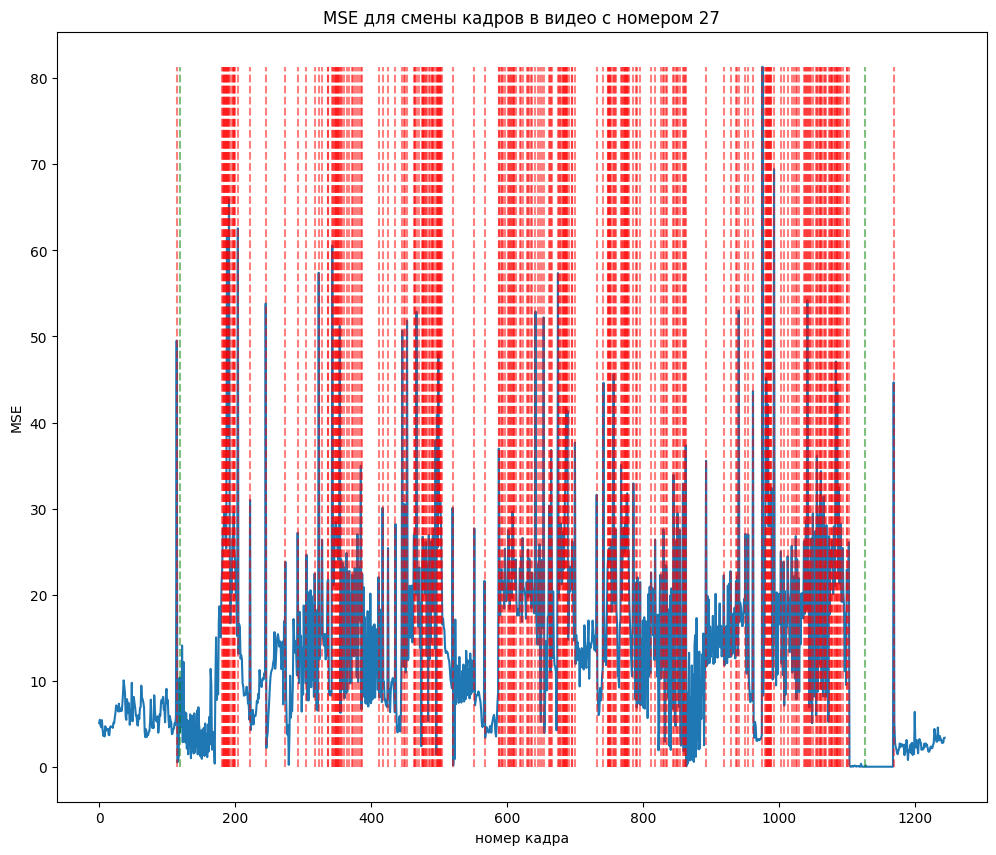

100%|██████████| 336/336 [00:04<00:00, 67.90it/s]80 [03:59<10:07, 11.67s/it]


216 312 is_start = False, is_end = True


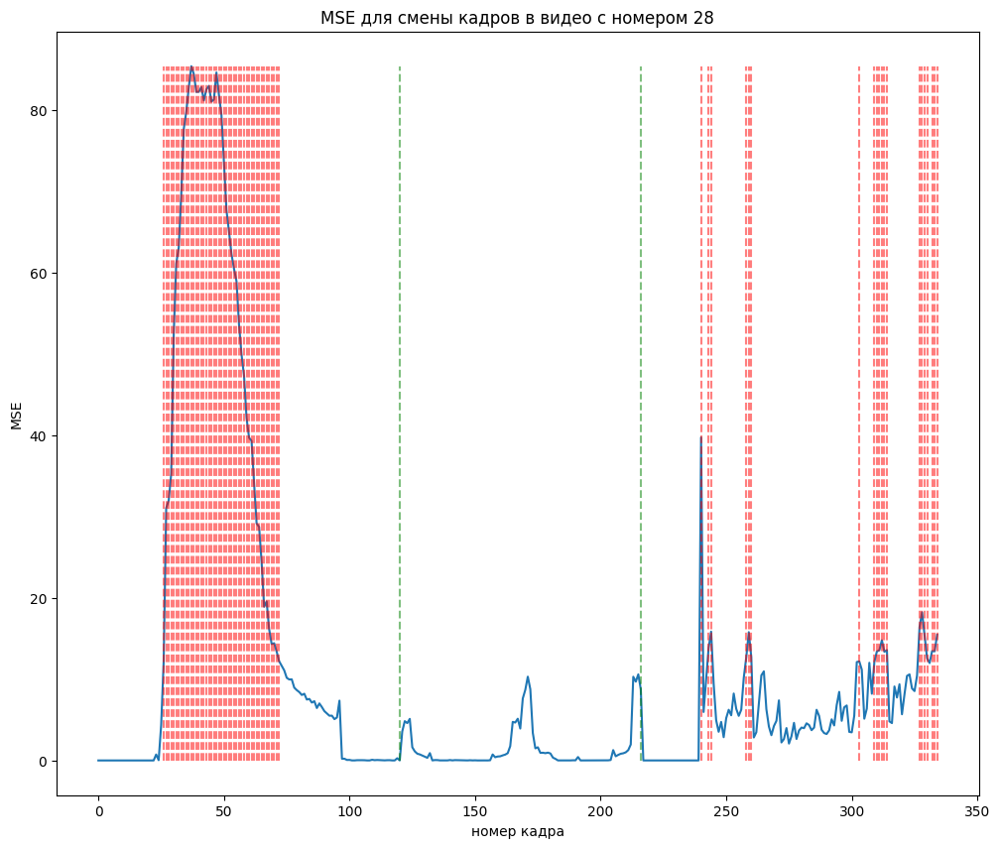

100%|██████████| 384/384 [00:05<00:00, 68.69it/s]80 [04:04<08:14,  9.70s/it]


120 264 is_start = True, is_end = True


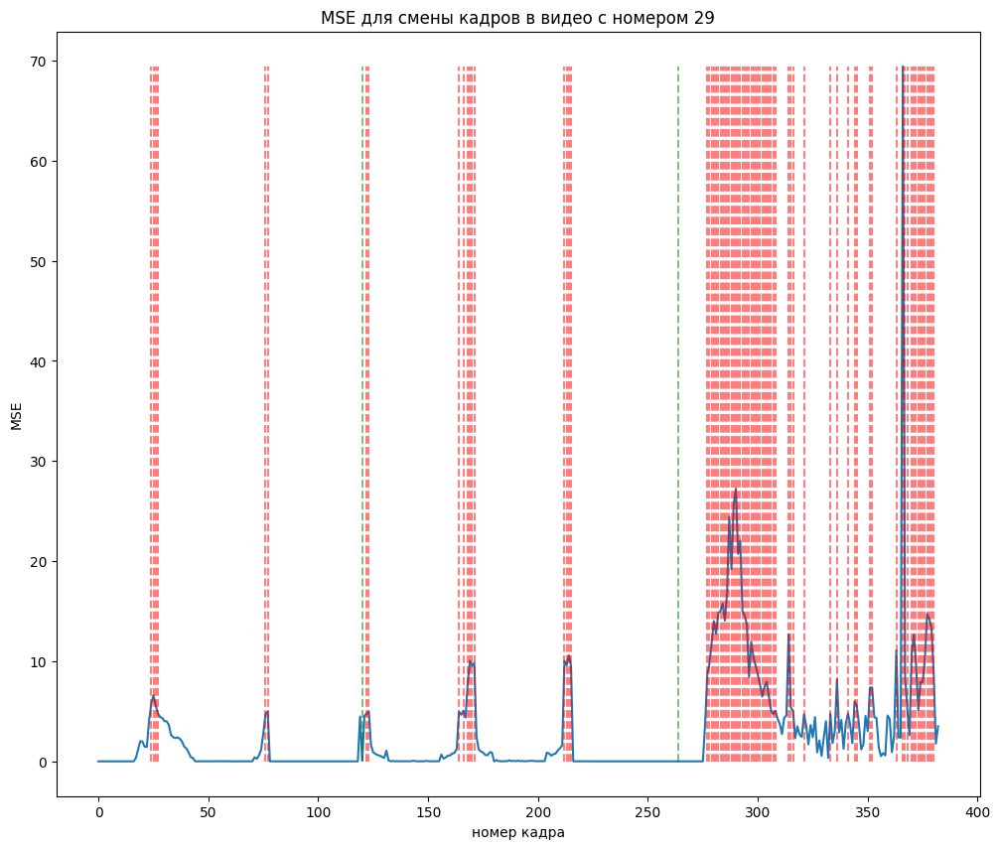

100%|██████████| 1318/1318 [00:19<00:00, 67.75it/s] [04:10<07:05,  8.51s/it]


10991 12071 is_start = True, is_end = True


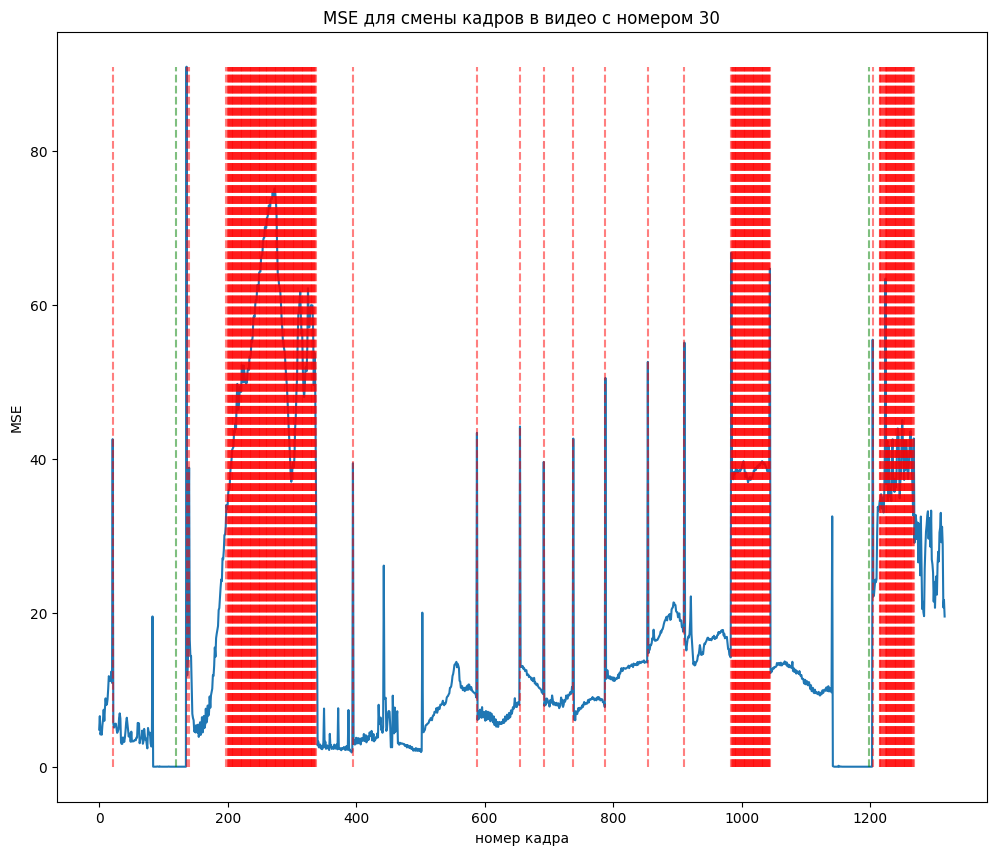

100%|██████████| 430/430 [00:06<00:00, 68.48it/s]80 [04:29<09:41, 11.86s/it]


239 431 is_start = True, is_end = True


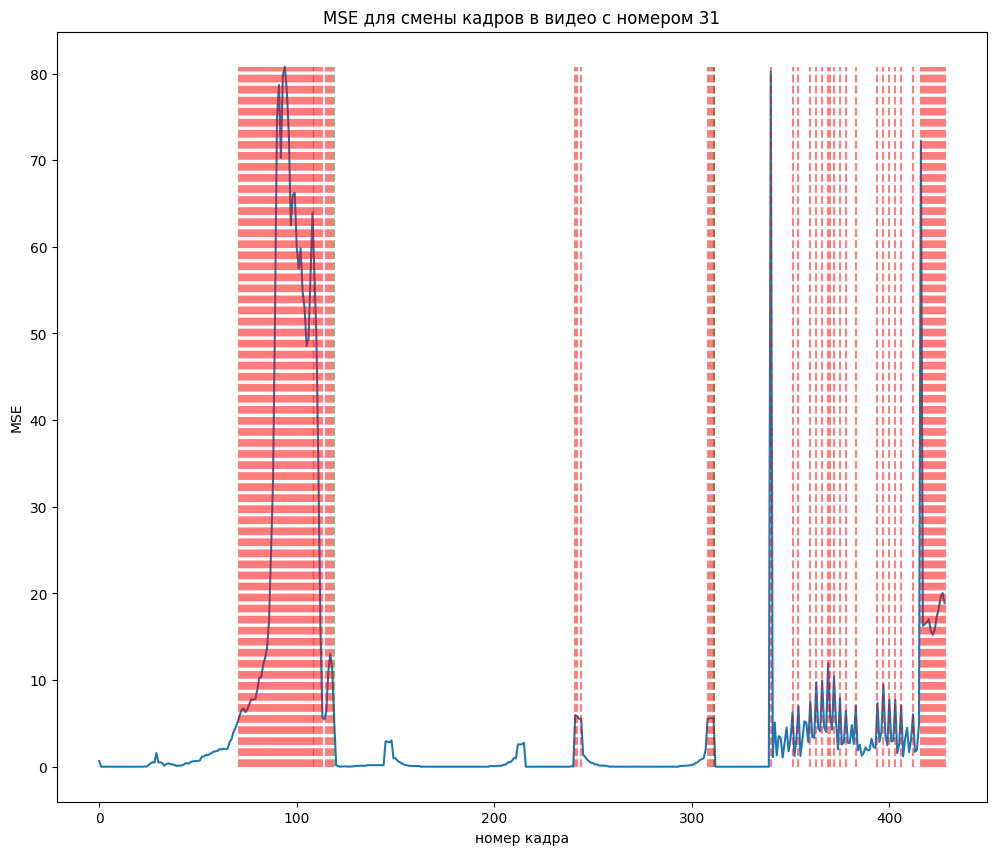

100%|██████████| 1752/1752 [00:25<00:00, 67.50it/s] [04:36<08:11, 10.24s/it]


2784 4296 is_start = True, is_end = True


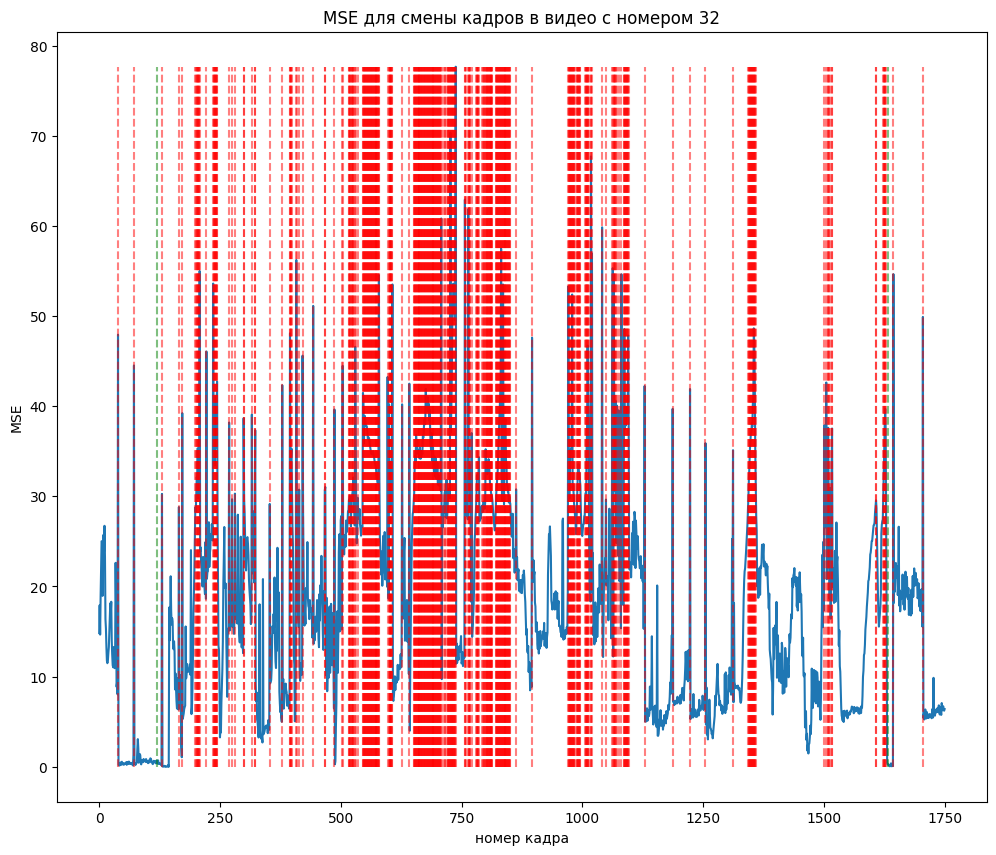

100%|██████████| 400/400 [00:06<00:00, 66.36it/s]80 [05:02<11:45, 15.02s/it]


900 1050 is_start = False, is_end = True


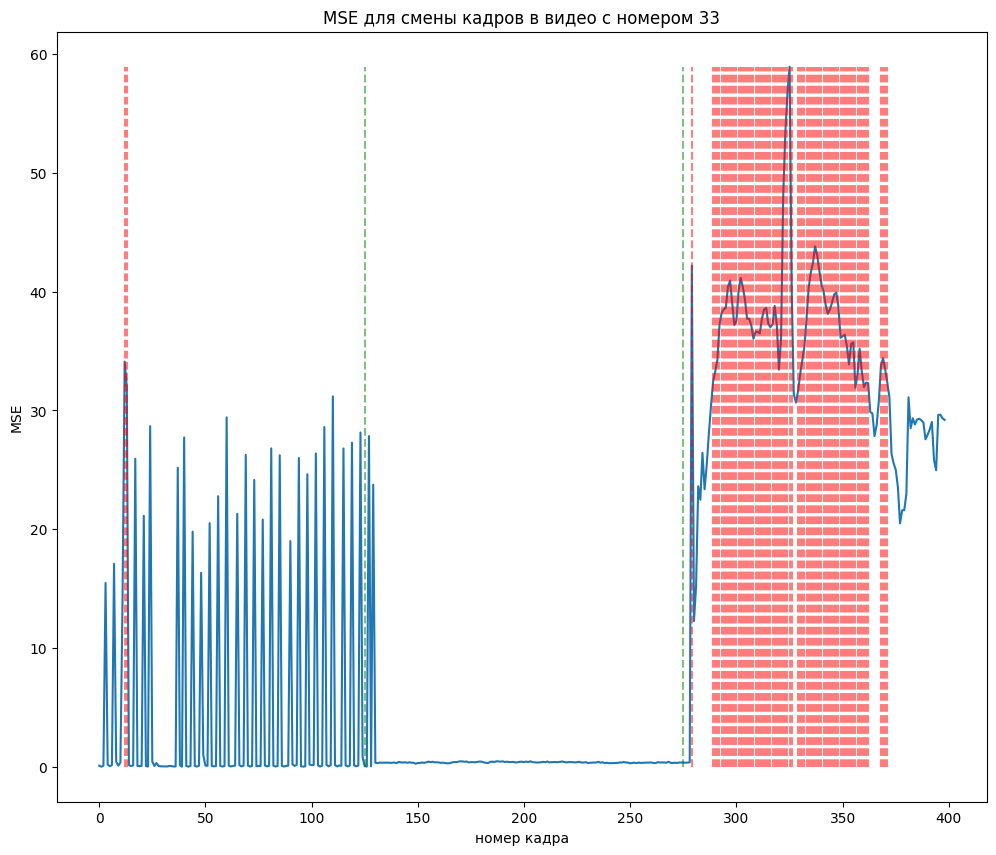

100%|██████████| 500/500 [00:07<00:00, 64.81it/s]80 [05:08<09:29, 12.37s/it]


250 500 is_start = True, is_end = True


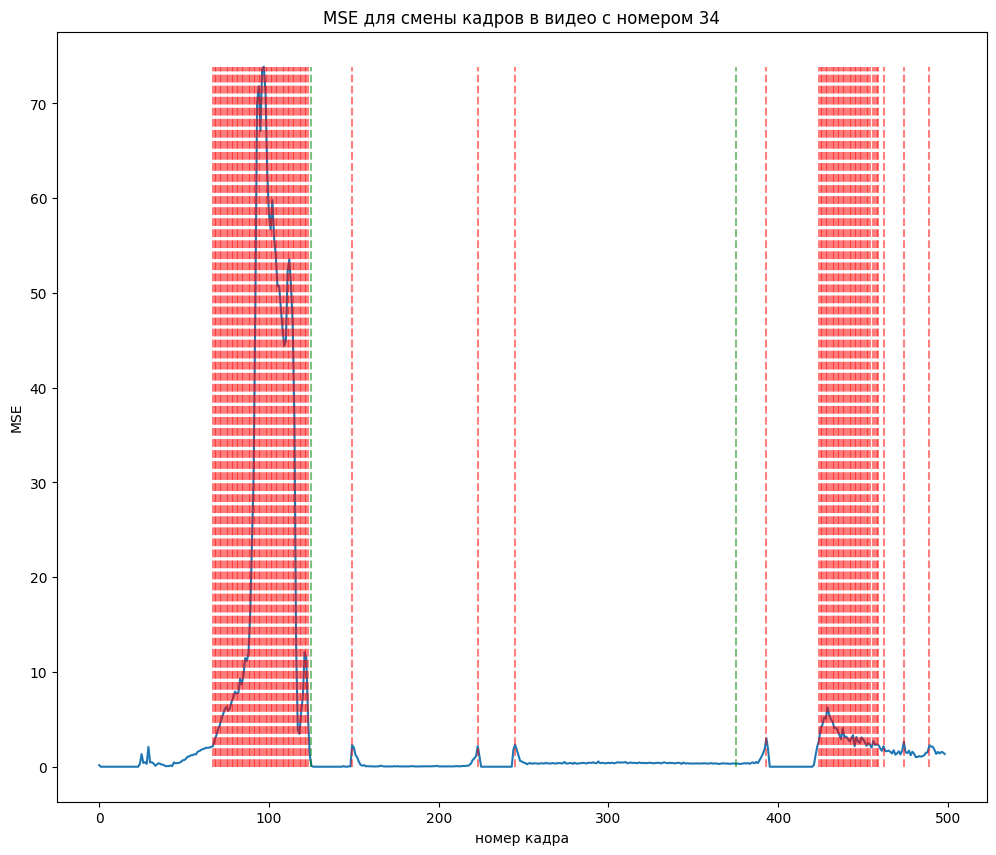

100%|██████████| 450/450 [00:06<00:00, 65.52it/s]80 [05:16<08:16, 11.02s/it]


325 525 is_start = False, is_end = False


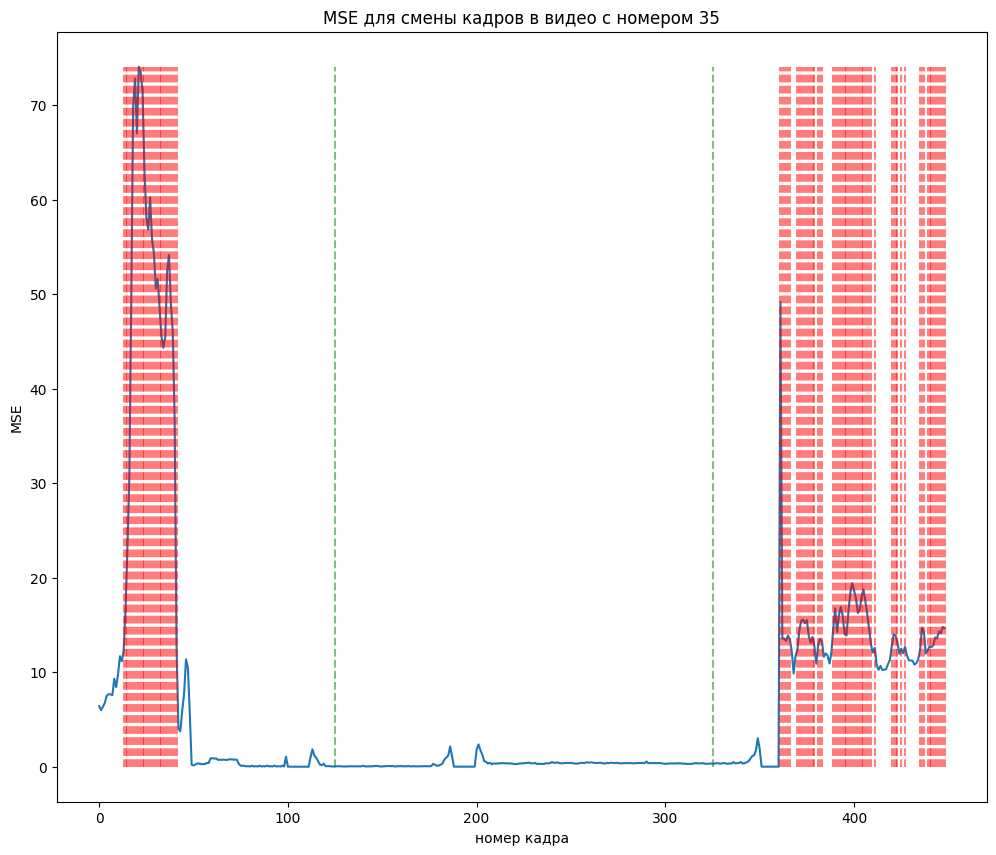

100%|██████████| 500/500 [00:07<00:00, 66.76it/s]80 [05:23<07:12,  9.82s/it]


250 500 is_start = True, is_end = True


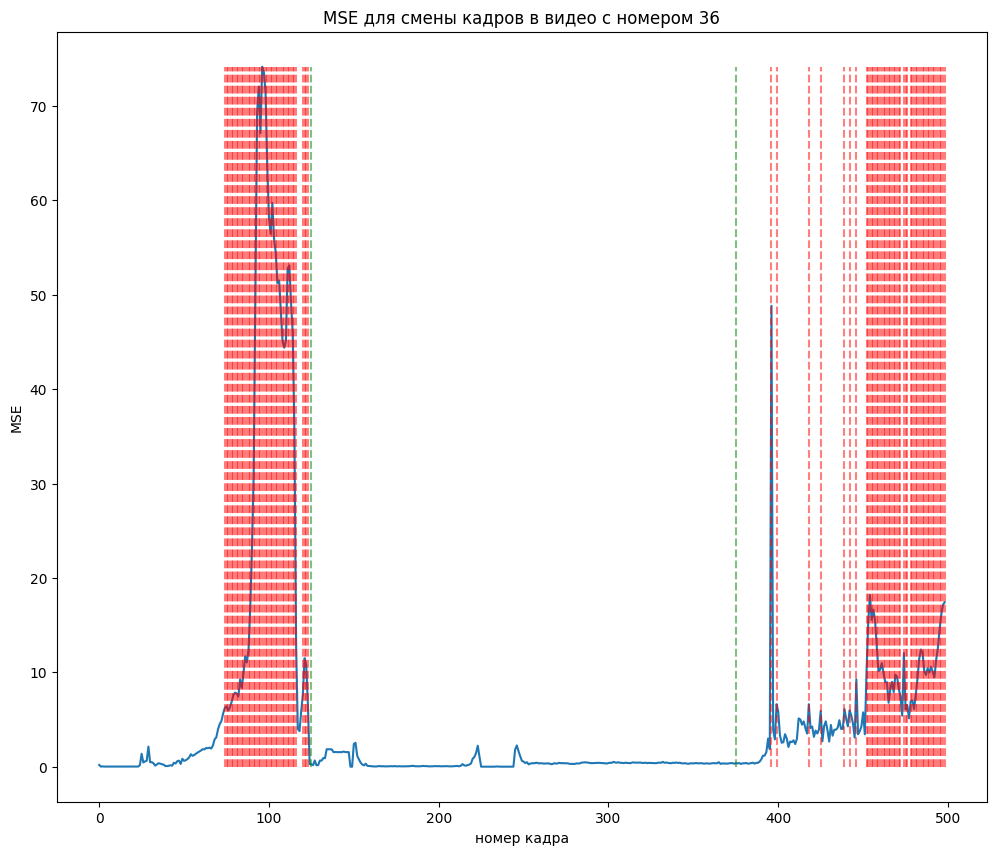

100%|██████████| 1077/1077 [00:15<00:00, 67.61it/s] [05:31<06:34,  9.18s/it]


1246 2085 is_start = True, is_end = True


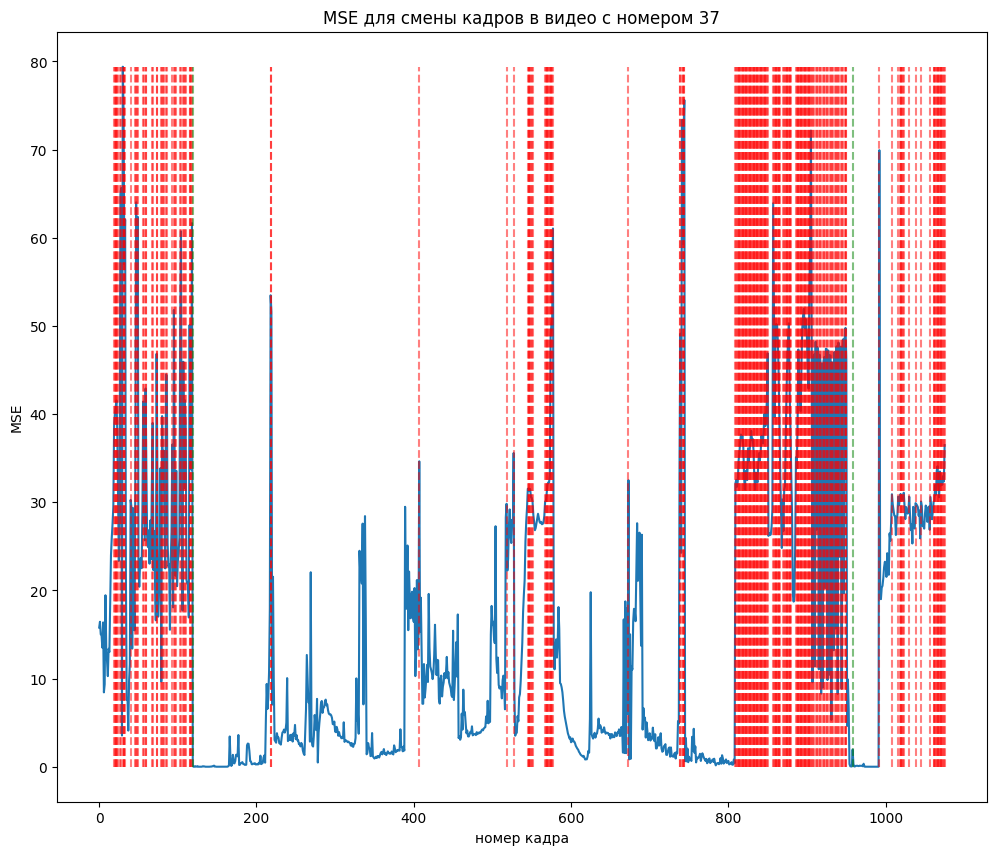

100%|██████████| 454/454 [00:06<00:00, 67.75it/s]80 [05:47<07:52, 11.26s/it]


383 599 is_start = True, is_end = True


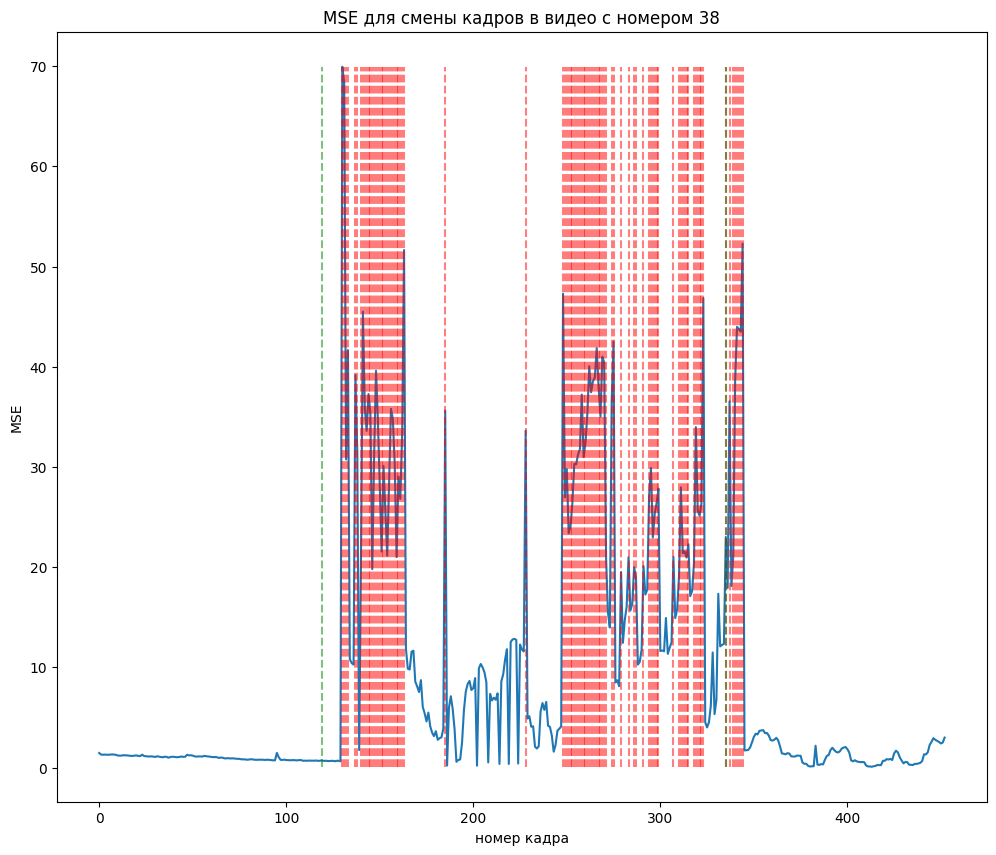

100%|██████████| 1053/1053 [00:15<00:00, 68.26it/s] [05:54<06:47,  9.94s/it]


2325 3140 is_start = True, is_end = True


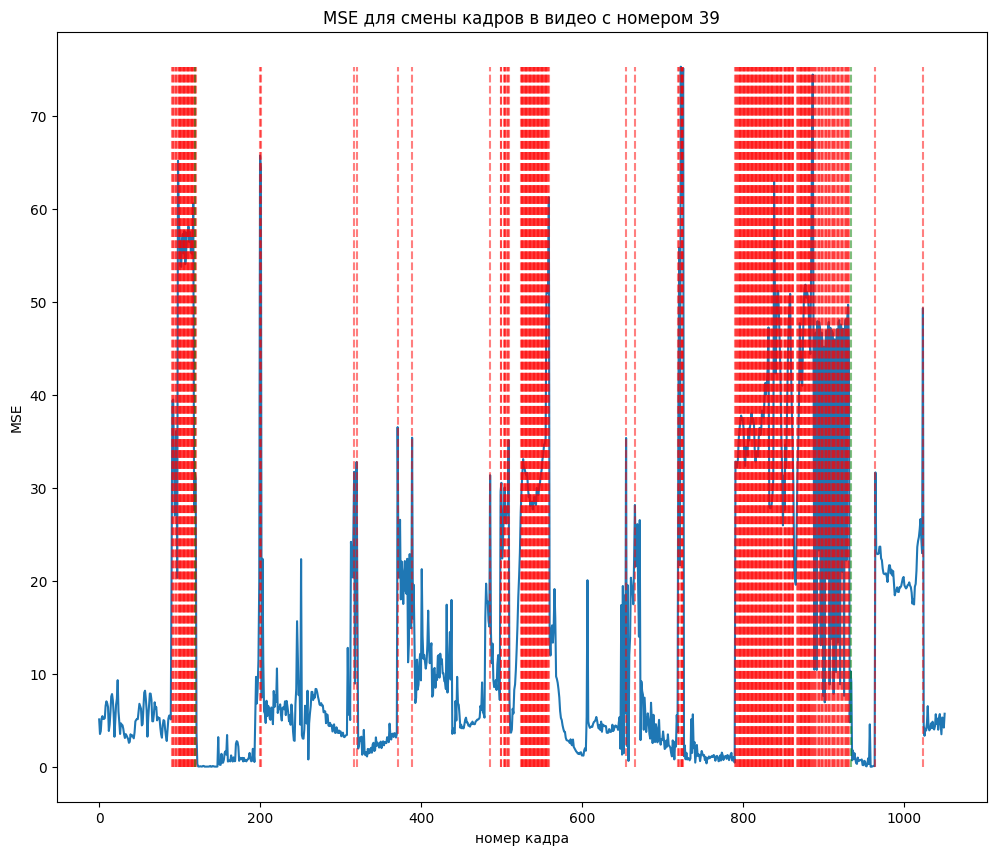

100%|██████████| 300/300 [00:04<00:00, 69.10it/s]80 [06:09<07:45, 11.65s/it]


150 200 is_start = False, is_end = True


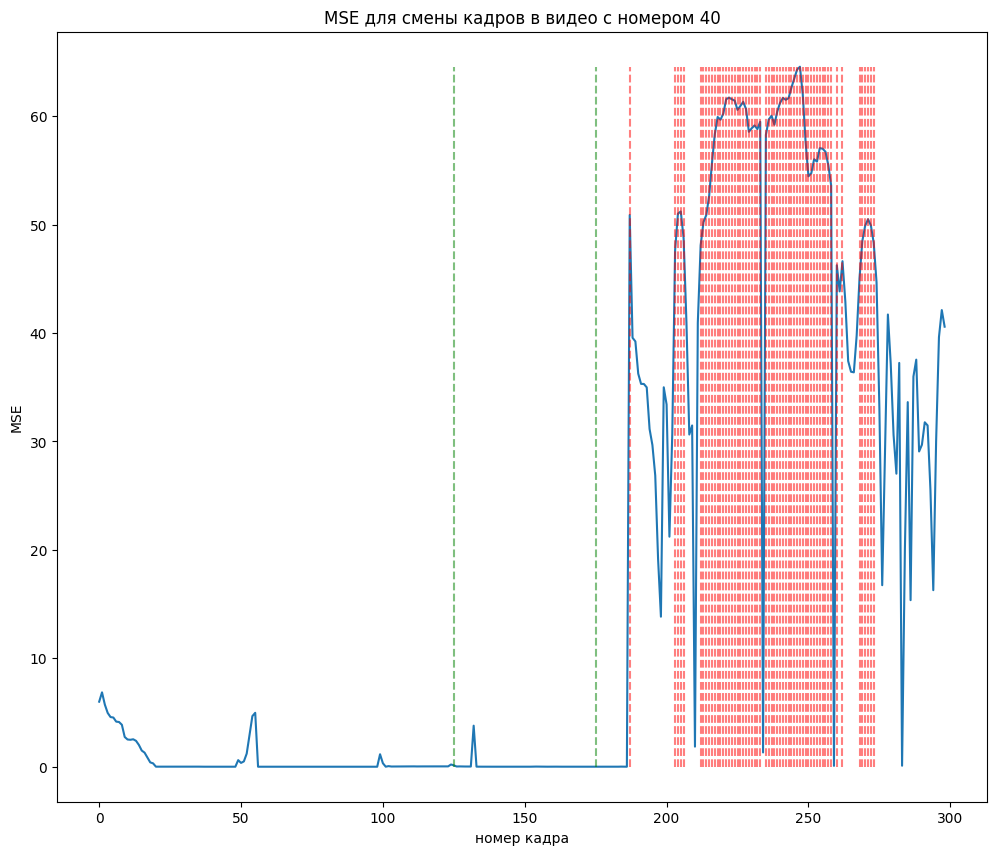

100%|██████████| 375/375 [00:05<00:00, 67.04it/s]80 [06:14<06:10,  9.50s/it]


1225 1350 is_start = True, is_end = True


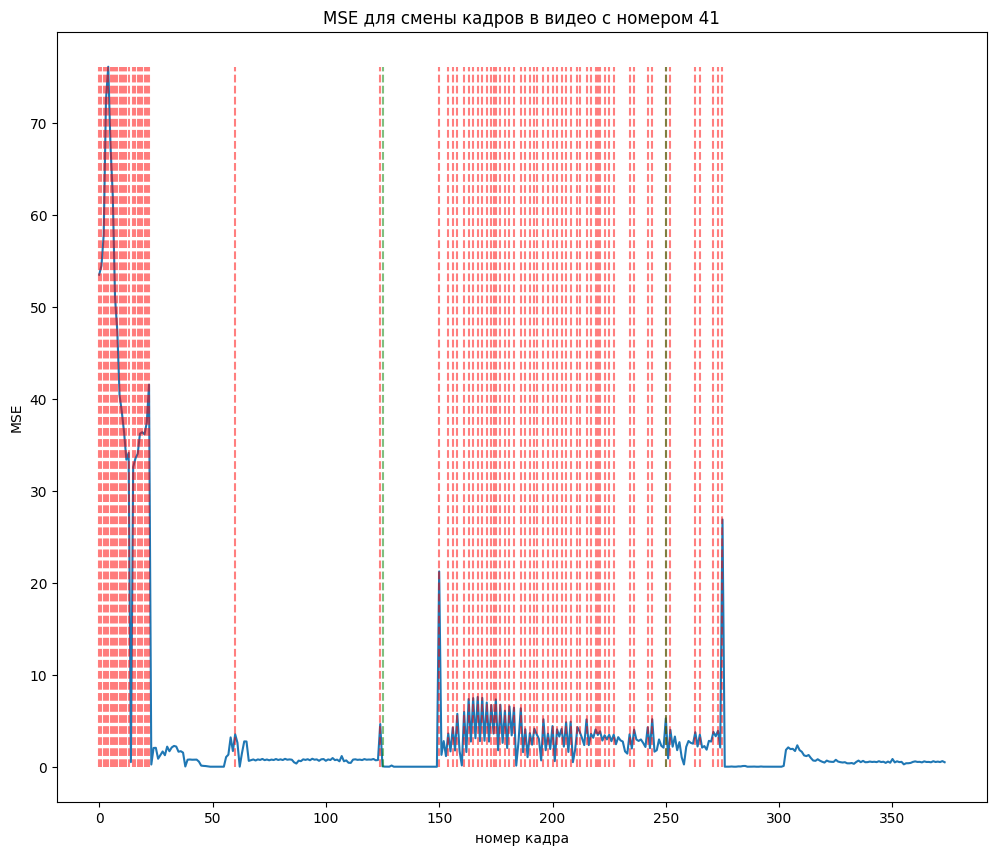

100%|██████████| 400/400 [00:06<00:00, 64.78it/s]80 [06:20<05:18,  8.38s/it]


1225 1375 is_start = False, is_end = True


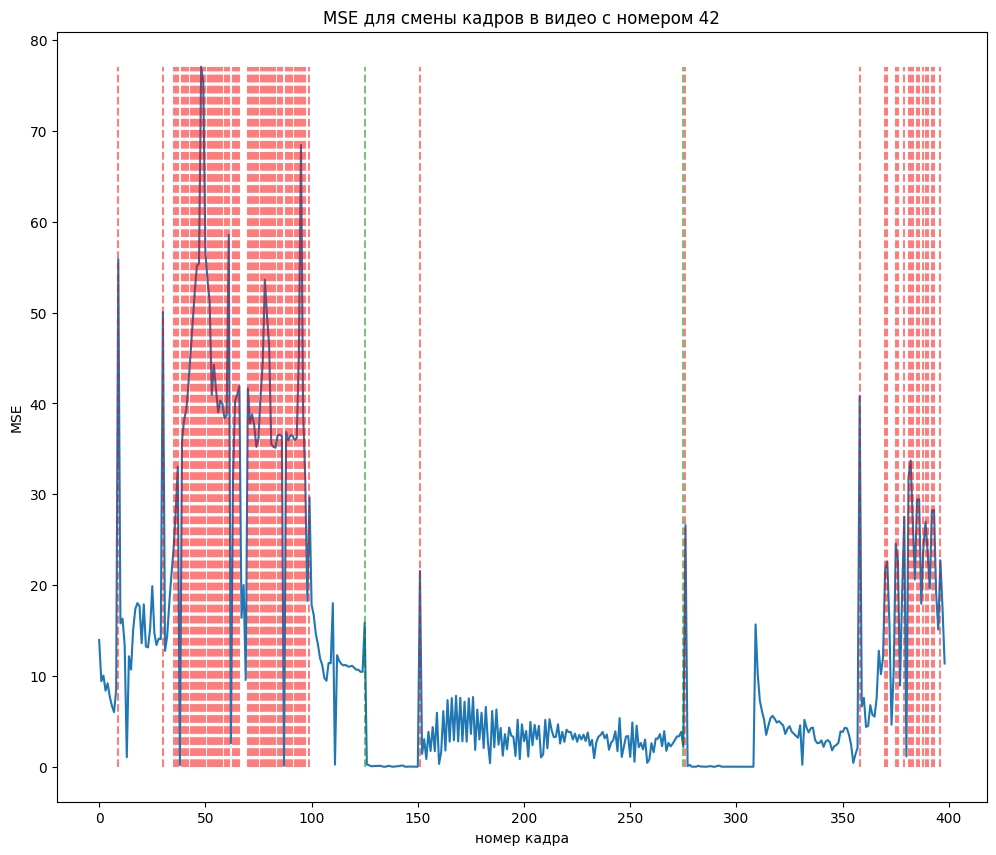

100%|██████████| 375/375 [00:05<00:00, 65.78it/s]80 [06:26<04:47,  7.77s/it]


1225 1350 is_start = True, is_end = True


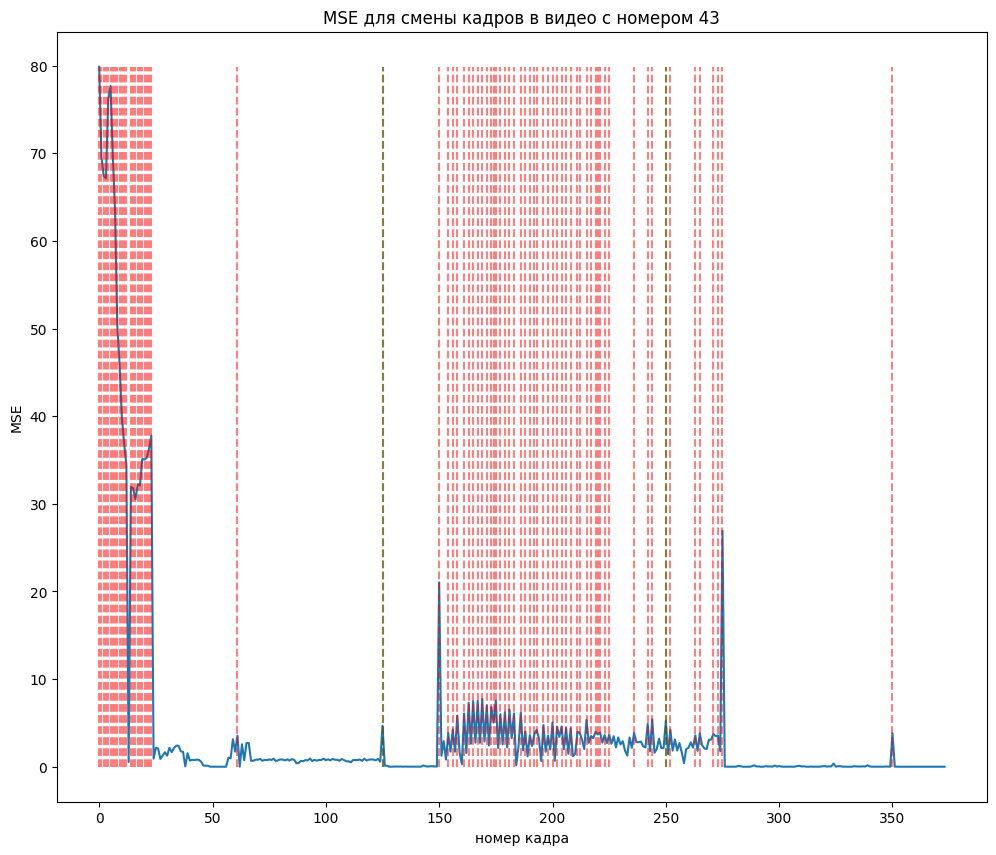

100%|██████████| 375/375 [00:05<00:00, 66.47it/s]80 [06:32<04:19,  7.20s/it]


1225 1350 is_start = True, is_end = True


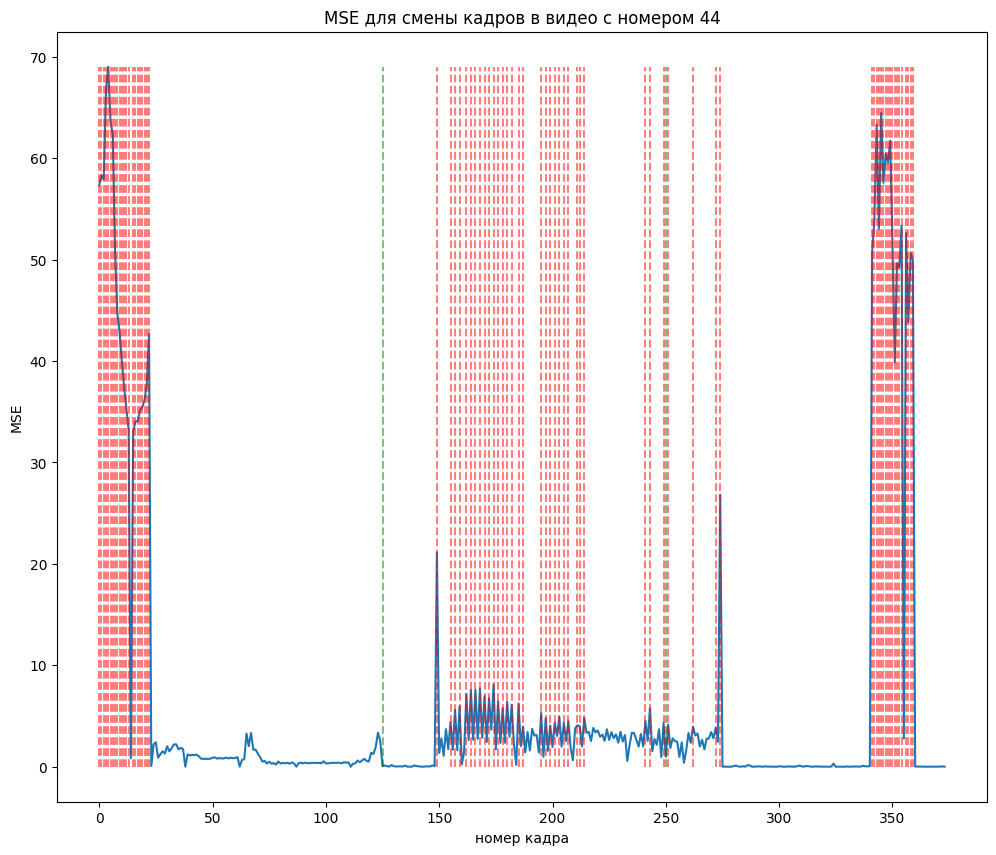

100%|██████████| 300/300 [00:04<00:00, 61.97it/s]80 [06:41<03:16,  5.79s/it]


1200 1250 is_start = True, is_end = True


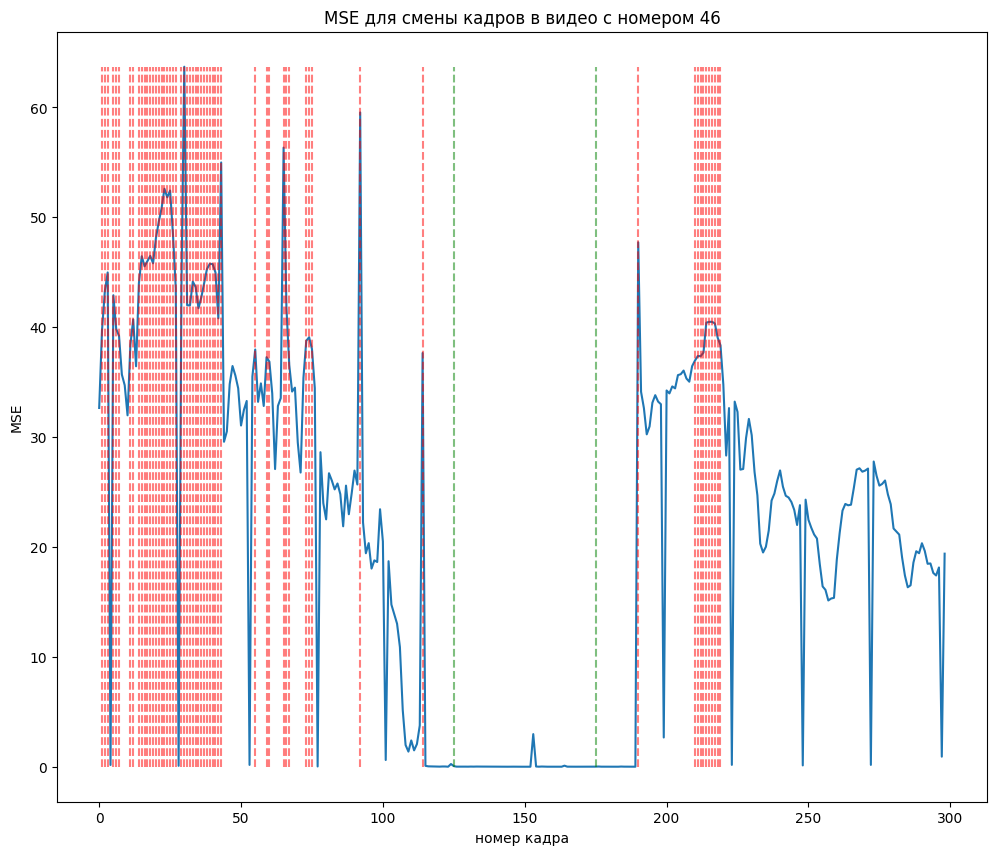

100%|██████████| 358/358 [00:05<00:00, 64.80it/s]80 [06:46<03:03,  5.55s/it]


383 503 is_start = True, is_end = True


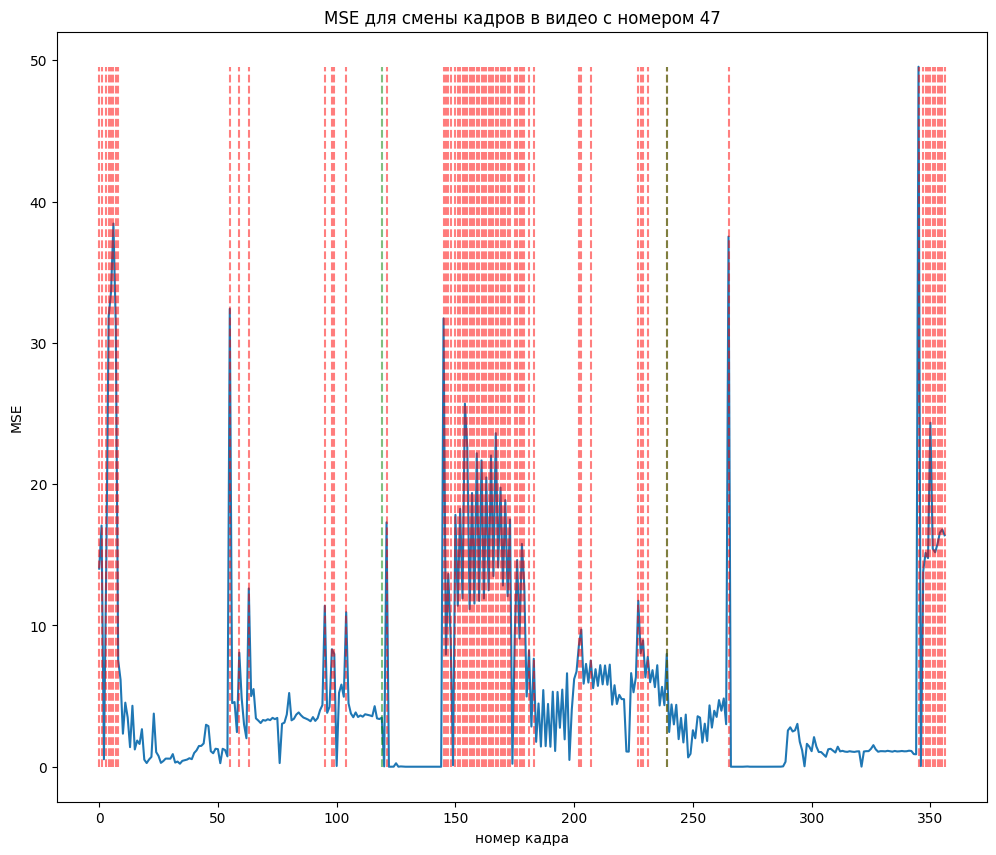

100%|██████████| 358/358 [00:05<00:00, 66.93it/s]80 [06:52<02:58,  5.59s/it]


383 503 is_start = True, is_end = True


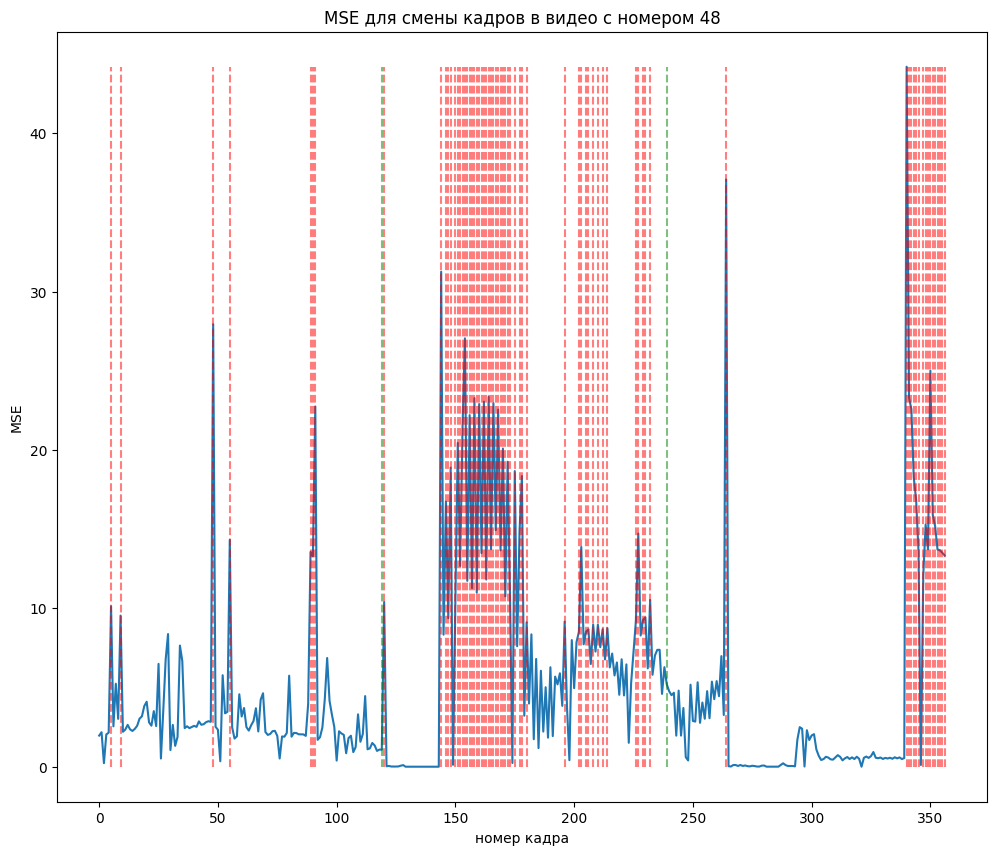

100%|██████████| 334/334 [00:05<00:00, 66.31it/s]80 [06:57<02:52,  5.57s/it]


407 503 is_start = True, is_end = True


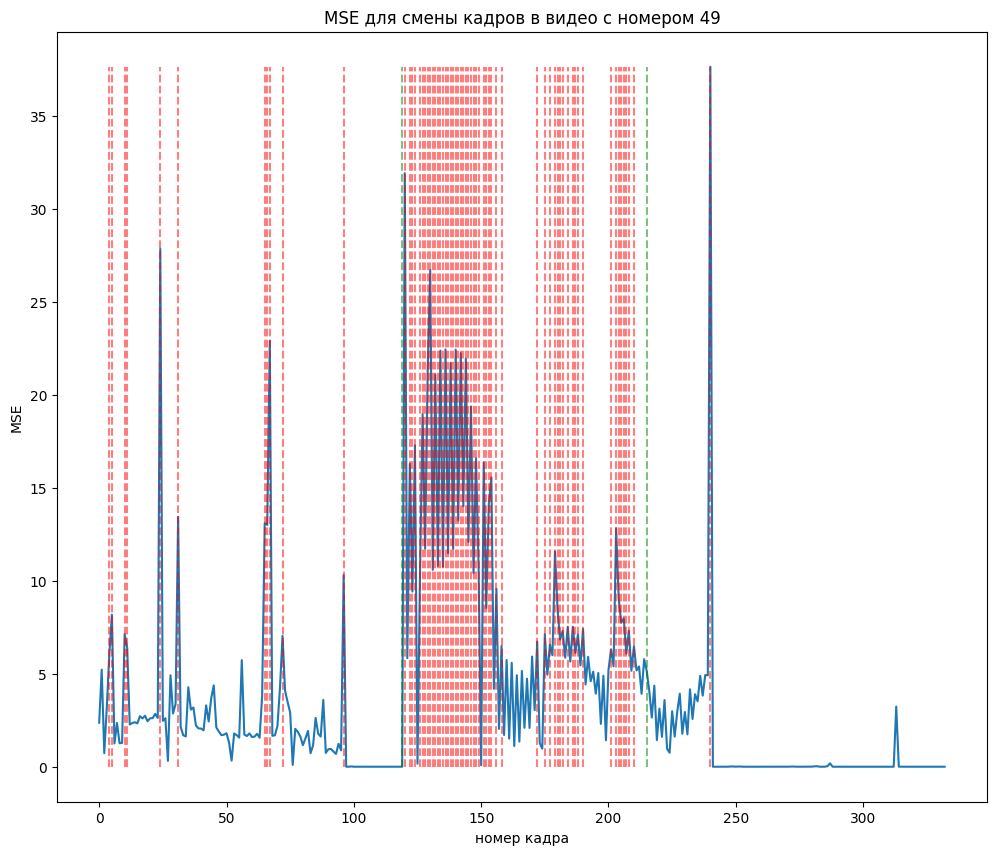

100%|██████████| 358/358 [00:05<00:00, 63.88it/s]80 [07:03<02:44,  5.48s/it]


383 503 is_start = False, is_end = True


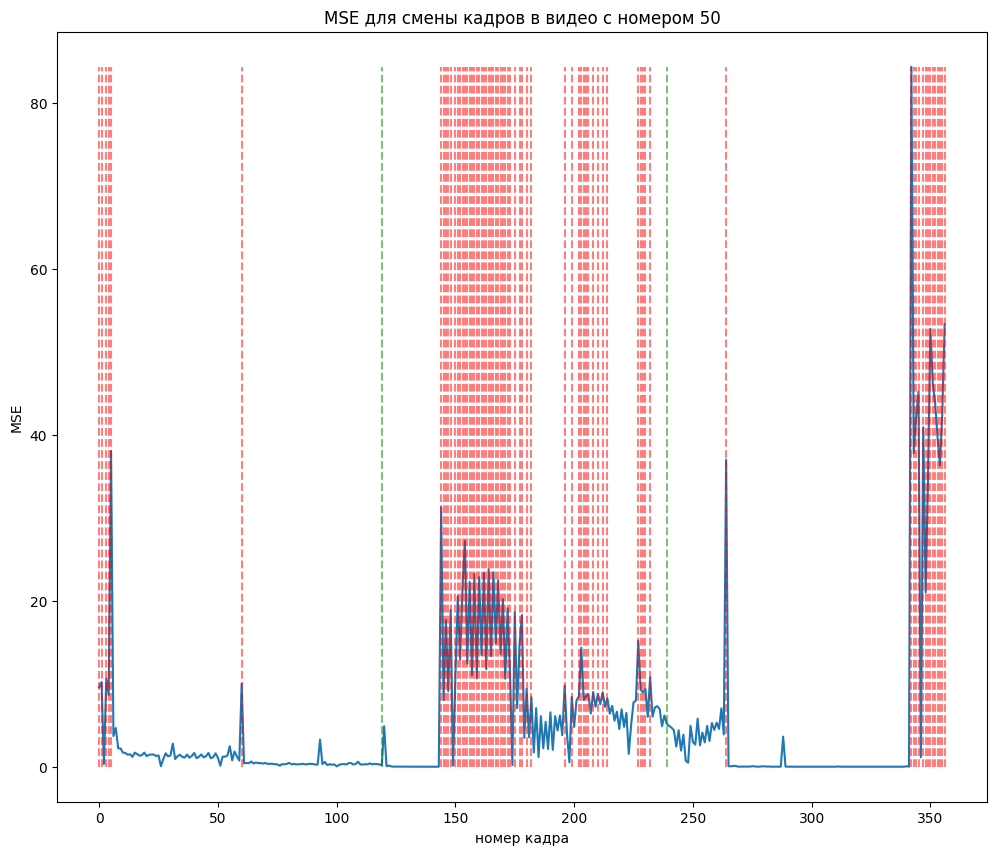

100%|██████████| 358/358 [00:05<00:00, 67.90it/s]80 [07:08<02:41,  5.57s/it]


383 503 is_start = False, is_end = True


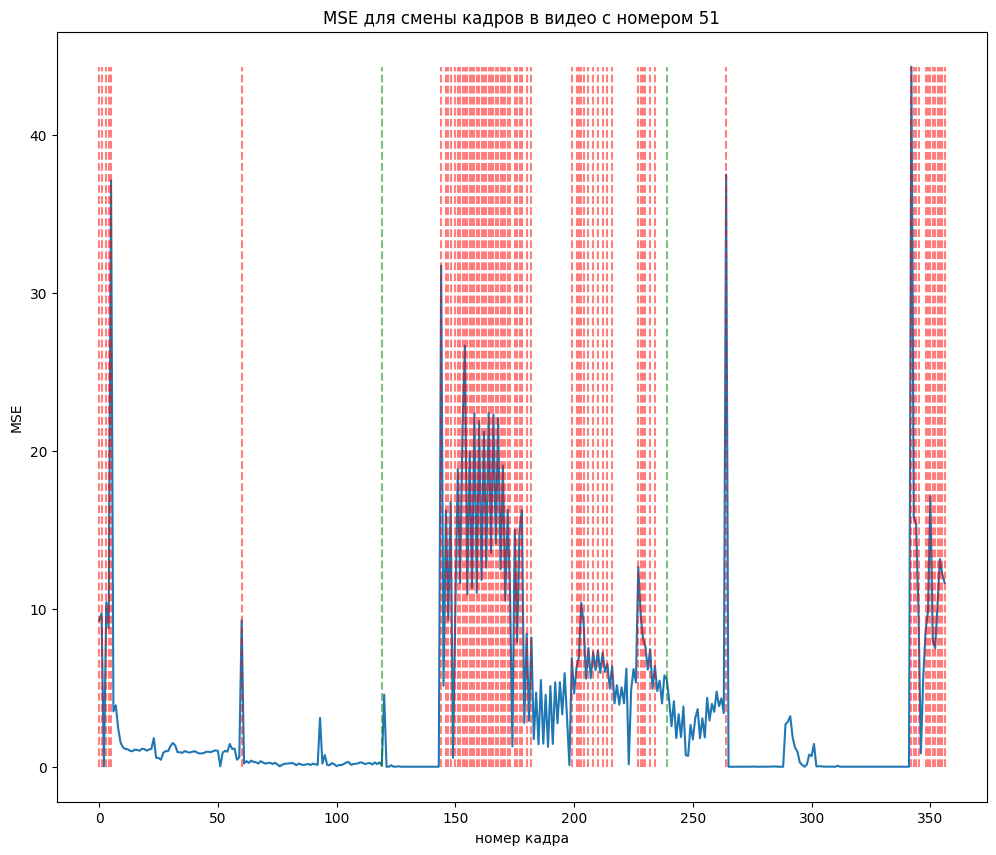

100%|██████████| 358/358 [00:05<00:00, 66.27it/s]80 [07:14<02:34,  5.52s/it]


383 503 is_start = False, is_end = True


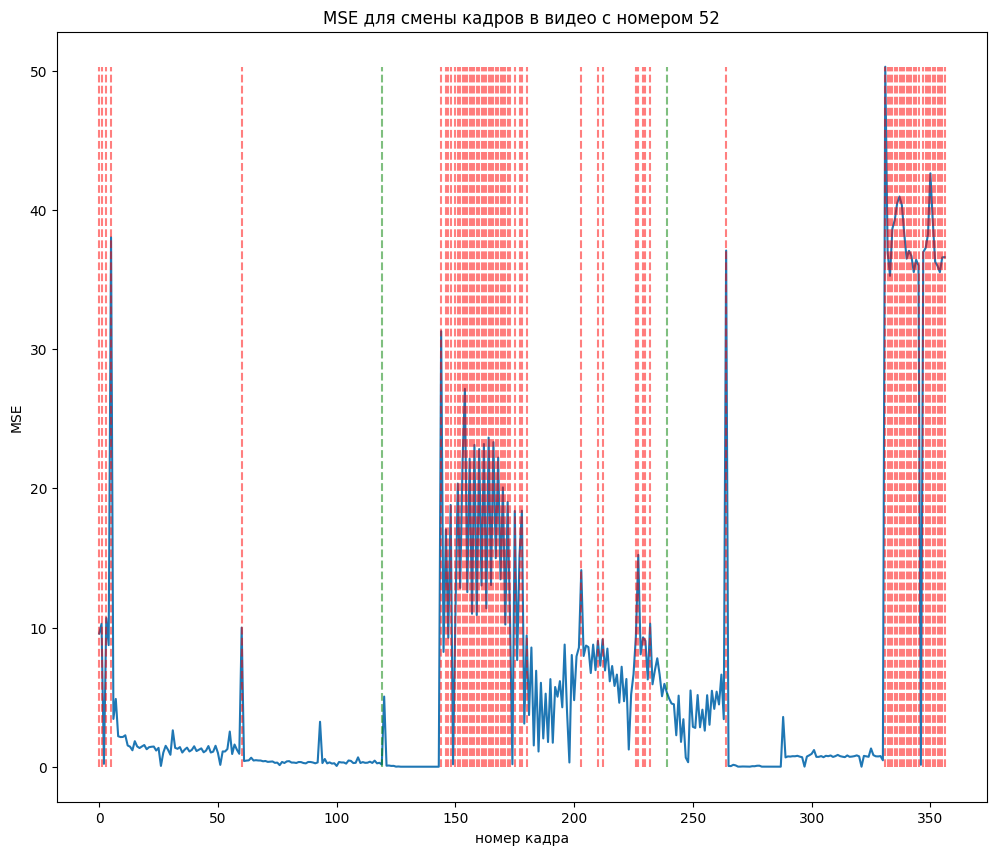

100%|██████████| 358/358 [00:05<00:00, 68.66it/s]80 [07:19<02:29,  5.54s/it]


383 503 is_start = False, is_end = True


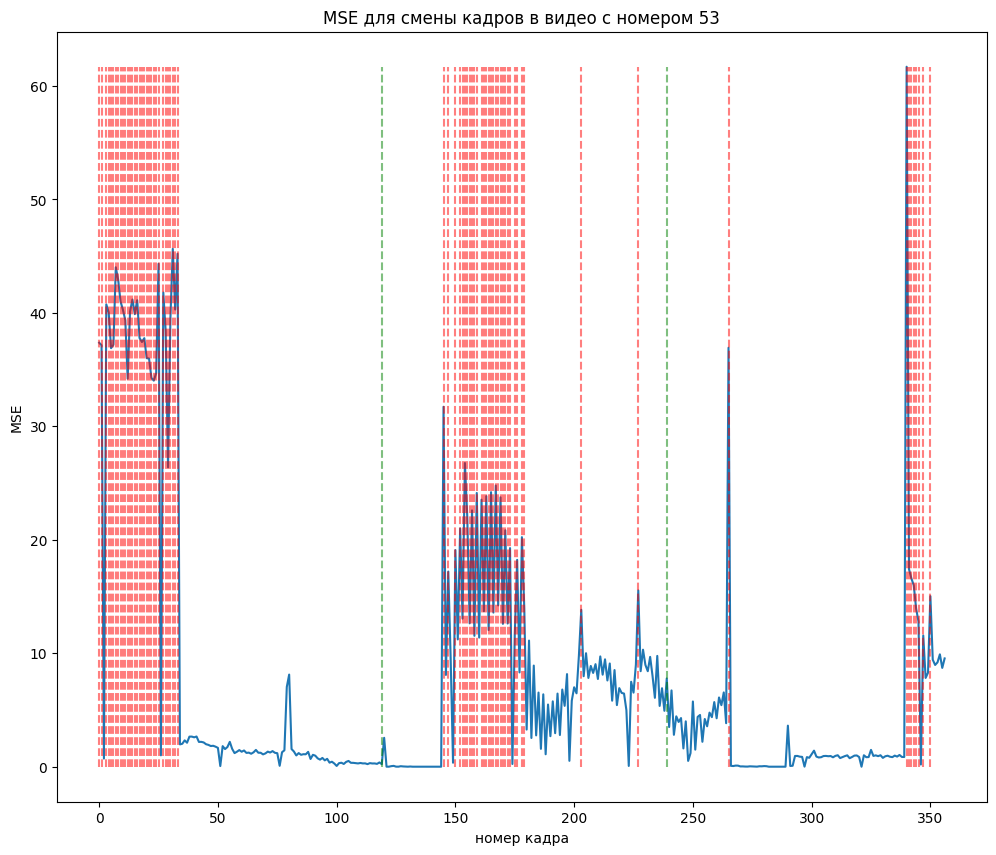

100%|██████████| 357/357 [00:05<00:00, 67.82it/s]80 [07:25<02:22,  5.49s/it]


1007 1126 is_start = True, is_end = True


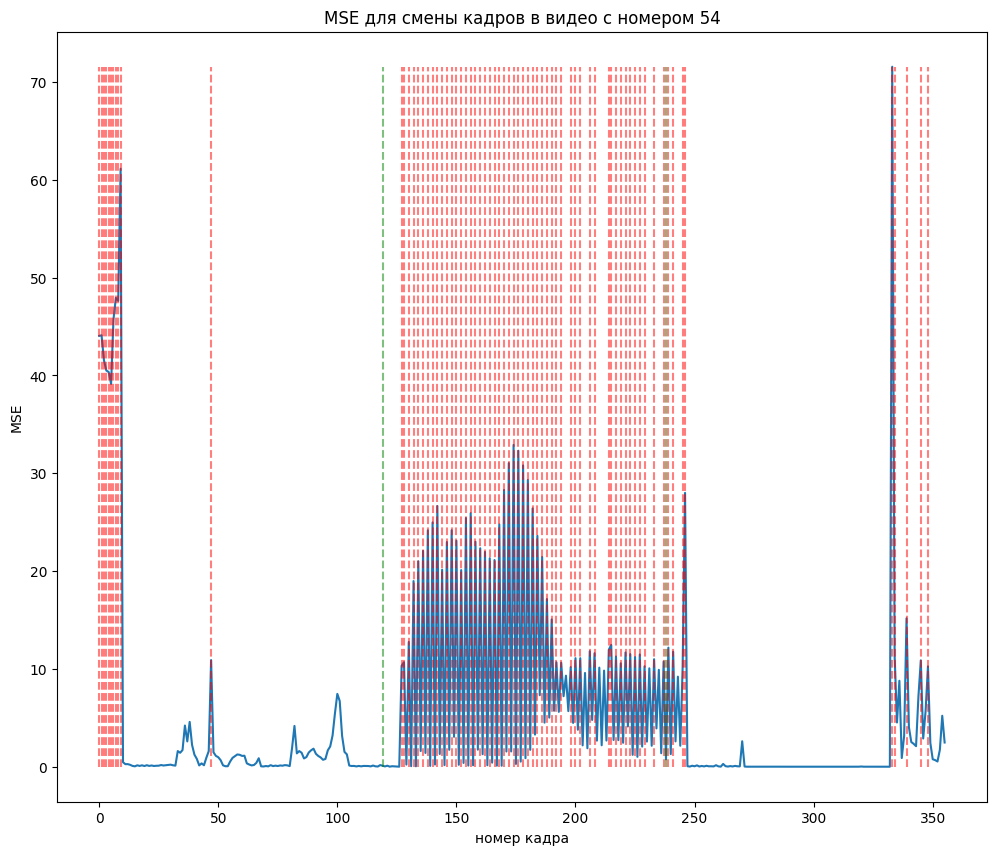

100%|██████████| 357/357 [00:05<00:00, 69.38it/s]80 [07:30<02:16,  5.47s/it]


1007 1126 is_start = True, is_end = True


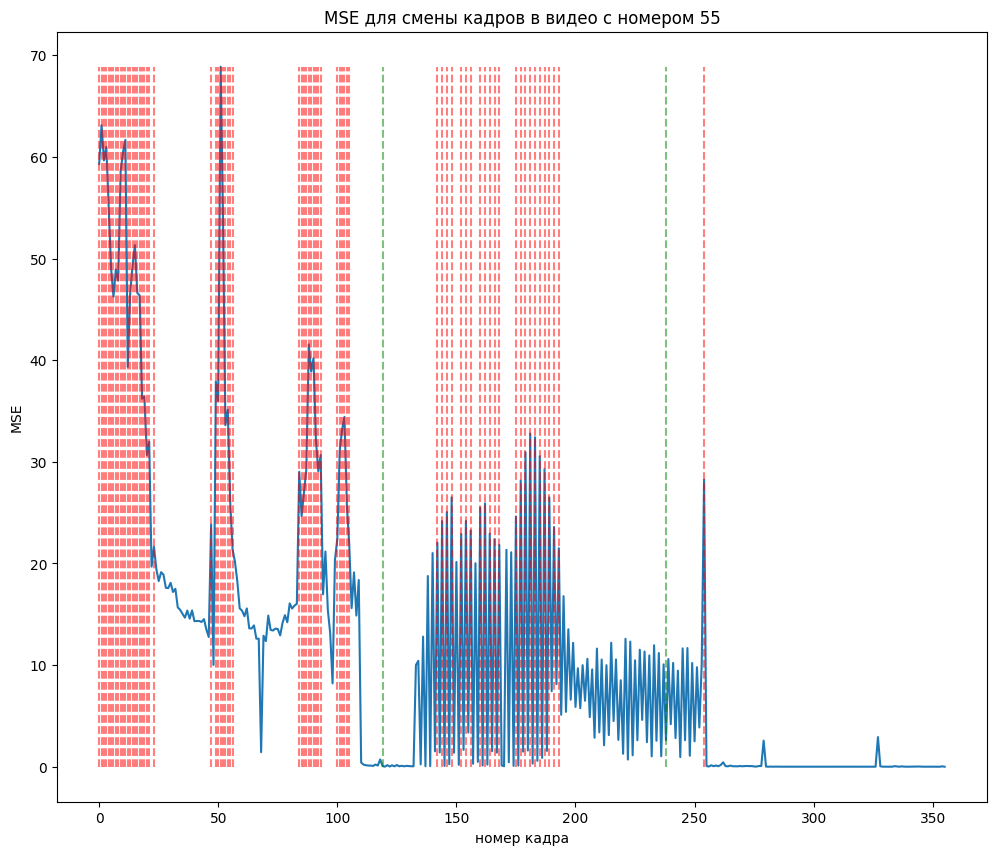

100%|██████████| 405/405 [00:05<00:00, 68.77it/s]80 [07:35<02:10,  5.42s/it]


959 1126 is_start = True, is_end = True


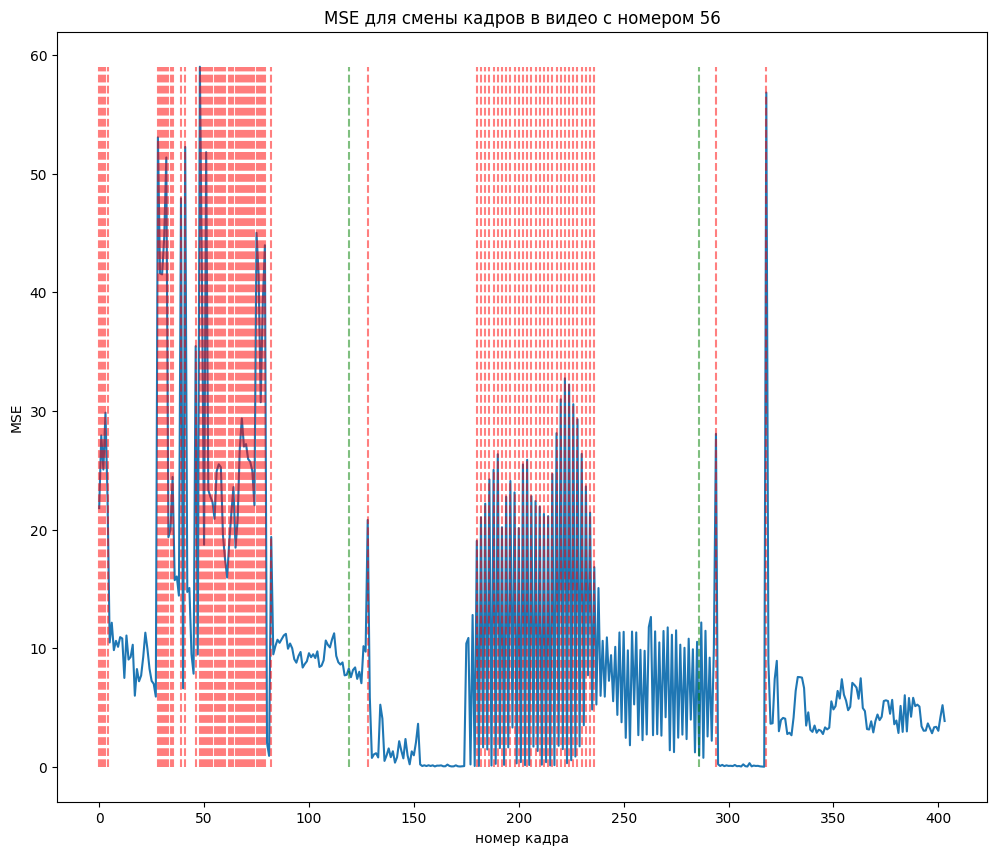

100%|██████████| 357/357 [00:05<00:00, 68.59it/s]80 [07:42<02:09,  5.61s/it]


1007 1126 is_start = True, is_end = True


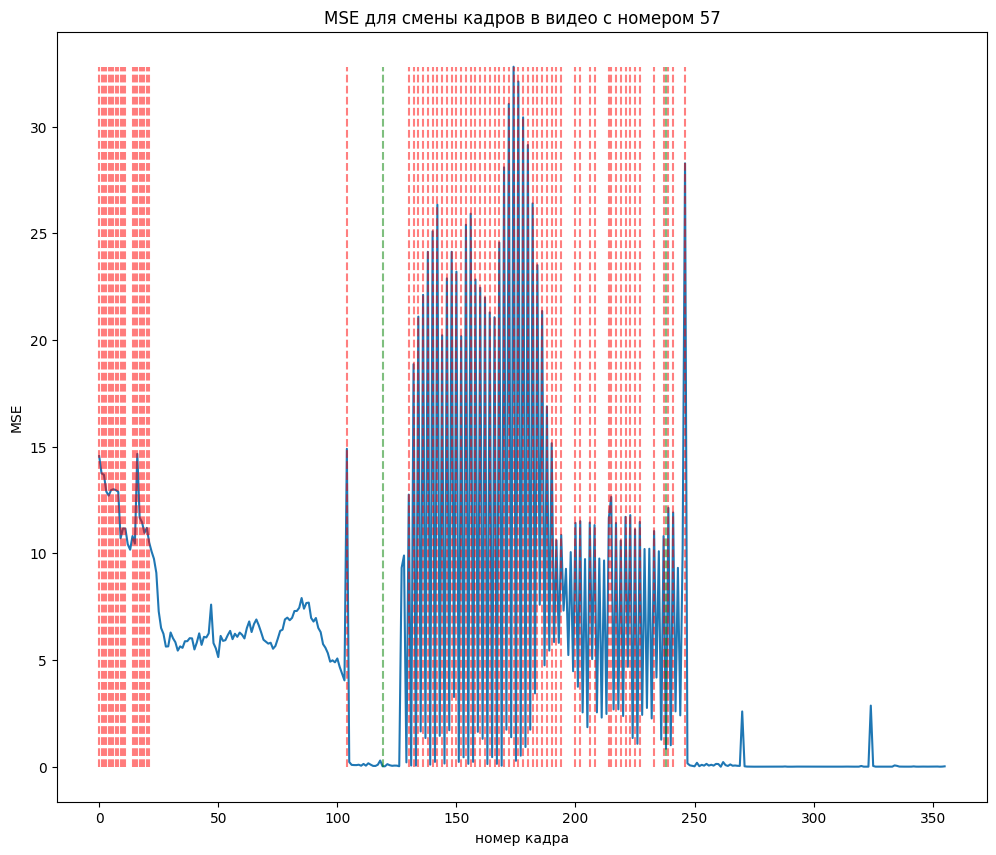

100%|██████████| 357/357 [00:05<00:00, 68.16it/s]80 [07:47<02:01,  5.54s/it]


1007 1126 is_start = True, is_end = True


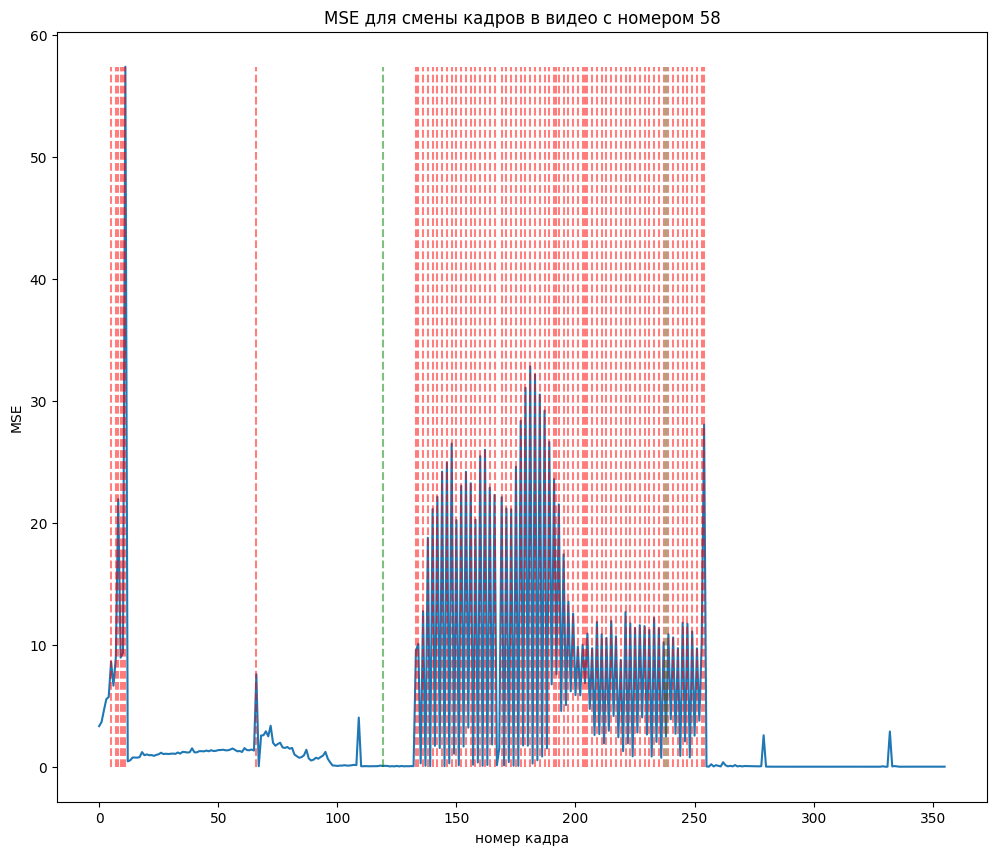

100%|██████████| 480/480 [00:07<00:00, 68.42it/s]80 [07:52<01:55,  5.50s/it]


4344 4584 is_start = True, is_end = True


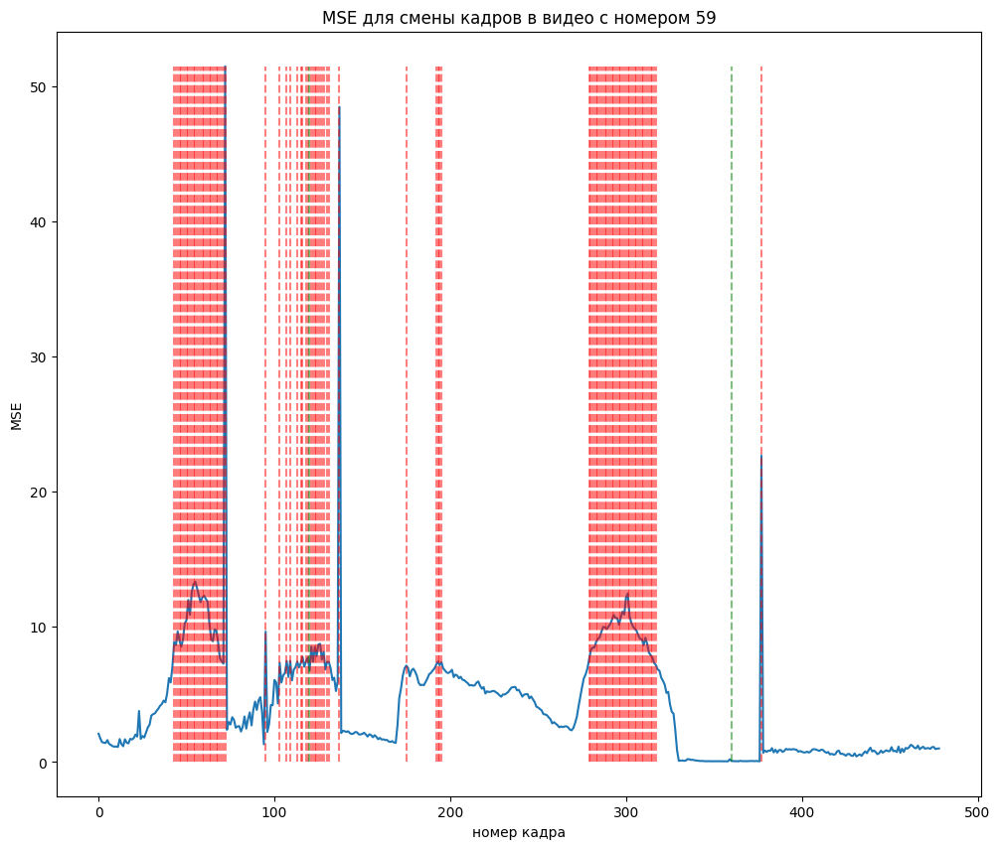

100%|██████████| 456/456 [00:06<00:00, 69.08it/s]80 [07:59<02:00,  6.00s/it]


1416 1632 is_start = True, is_end = False


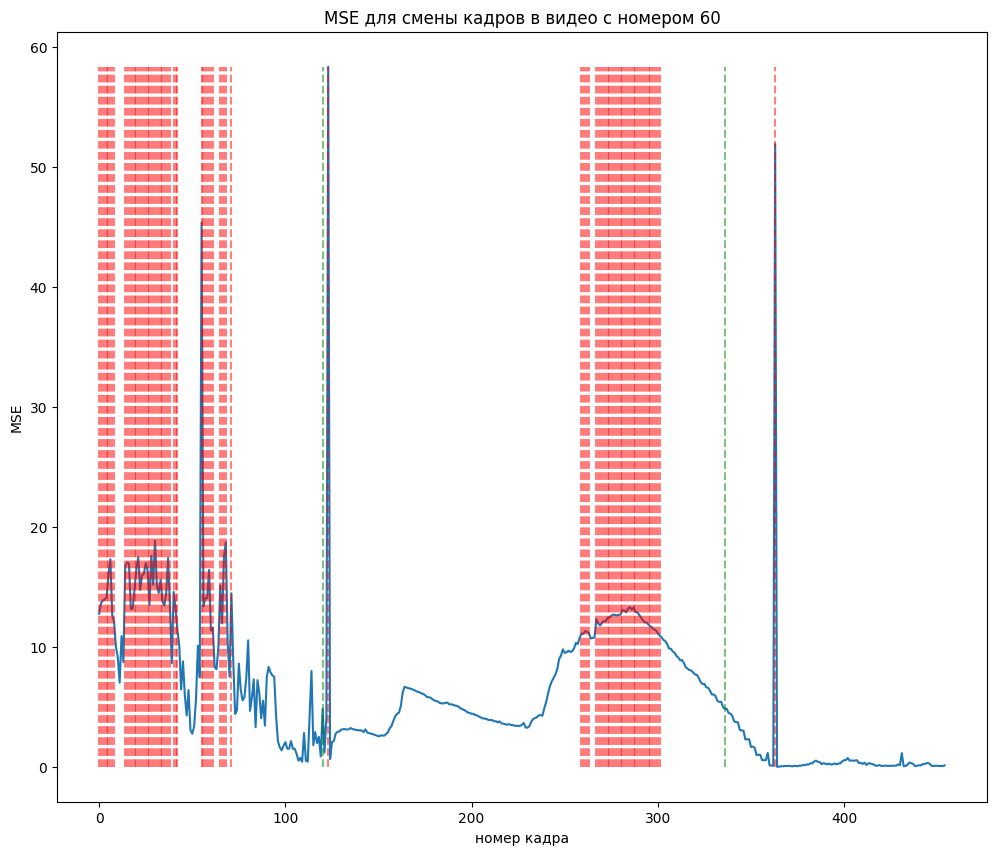

100%|██████████| 480/480 [00:06<00:00, 68.62it/s]80 [08:06<01:58,  6.23s/it]


3000 3240 is_start = True, is_end = True


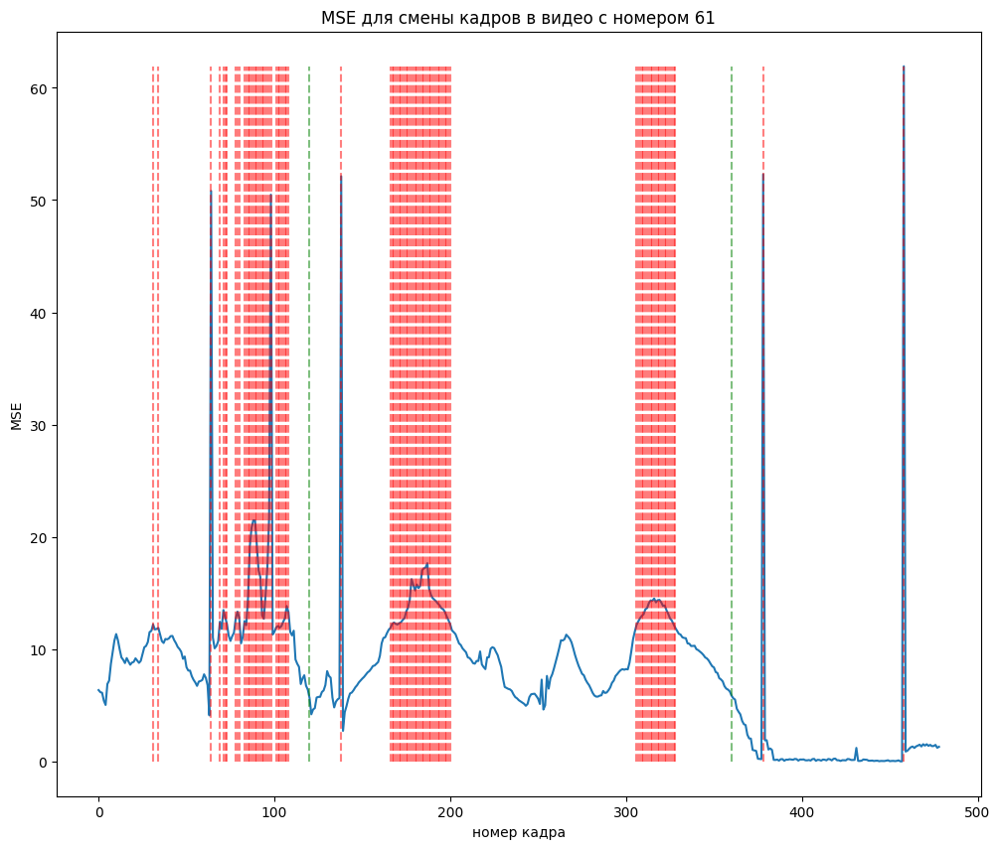

100%|██████████| 480/480 [00:07<00:00, 68.07it/s]80 [08:13<01:57,  6.52s/it]


1584 1824 is_start = True, is_end = True


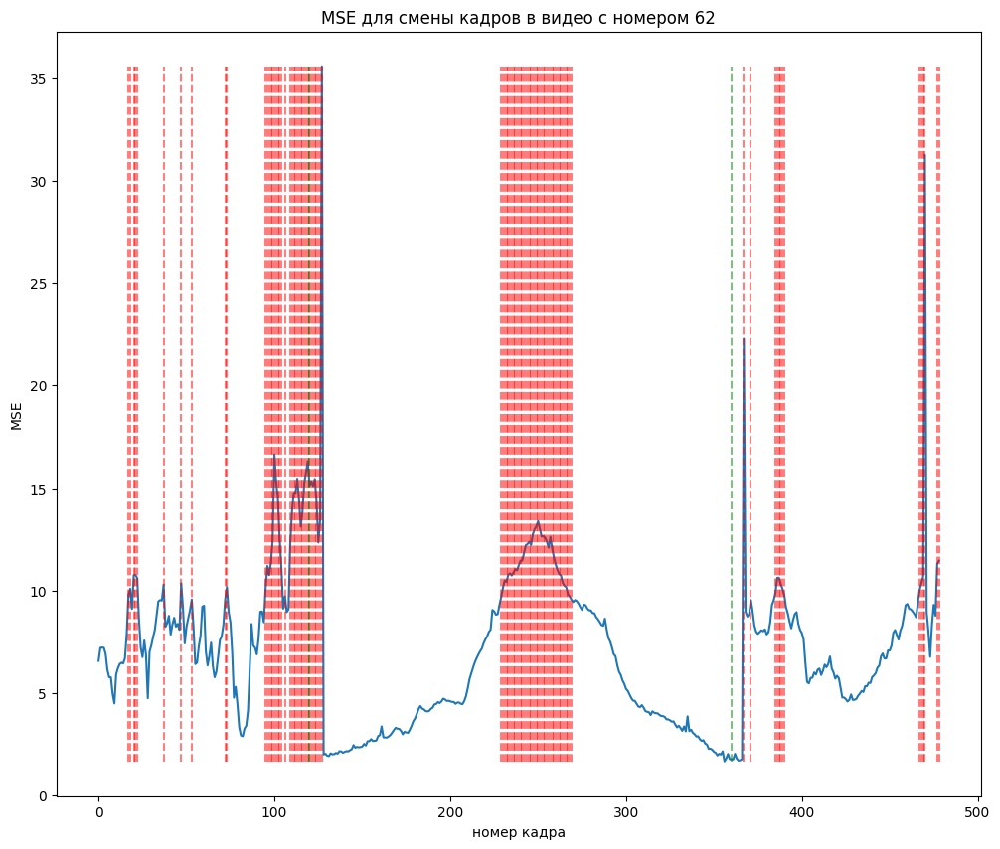

100%|██████████| 480/480 [00:07<00:00, 66.62it/s]80 [08:21<01:54,  6.73s/it]


960 1200 is_start = True, is_end = True


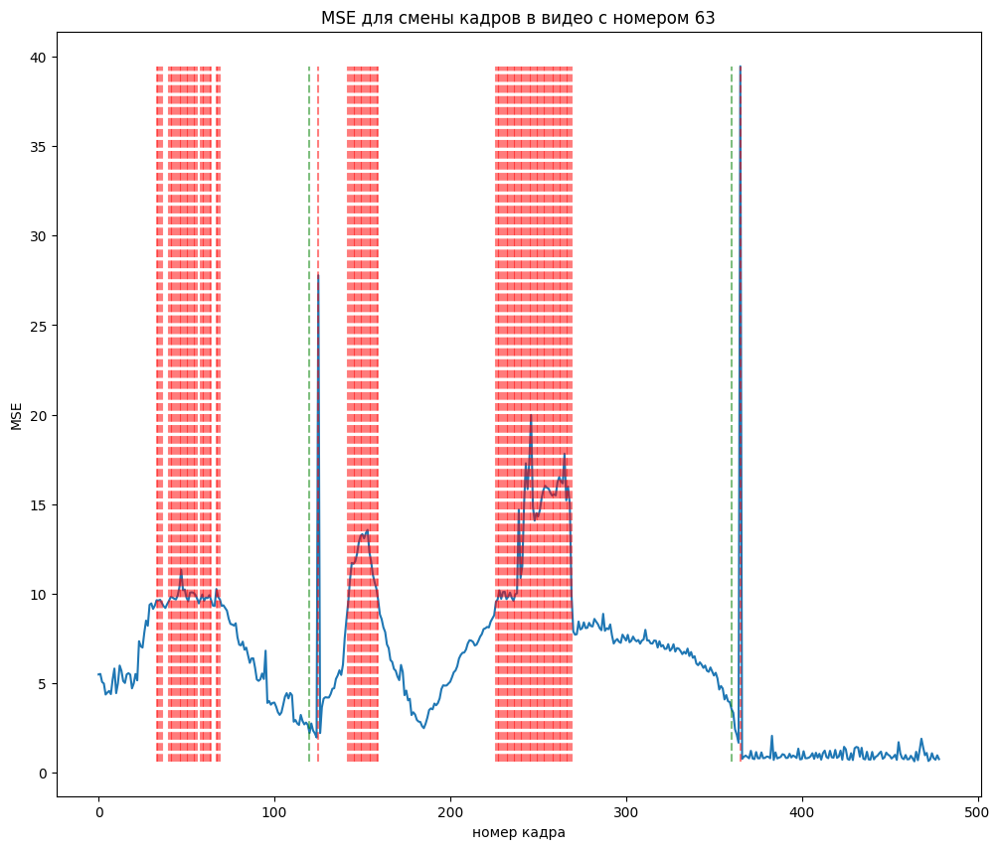

100%|██████████| 382/382 [00:05<00:00, 68.08it/s]80 [08:28<01:50,  6.92s/it]


3644 3788 is_start = True, is_end = True


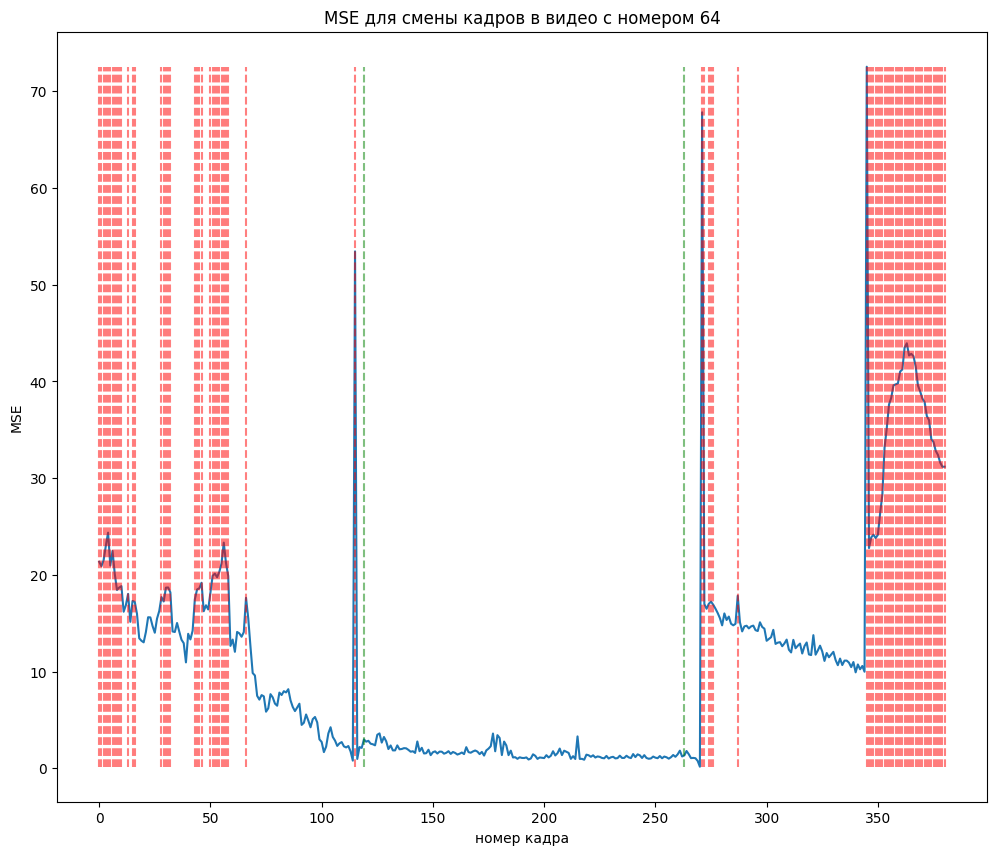

100%|██████████| 381/381 [00:05<00:00, 68.29it/s]80 [08:34<01:38,  6.58s/it]


5970 6113 is_start = True, is_end = True


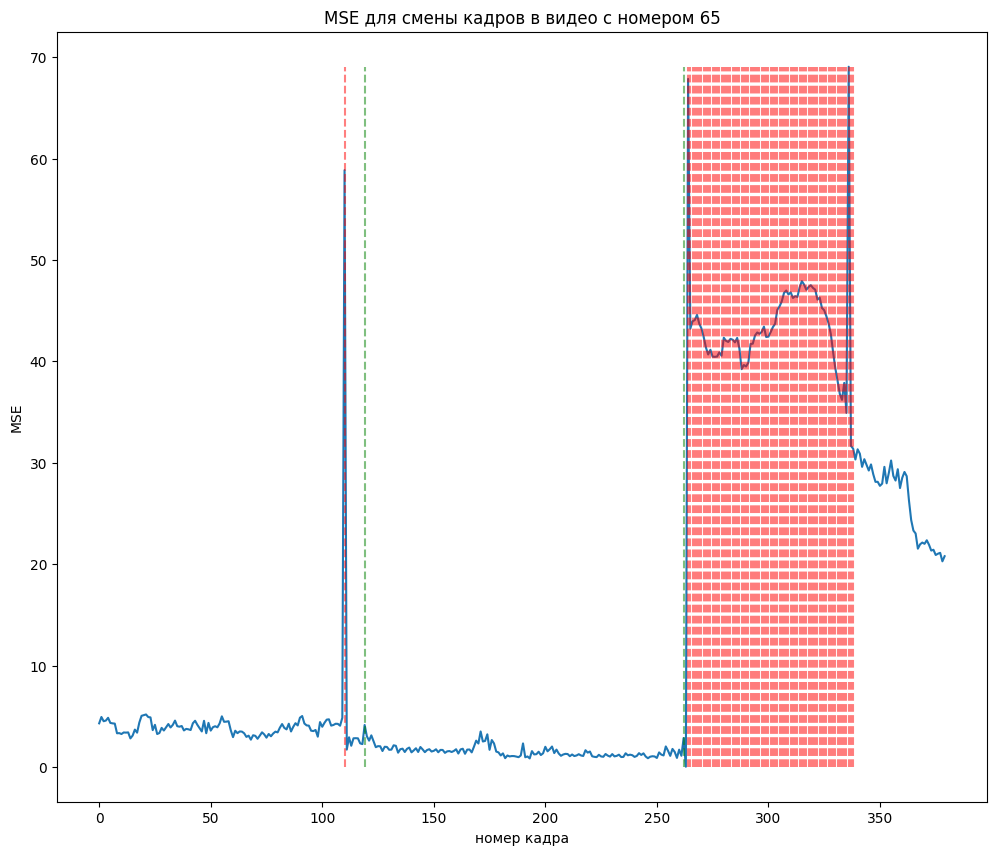

100%|██████████| 382/382 [00:05<00:00, 69.03it/s]80 [08:40<01:28,  6.33s/it]


6161 6305 is_start = True, is_end = True


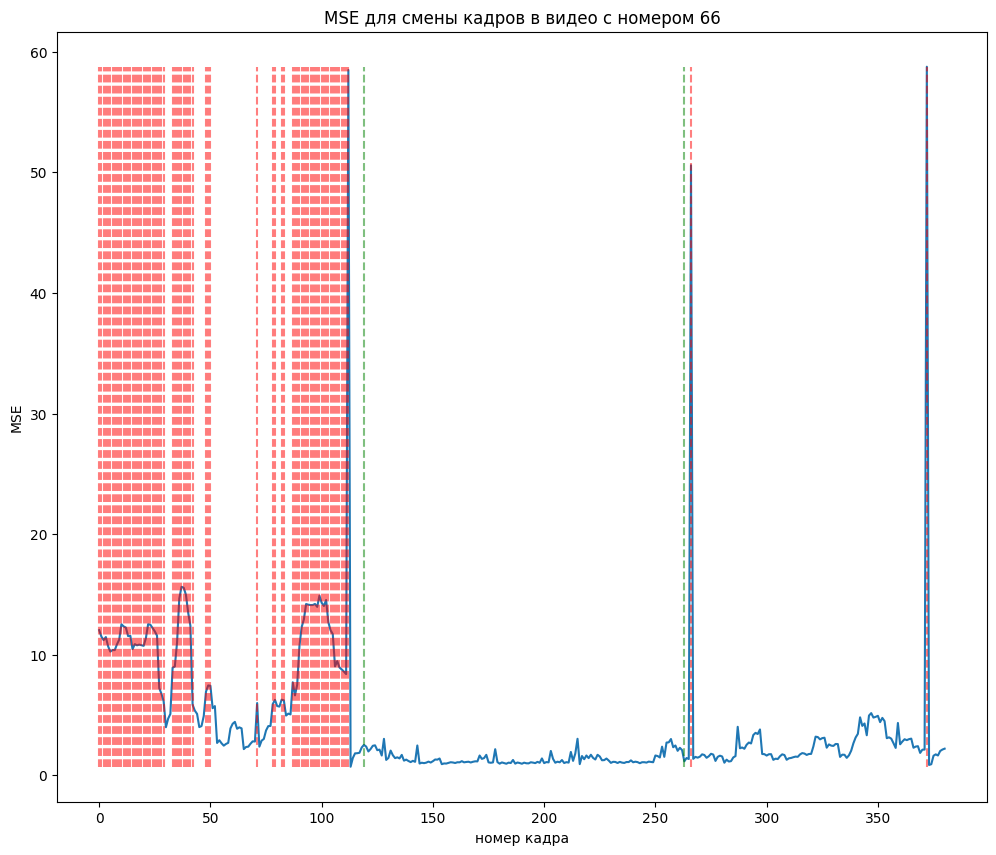

100%|██████████| 406/406 [00:05<00:00, 68.29it/s]80 [08:45<01:19,  6.14s/it]


4795 4963 is_start = True, is_end = True


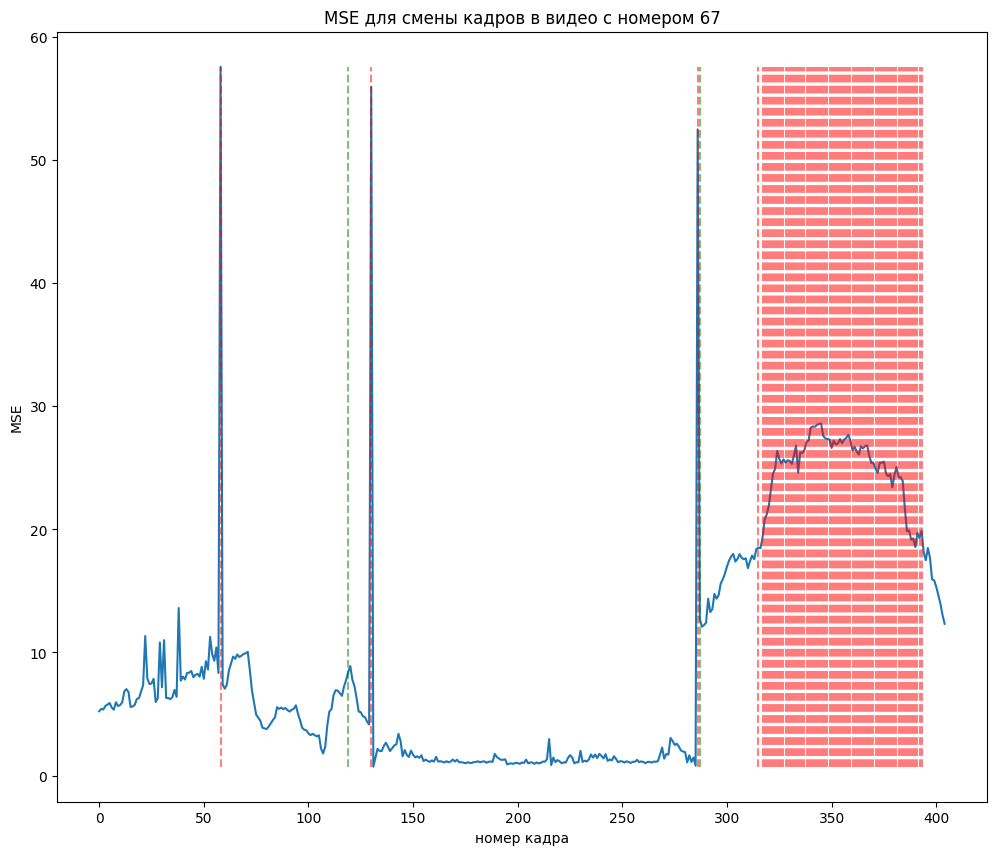

100%|██████████| 406/406 [00:05<00:00, 68.42it/s]80 [08:51<01:13,  6.14s/it]


5082 5250 is_start = True, is_end = True


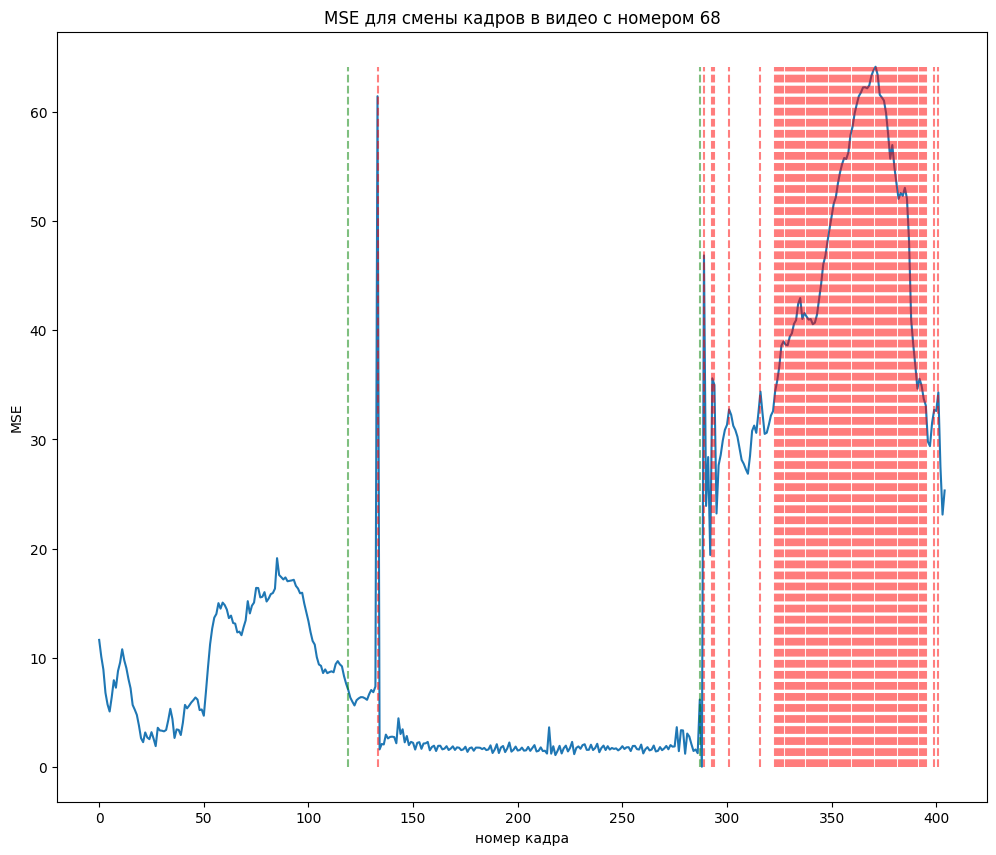

100%|██████████| 382/382 [00:05<00:00, 69.07it/s]80 [08:58<01:07,  6.13s/it]


2205 2349 is_start = True, is_end = True


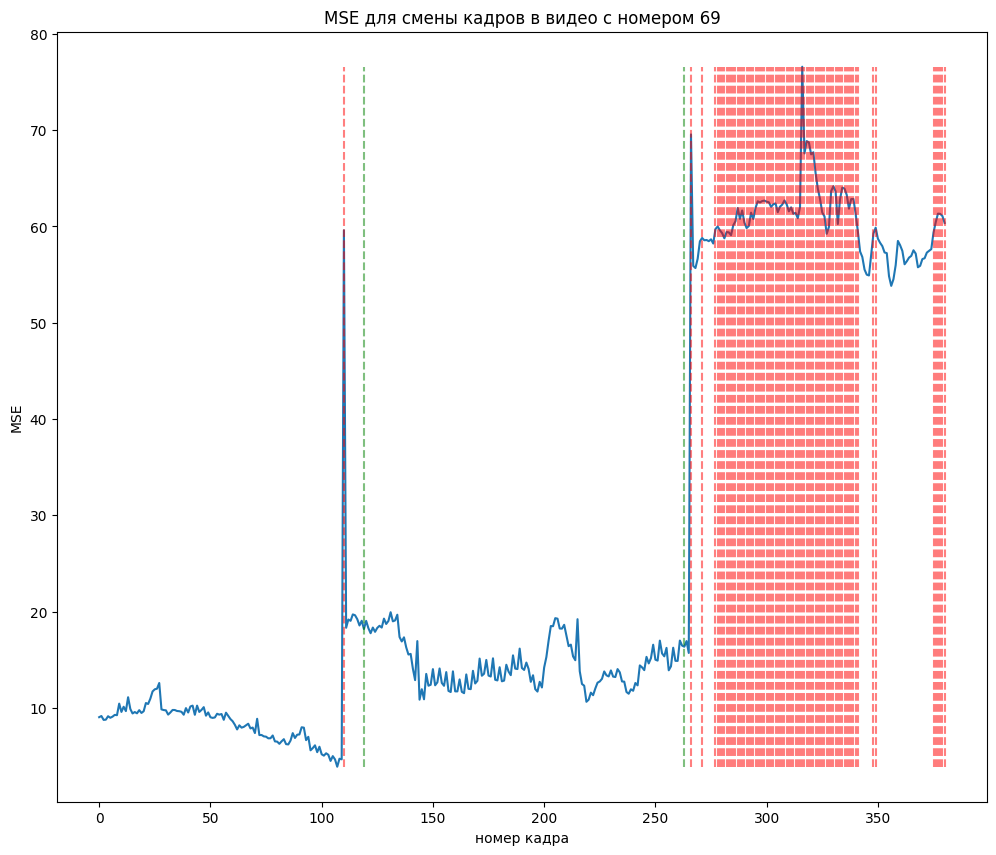

100%|██████████| 1296/1296 [00:18<00:00, 68.81it/s] [09:03<01:00,  6.04s/it]


9456 10512 is_start = True, is_end = False


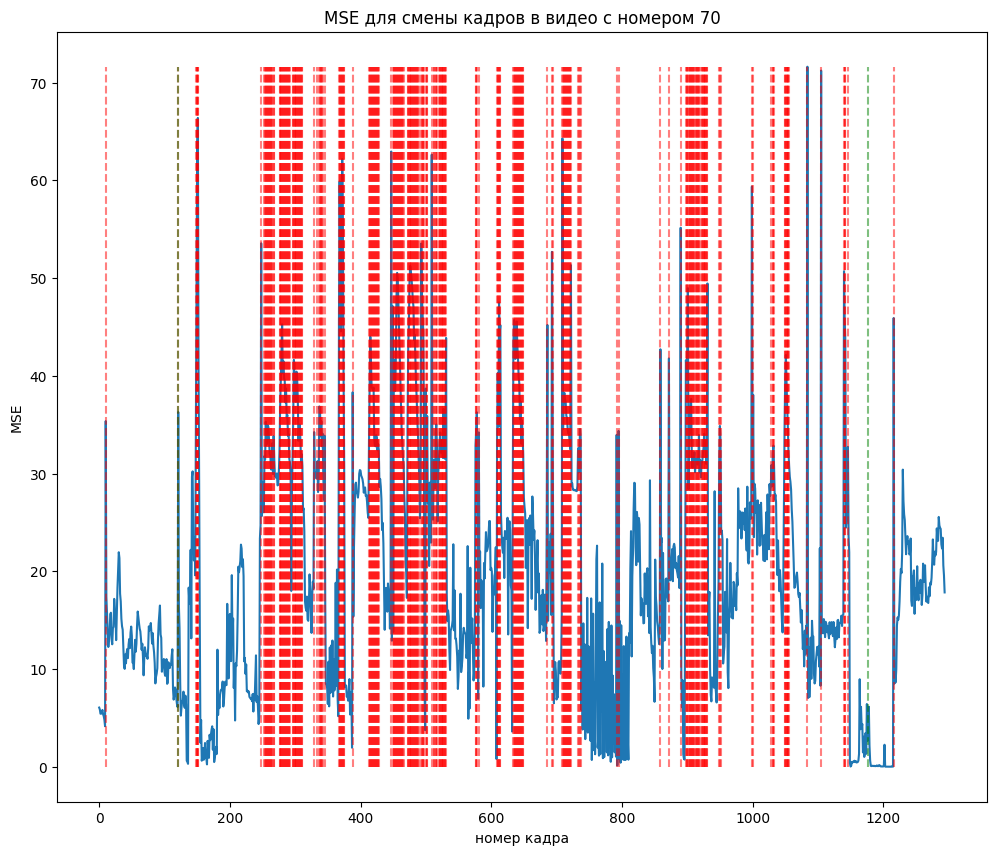

100%|██████████| 1272/1272 [00:21<00:00, 60.07it/s] [09:22<01:29,  9.94s/it]


6768 7800 is_start = True, is_end = True


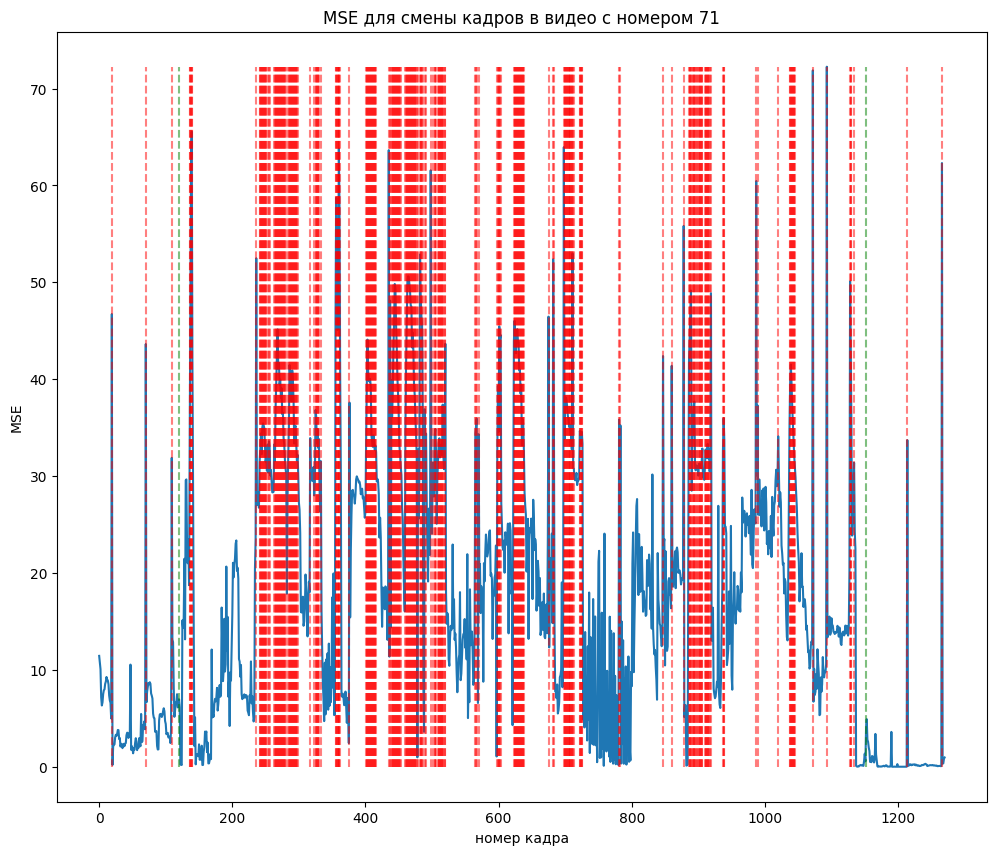

100%|██████████| 1344/1344 [00:20<00:00, 64.97it/s] [09:44<01:46, 13.37s/it]


13992 15096 is_start = True, is_end = False


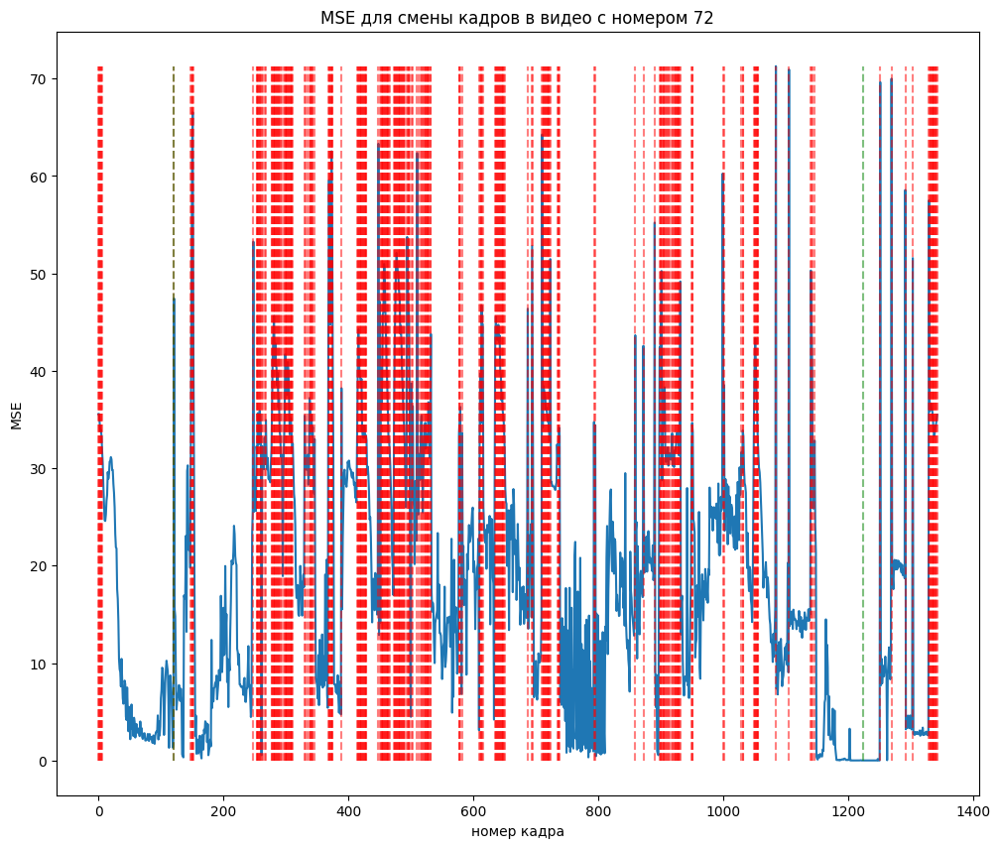

100%|██████████| 1296/1296 [00:19<00:00, 65.13it/s] [10:05<01:49, 15.64s/it]


5352 6408 is_start = False, is_end = True


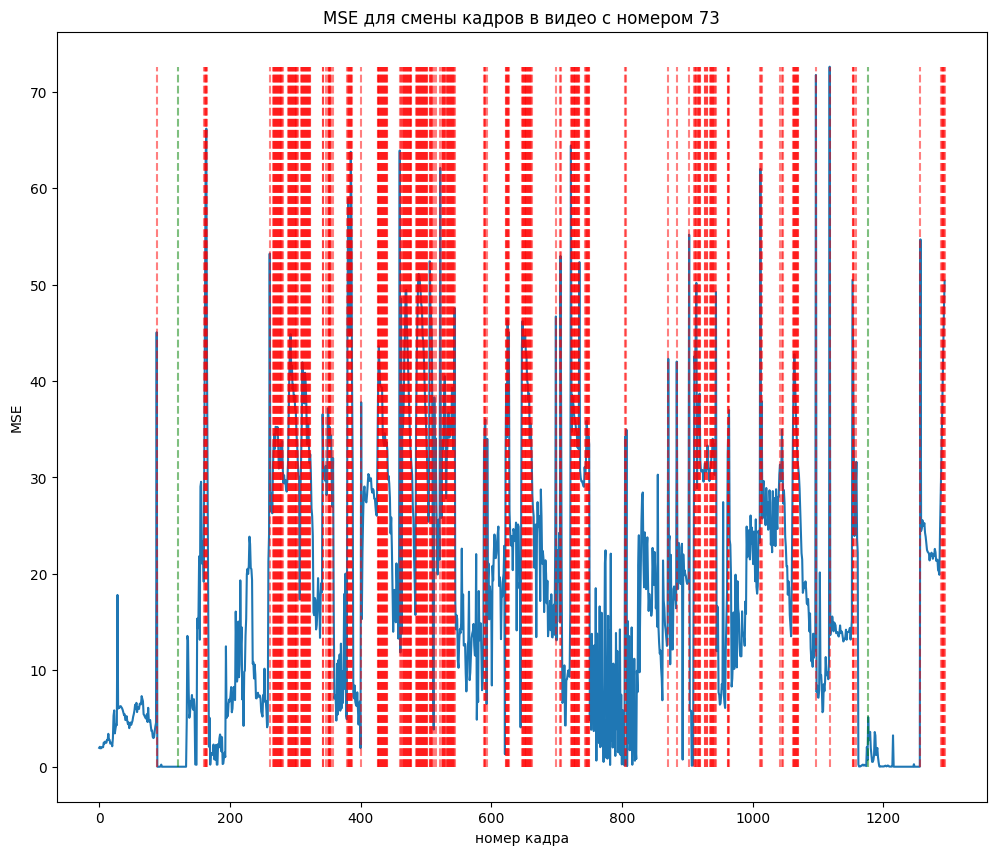

100%|██████████| 288/288 [00:04<00:00, 63.73it/s]80 [10:25<01:41, 16.99s/it]


96 168 is_start = False, is_end = True


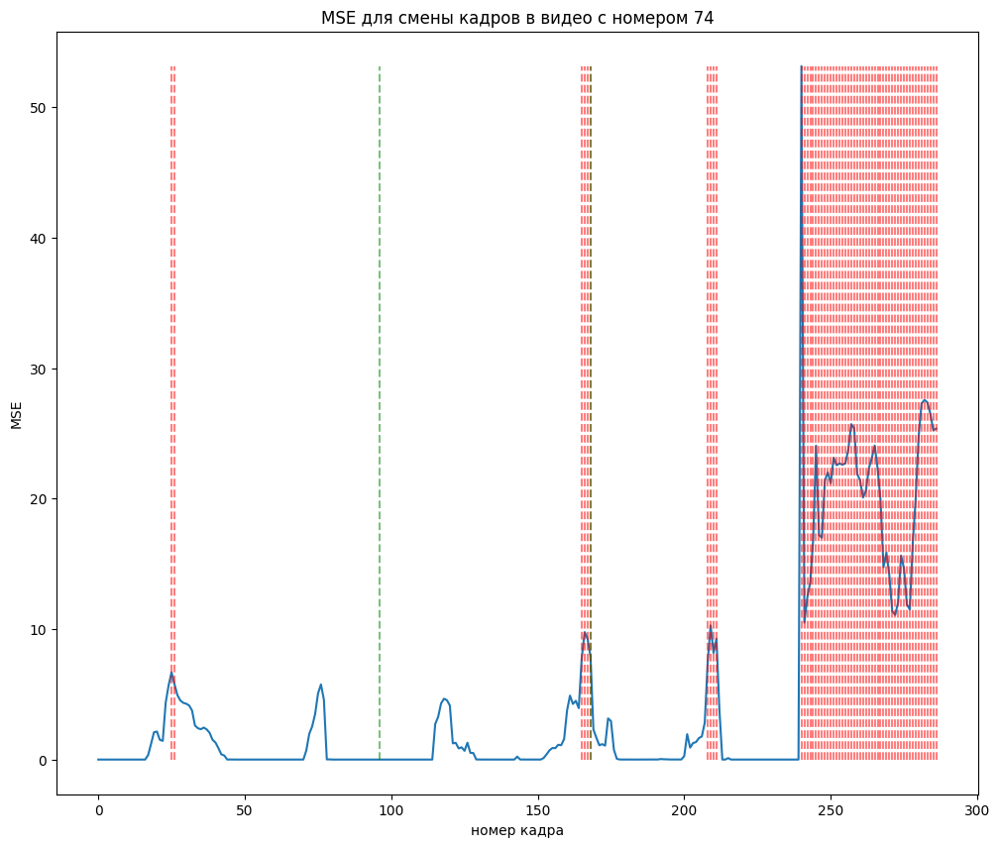

100%|██████████| 312/312 [00:04<00:00, 64.91it/s]80 [10:29<01:06, 13.29s/it]


96 192 is_start = True, is_end = True


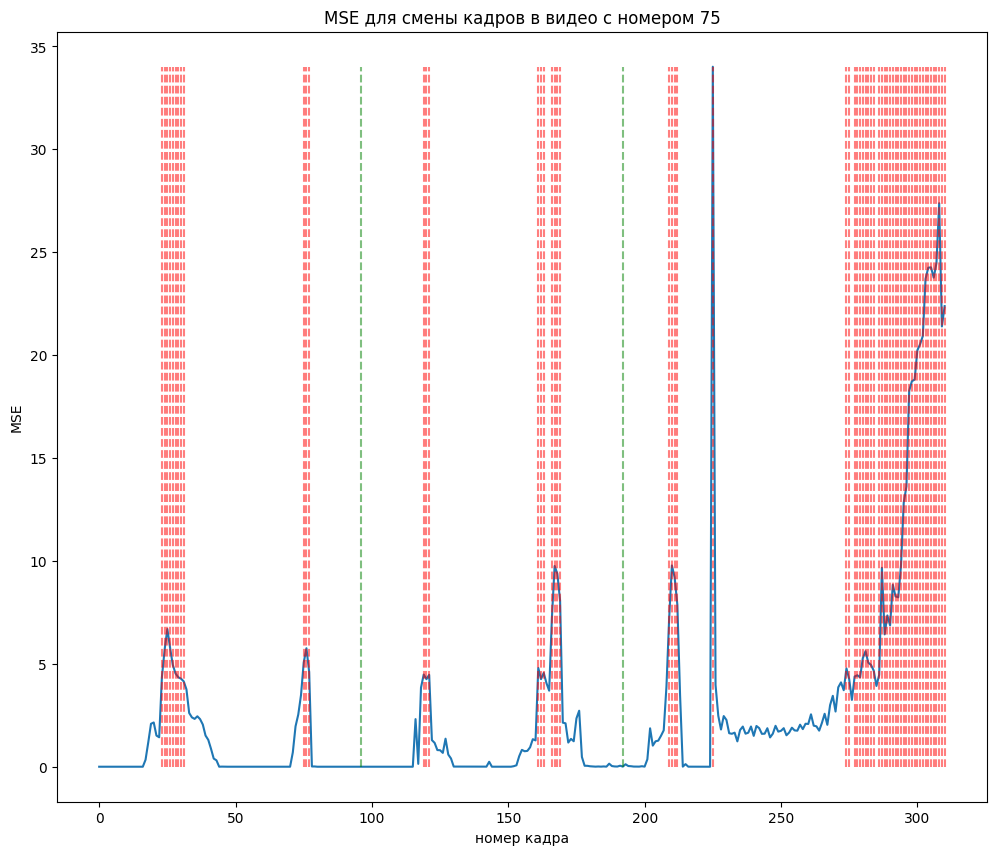

100%|██████████| 400/400 [00:06<00:00, 64.40it/s]80 [10:34<00:43, 10.79s/it]


9075 9225 is_start = True, is_end = False


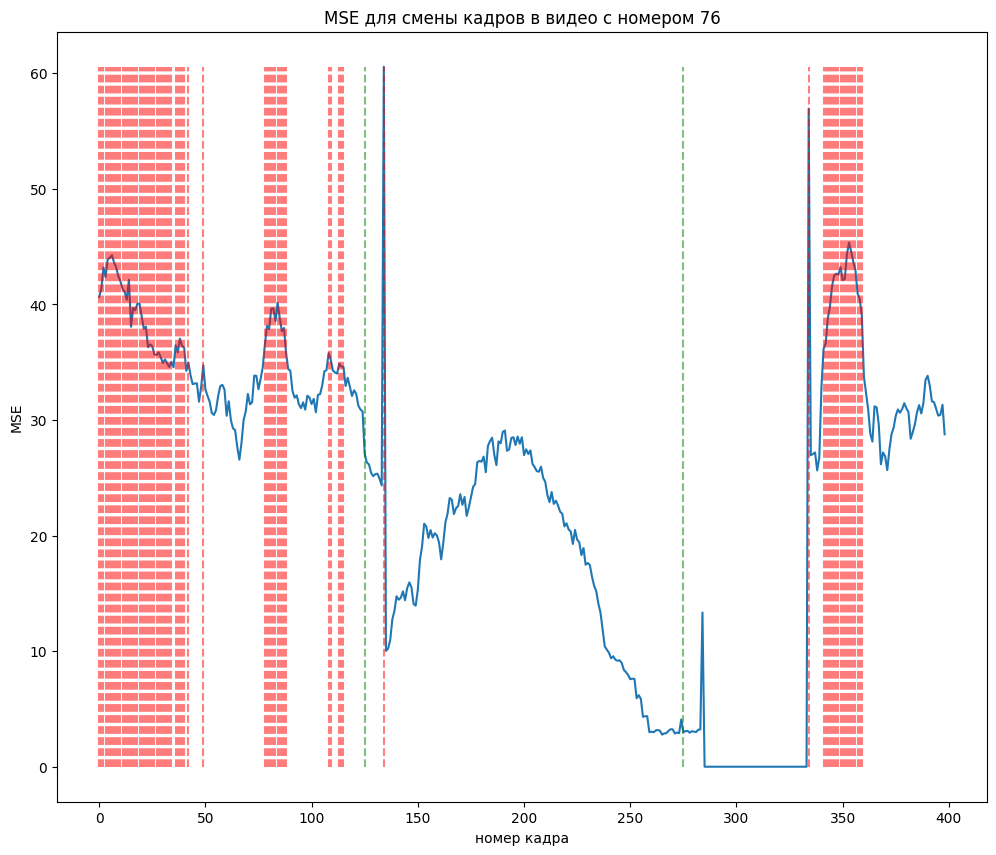

100%|██████████| 425/425 [00:06<00:00, 61.48it/s]80 [10:41<00:28,  9.47s/it]


2800 2975 is_start = True, is_end = False


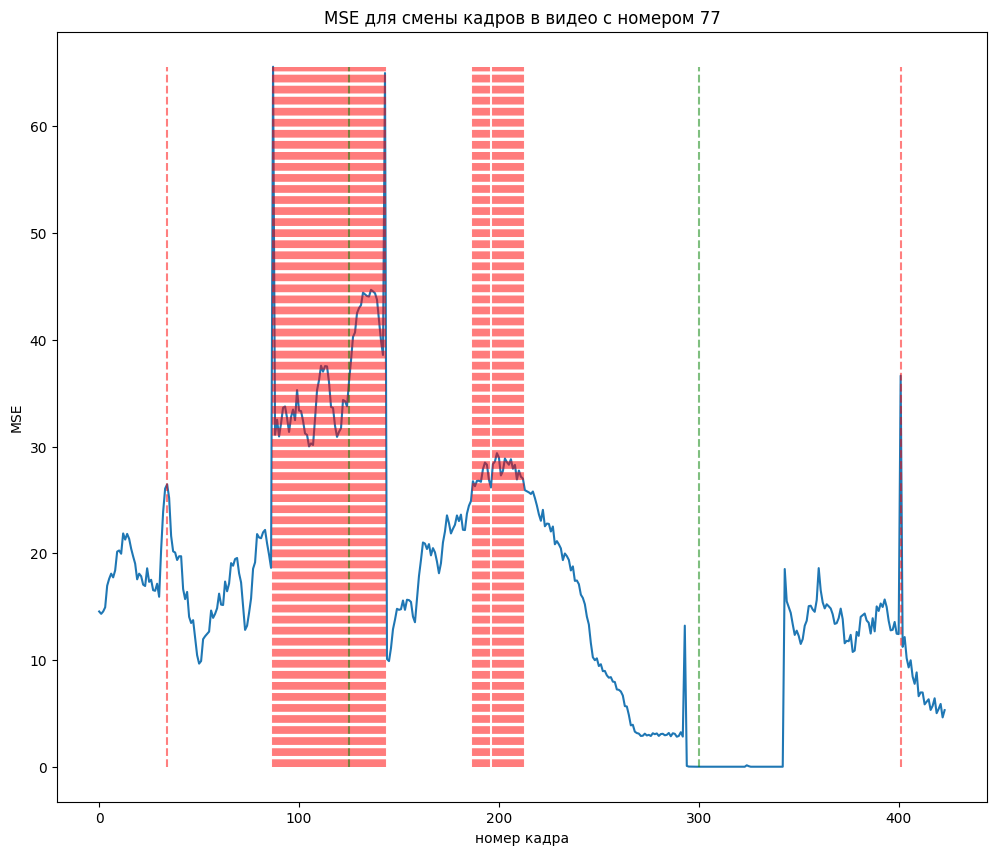

100%|██████████| 425/425 [00:07<00:00, 60.51it/s]80 [10:48<00:17,  8.76s/it]


6125 6300 is_start = True, is_end = False


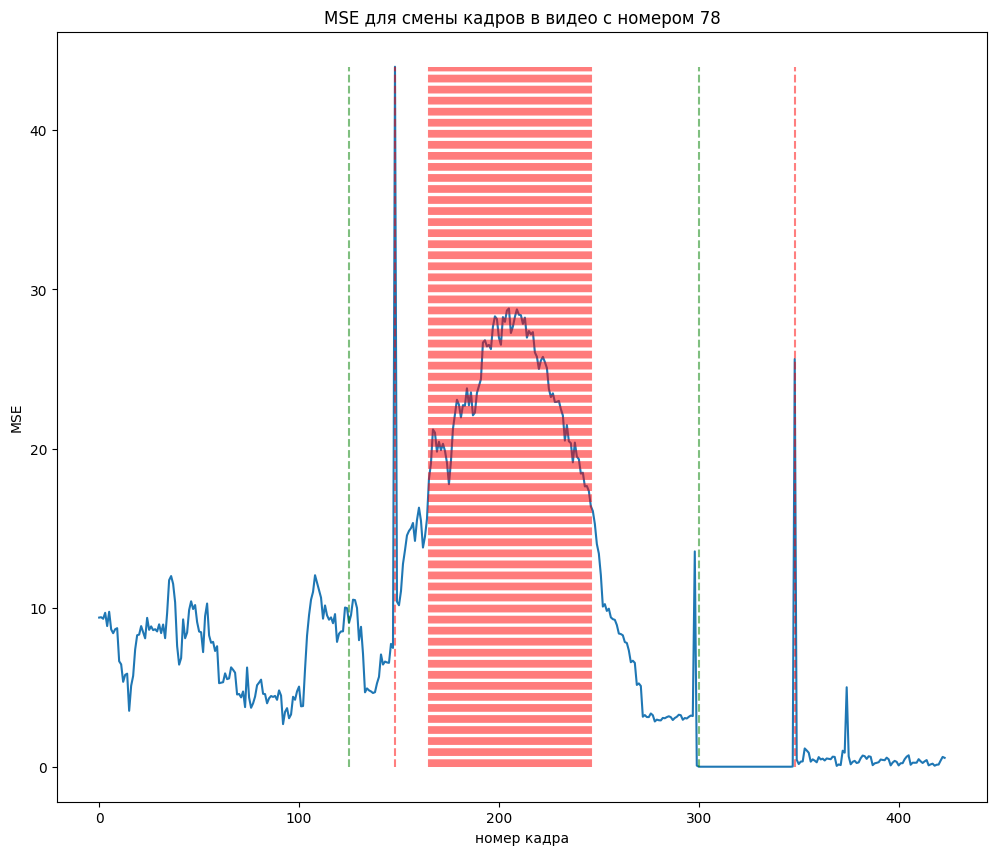

100%|██████████| 400/400 [00:06<00:00, 62.17it/s]80 [10:55<00:08,  8.29s/it]


6500 6650 is_start = True, is_end = False


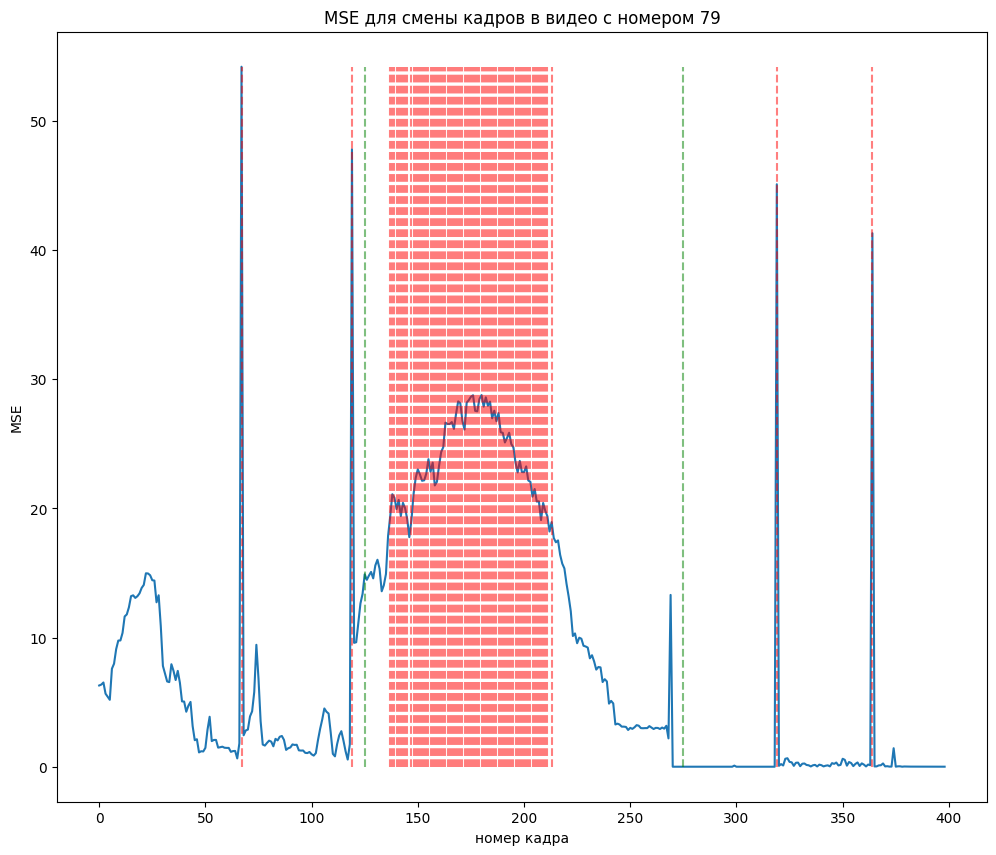

прогон по (почти)всем видео: 100%|██████████| 80/80 [11:02<00:00,  8.28s/it]


(0.8125, 0.825)

In [79]:
# Только в этих видео +- адекватно размечены интро
# normal_data = [
#     0, 5, 6, 9, 10, 13, 16, 17, 18, 19, 20, 21, 22,
#     23, 24, 28, 29, 34, 35, 36, 40, 41, 45, 47, 48,
#     49, 50, 51, 52, 53, 59, 61, 62, 65, 66, 67, 76, 78, 79
# ]
h = 20
accuracy_start = 0
accuracy_end = 0
n = len(data_train['data'])
# n = len(normal_data)
for i in tqdm(range(n), desc='прогон по (почти)всем видео'):
    p = peaks(i, h)
    if p:
        accuracy_start += p[1]
        accuracy_end += p[2]
accuracy_start / n, accuracy_end / n

### Судя по графикам можно взять threshold на уровне 20% пиков. В таком случае в 80% случаях границы интро будут среди каких-то двух выделенных пиков с погрешностью 1 * fps - 1 секунда.

## Общий пайплайн:
* для каждого видео построить график смены кадров
* выделить 20% пиков - среди них, почти наверное, находятся границы интро
* скормить модели кадры интро, смены кадров на шумовых пиках, парочку рандомных отрезков из видео - чтобы модель так же могла видеть какие фрагменты видео можно считать обычными переходами 

`То есть в итоге модели нужно подать склееный вектор T, состоящий из компонент из последнего пункта`, \
а на выходе модели должен получится вектор такой же же длины, как у T, у которого на местах соответствующих кадрам интро стоят 1, на других - нули. \
И решать задачу классификации с кросс-энтропией

In [ ]:
import torch
from random import random
import os
import cv2
import torch
import numpy as np
from random import randint
from torch.utils.data import DataLoader

class Dataset:
    def __init__(self, path, data, labels, h=20):
        self.data = data
        self.labels = labels
        self.path = path
        self.h = h  
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        name = self.data[idx]
        video_path = os.path.join(self.path, name, name + '.mp4')
        
        intro_frames = self._extract_intro(name, video_path)
        noise_frames = self._extract_noise_peaks(video_path, idx)
        random_frames = self._extract_random_fragments(video_path)
  
        intro_tensor = self._frames_to_tensor(intro_frames) # [num_frames, H, W, C]
        noise_tensor = self._frames_to_tensor(noise_frames) # [num_frames, H, W, C]
        random_tensors = torch.cat([self._frames_to_tensor(f) for f in random_frames if f], dim=0)
        T = torch.cat([intro_tensor, noise_tensor, random_tensors], dim=0)
        
        video_info = self.labels[name]
        start, end = video_info['start'], video_info['end']
        intro_len = end - start
        cap = cv2.VideoCapture(video_path)
        labels = [1] * intro_len + [0] * (cap.get(cv2.CAP_PROP_FRAME_COUNT) - intro_len)
        return T, labels
    
    def _extract_intro(self, name, video_path):
        video_info = self.labels[name]
        start, end = video_info['start'], video_info['end']
        frames = []
        
        cap = cv2.VideoCapture(video_path)
        fps = cap.get(cv2.CAP_PROP_FPS)
        start_frame = int(start * fps)
        end_frame = int(end * fps)
        
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
        current_frame = start_frame
        while current_frame <= end_frame:
            ret, frame = cap.read()
            if not ret:
                break
            frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            current_frame += 1
        
        cap.release()
        return frames
    
    def _extract_noise_peaks(self, video_path, ind_video):
        peak_indices, _, __ = peaks(ind_video, self.h, show_flag = False)
        frames = []
        
        cap = cv2.VideoCapture(video_path)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        for i in peak_indices:
            if i >= total_frames - 1:
                continue
                
            cap.set(cv2.CAP_PROP_POS_FRAMES, i)
            ret1, frame1 = cap.read()
            ret2, frame2 = cap.read()
            
            if ret1 and ret2:
                frames.extend([
                    cv2.cvtColor(frame1, cv2.COLOR_BGR2RGB),
                    cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB)
                ])
        
        cap.release()
        return frames
    
    def _extract_random_fragments(self, video_path, num_fragments=3):
        cap = cv2.VideoCapture(video_path)
        fps = cap.get(cv2.CAP_PROP_FPS)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        fragments = []
        
        for _ in range(num_fragments):
            duration = randint(3, 10)
            max_start = total_frames - int(duration * fps)
            
            if max_start <= 0:
                continue
                
            start_frame = randint(0, max_start)
            cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
            
            fragment = []
            for _ in range(int(duration * fps)):
                ret, frame = cap.read()
                if not ret:
                    break
                fragment.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            
            if fragment:
                fragments.append(fragment)
        
        cap.release()
        return fragments
    
    def _frames_to_tensor(self, frames):
        if not frames:
            return torch.tensor([])
        return torch.stack([torch.from_numpy(f).float() / 255.0 for f in frames])    

In [20]:
import torch.nn as nn
import torch.nn.functional as F
def build_sinusoidal_embeddings(length, dim):
    position = torch.arange(length).unsqueeze(1)
    div_term = torch.exp(torch.arange(0, dim, 2) * -(np.log(10000.0) / dim))
    pe = torch.zeros(length, dim)
    pe[:, 0::2] = torch.sin(position * div_term)
    pe[:, 1::2] = torch.cos(position * div_term)
    return pe.unsqueeze(0)

class FrameEncoder(nn.Module):
    def __init__(self, embed_dim):
        super().__init__()
        self.cnn = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=5, stride=2, padding=2),  # [B, 32, H/2, W/2]
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1), # [B, 64, H/4, W/4]
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1)),                           # [B, 64, 1, 1]
        )
        self.fc = nn.Linear(64, embed_dim)                         # [B, embed_dim]

    def forward(self, x):  
        B = x.shape[0]
        x = self.cnn(x)              # [T, 64, 1, 1]
        x = x.view(B, -1)            # [T, 64]
        x = self.fc(x)               # [T, embed_dim]
        return x

class VideoTransformerEncoder(nn.Module):
    def __init__(self, embed_dim=128, num_heads=4, num_layers=2, dropout=0.1):
        super().__init__()
        self.embed_dim = embed_dim
        self.encoder = FrameEncoder(embed_dim)

        encoder_layer = nn.TransformerEncoderLayer(d_model=embed_dim,
                                                   nhead=num_heads,
                                                   dim_feedforward=embed_dim * 4,
                                                   dropout=dropout,
                                                   batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.classifier = nn.Linear(embed_dim, 1) 

    def forward(self, x, labels=None):  # x: [T, C, H, W], labels: [T]
        T = x.size(0)
        x = self.encoder(x)               # [T, embed_dim]
        x = x.unsqueeze(0)                # [1, T, embed_dim]
        pos_embed = build_sinusoidal_embeddings(T, self.embed_dim)
        x = x + self.pos_embed[:, :T, :]  # позиционные эмбеддинги

        x = self.transformer(x)           # [1, T, embed_dim]
        x = x.squeeze(0)                  # [T, embed_dim]
        logits = self.classifier(x).squeeze(-1)  # [T]

        if labels is not None:
            loss_fn = nn.BCEWithLogitsLoss()
            loss = loss_fn(logits, labels.float())
            return loss, logits
        else:
            return logits
